<h1 style="background-color:#F5FBEF;
          color:#6AA84F;
          font-size:160%;
          font-weight:bold;
          padding:10px;
          text-align:center;
          border-radius:8px;
          font-family:'Segoe UI', sans-serif;">
🏦 Enterprise Financial Inclusion in pakistan 🇵🇰
</h1>
<div style="
    background-color: #FAF9F6;
    padding: 30px;
    border-radius: 12px;
    border: 1px solid #DDD;
    display: flex;
    align-items: center;
    gap: 30px;
    font-family: 'Segoe UI', sans-serif;
">

  <!-- Logo -->
  <img src="https://github.com/MELSHAMA/DataKit---Financial-Inclusion-/raw/main/Pakistan/Images/Datakind_financial_inclusion_logo.png"
       width="160"
       style="flex-shrink: 0; border-radius: 8px; box-shadow: 2px 2px 8px rgba(0,0,0,0.1);"/>

  <!-- Text Section -->
  <div style="max-width: 70%;">
    <p style="margin-top: 15px; margin-left: 15px; color: #333; font-size: 15px; line-height: 1.6;">
      This notebook presents an exploratory and clustering analysis of the <b>World Bank Enterprise Survey 2022</b> in Pakistan.
      The focus is on <b>financial inclusion</b>: understanding how access to financing differs by firm characteristics such as size, location, industry, and growth.
    </p>
    <p style="margin-top: 5px; margin-left: 15px; color: #444;">
    📈 EDA | 🏷️ Feature Engineering  | 💼 Clustering | 🧠 Profiling
    </p>
  </div>

</div>



 <div style="background-color:white;
            border-left:6px solid #f7f7f7;
            padding:10px 15px;
            font-size:100%;
            border-radius:6px;
            font-family:'Georgia', serif;">
ℹ️ <b>World Bank Enterprise Surveys (WBES)</b>   are nationally representative firm-level surveys with top managers and owners of businesses in over 160 economies, reaching 180 in upcoming years, that provide insight into many business environment topics such as access to finance, corruption, infrastructure, and performance, among others.
</div>

<h1 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Library Import
</h1>

In [500]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

!pip install kmodes
from kmodes.kmodes import KModes

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
import warnings
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pakistan-2022-full-data/Pakistan-2022-full-data.dta


In [251]:
#Find pandas version
pd.__version__

'2.2.3'

In [252]:
# Remove display limit for better visibility
pd.options.display.max_columns = None
pd.options.display.max_rows = 30

<h1 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Functions
</h1>

Here below in this section I will group any function that I will use later in the notebook.

In [253]:

def set_custom_theme(background="lightgray", palette_style="professional", font_scale=1.2):
    """
    Set a professional theme for Seaborn and Matplotlib.
    
    Parameters:
    - background: 'lightgray', 'lightblue', 'warmbeige'
    - palette_style: 'professional', 'startup', 'minimal'
    - font_scale: scaling factor for fonts
    """
    
    # 1. Choose Background
    background_colors = {
        'lightgray': '#f7f7f7',
        'lightblue': '#eef5ff',
        'warmbeige': '#fdf6e3'
    }
    bg_color = background_colors.get(background, '#f7f7f7')  # default to light gray

    # 2. Choose Color Palette
    if palette_style == 'professional':
        custom_palette = ["#1B9E77", "#D95F02", "#7570B3", "#E7298A", "#66A61E"]
    elif palette_style == 'startup':
        custom_palette = ["#005f73", "#0a9396", "#94d2bd", "#ee9b00", "#ca6702"]
    elif palette_style == 'minimal':
        custom_palette = ["#636363", "#a6bddb", "#3690c0", "#74c476", "#fdbb84"]
    else:
        custom_palette = sns.color_palette("colorblind")

    # 3. Apply Seaborn Theme
    sns.set_theme(
        style='whitegrid',
        palette=custom_palette,
        font_scale=font_scale,
        rc={
            'axes.facecolor': bg_color,
            'figure.facecolor': bg_color,
            'axes.edgecolor': 'black',
            'axes.linewidth': 1.2,
            'grid.color': 'gray',
            'grid.linestyle': '--',
            'grid.linewidth': 0.6,
            'xtick.bottom': True,
            'ytick.left': True
        }
    )

    # 4. Matplotlib adjustments
    plt.rcParams['font.family'] = 'DejaVu Sans'
    plt.rcParams['axes.titlesize'] = 18
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['figure.dpi'] = 110
    plt.rcParams['savefig.dpi'] = 300

    print(f"✅ Theme applied: Background = {background}, Palette = {palette_style}")

In [254]:
def set_custom_theme(background="lightgray", palette_style="professional", font_scale=1.2):
    """
    Set a professional theme for Seaborn and Matplotlib.
    
    Parameters:
    - background: 'lightgray', 'lightblue', 'warmbeige'
    - palette_style: 'professional', 'startup', 'minimal'
    - font_scale: scaling factor for fonts
    """
    
    # 1. Choose Background
    background_colors = {
        'lightgray': '#f7f7f7',
        'lightblue': '#eef5ff',
        'warmbeige': '#fdf6e3'
    }
    bg_color = background_colors.get(background, '#f7f7f7')  # default to light gray

    # 2. Choose Color Palette
    if palette_style == 'professional':
        custom_palette = ["#1B9E77", "#D95F02", "#7570B3", "#E7298A", "#66A61E"]
    elif palette_style == 'startup':
        custom_palette = ["#005f73", "#0a9396", "#94d2bd", "#ee9b00", "#ca6702"]
    elif palette_style == 'minimal':
        custom_palette = ["#636363", "#a6bddb", "#3690c0", "#74c476", "#fdbb84"]
    else:
        custom_palette = sns.color_palette("colorblind")

    # 3. Apply Seaborn Theme
    sns.set_theme(
        style='whitegrid',
        palette=custom_palette,
        font_scale=font_scale,
        rc={
            'axes.facecolor': bg_color,
            'figure.facecolor': bg_color,
            'axes.edgecolor': 'black',
            'axes.linewidth': 1.2,
            'grid.color': 'gray',
            'grid.linestyle': '--',
            'grid.linewidth': 0.6,
            'xtick.bottom': True,
            'ytick.left': True
        }
    )

    # 4. Matplotlib adjustments
    plt.rcParams['font.family'] = 'DejaVu Sans'
    plt.rcParams['axes.titlesize'] = 18
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['xtick.labelsize'] = 12
    plt.rcParams['ytick.labelsize'] = 12
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['figure.dpi'] = 110
    plt.rcParams['savefig.dpi'] = 300

    print(f"✅ Theme applied: Background = {background}, Palette = {palette_style}")

In [255]:
def find_outliers_iqr(df, column):
    # Step 1: Work only with non-NaN values
    
    col_data = df[column].dropna()

    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Step 2: Compute outlier mask only on valid (non-NaN) values
    outlier_mask = (col_data < lower_bound) | (col_data > upper_bound)

    # Step 3: Get index of outliers
    outlier_indices = col_data[outlier_mask].index

    # Step 4: Select full rows from original df using those indices
    outliers = df.loc[outlier_indices]

    # Step 5: Percent of outliers from valid observations only
    total_valid = col_data.shape[0]
    percent = (len(outlier_indices) / total_valid) * 100 if total_valid > 0 else 0


    return outliers, lower_bound, upper_bound, percent

<h1 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Dataset loading
</h1>

In [256]:
df = pd.read_stata("/kaggle/input/pakistan-2022-full-data/Pakistan-2022-full-data.dta")
df.head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,idstd,id,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a12,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b1x,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,b8x,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c34bx,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a1x,d1a6a,d1a6b,d1a6c,d1a6cx,d1a3,d2,d2x,d2a1,d2a1x,n3,d3a,d3b,d3c,d31x,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d38x,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,h3x,h4x,PK16,h5,h6x,h7x,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,PK24kx,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g5bx,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata
0,1012049,1,Food,Medium,Islamabad,Panel,Food,Manufacturing,Islamabad,38,Medium,31,7,2022,15,12,90,int010,Urdu,Establishment,0,1,Yes,Yes,2.0,Yes,No,Yes,NaN,2021,6,30,Sole proprietorship,,100,Yes,100,0,0,0,No,NaN,1995,108,1995,7,No,No,,No,NaN,NaN,NaN,6000,No,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,No,NaN,NaN,Reduce electricity consumption,No,NaN,NaN,NaN,2000,Gallons,,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,No,NaN,NaN,The establishment does not have an internet co...,NaN,NaN,NaN,NaN,With some difficulty,No obstacle,Manufacturing of,Manufacturing of flour from wheat,NaN,NaN,NaN,,100,150000000.0,one hundred fifty million,150000000.0,One hundred fifty million,140000000.0,100,0,0,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,High trade costs,100,0,NaN,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No obstacle,No obstacle,Yes,No,Strongly agree,Strongly agree,We fixed it but did not take further action,Yes,1-2 production performance indicators,No,NaN,NaN,NaN,No,NaN,Does not apply (spontaneous),Rarely or never,National â main product sold mostly across t...,60.0,NaN,25.0,No,"Small or medium private firms, excluding this ...",No,No,No,No,No,No,Domestic private firms operating in the same p...,They avoid labor taxes or regulations,Regulations that restrict the establishmentâ...,No,"Yes, there is more competition",Prices set by HQ,No,NaN,Minor obstacle,No,NaN,,,NaN,No,,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,No,NaN,Yes,100.0,106.0,Availability of skilled labor force,Access to markets,100,100,No,NaN,NaN,Does not apply (spontaneous),NaN,NaN,NaN,NaN,,No obstacle,No,NaN,Yes,Yes,2,NaN,NaN,No,NaN,NaN,No obstacle,Yes,80,0,0,20,0,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [257]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Columns: 434 entries, idstd to strata
dtypes: category(352), float32(3), float64(14), int16(7), int32(2), int8(40), object(16)
memory usage: 1.1+ MB


In [258]:
df.duplicated().sum()

0

In [259]:
df.describe()

,idstd,id,a6c,a14d,a14m,a14y,a14h,a14min,a1,competition_select,tax_select,a20y,a20m,a20d,b3,c15,c16,c17,d4,d5a,d10,d11,d14,d15a,f2,i1,h7a,j6,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,l9b1,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2b1,a15d,a15m,a15y,a15h,a15min,a19h,a19m,a13,d1a2_v4,d1a2,a4b,wstrict,wmedian,wweak,strata
count,1.300000e+03,1300.000000,1300.000000,1300.000000,1300.000000,1300.0,1300.000000,1300.000000,1300.0,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,847.000000,22.000000,18.000000,124.000000,123.000000,1300.000000,1027.000000,107.000000,106.000000,847.000000,1300.000000,1300.000000,50.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,356.000000,1300.000000,1300.00000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,4.530000e+02,1300.000000,1300.000000,1300.0,1300.000000,1300.000000,198.000000,198.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000
mean,1.012698e+06,16529.560769,104.034615,15.898462,8.592308,2022.0,13.133846,28.590000,90.0,0.512308,0.500769,2021.273846,7.715385,30.313846,81.554615,1.074380,11.727273,10.388889,15.870968,-2.349593,-1.464615,0.381694,17.953271,-2.066038,91.081464,1.615385,1.496923,-0.780000,3.517692,3.716154,3.621538,3.630769,3.456923,3.056923,24.525281,8.495385,8.57000,8.223846,8.174615,8.362308,8.260769,8.546154,8.607692,8.745385,8.953846,8.246923,7.726923,7.050000,6.576154,5.460000,3.240843e+06,15.945385,8.622308,2022.0,14.123846,30.889231,1.474747,17.994949,1.919231,3009.889231,3382.074615,33.495385,88.466347,88.477310,88.483330,91.297692
std,3.754220e+02,15215.744168,333.481940,8.777490,2.236227,0.0,2.972638,17.513274,0.0,0.500041,0.500192,0.451250,2.791537,0.464233,27.616547,2.711571,11.909107,13.434542,20.730939,4.981908,2.924423,3.013675,19.704603,4.955553,35.335029,0.700650,2.999742,8.229588,1.666727,1.572537,1.639062,1.727549,1.779316,1.774377,95.186973,4.377753,4.41624,4.396256,4.456907,4.442460,4.435198,4.291014,4.041159,4.085567,4.069189,4.421389,4.408688,4.358965,4.026229,2.872304,1.239792e+07,8.780057,2.226157,0.0,3.462664,17.690132,0.975262,18.280804,0.920437,1582.711802,1527.221207,15.286864,118.424423,118.455208,118.499359,68.585061
min,1.012049e+06,1.000000,2.000000,1.000000,5.000000,2022.0,0.000000,0.000000,90.0,0.000000,0.000000,2020.000000,1.000000,30.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-9.000000e+00,1.000000,5.000000,2022.0,0.000000,0.000000,0.000000,0.000000,1.000000,1010.000000,1511.000000,15.000000,1.000000,1.000000,1.000000,1.000000
25%,1.012374e+06,706.750000,12.000000,7.000000,7.000000,2022.0,11.000000,13.000000,90.0,0.000000,0.000000,2021.000000,6.000000,30.000000,60.000000,2.000000,5.000000,2.000000,5.000000,-8.000000,0.000000,0.000000,5.000000,-8.000000,72.000000,1.000000,2.000000,0.000000,2.000000,3.000000,2.000000,2.000000,2.000000,1.000000,4.000000,4.000000,5.00000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,6.000000,6.000000,4.000000,4.000000,3.000000,3.000000,3.000000,2.200000e+05,8.000000,7.000000,2022.0,12.000000,15.000000,1.000000,1.000000,1.000000,1430.000000,1810.000000,18.000000,7.214286,7.214286,7.214286,29.000000
50%,1.012698e+06,18367.000000,27.500000,18.000000,8.000000,2022.0,13.000000,28.000000,90.0,1.000000,1.000000,2021.000000,6.000000,30.000000,100.0

The exports below are done to allow exploring the dataset in different tools that dont accept .dta extension and also to enable me create a data dictionary and perform column section using google sheets.

In [260]:
# Create CSV containing column names and their types or nature as interpreted by pandas
df.dtypes.to_csv(path_or_buf="/kaggle/working/Pakistan_2022_full_data_columns.csv",header=["Type"],index_label="Name")

In [261]:
# Create CSV file 
df.to_csv(path_or_buf="/kaggle/working/Pakistan_2022_full_data.csv")

In [262]:
#drop ID columns
df1 = df.drop(columns=['idstd','id'])


In [263]:
# drop free text columns and screener number
list_obj_col = []
for col in df1.columns:
    if df1[col].dtype =='object':
        list_obj_col.append(col)
df1 = df1.drop(columns=list_obj_col)

In [264]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Columns: 416 entries, a4a to strata
dtypes: category(352), float32(3), float64(14), int16(7), int8(40)
memory usage: 993.6 KB


In [265]:
   # Parameters:
    #- background: 'lightgray', 'lightblue', 'warmbeige'
    #- palette_style: 'professional', 'startup', 'minimal'
    #- font_scale: scaling factor for fonts
set_custom_theme('lightgray','startup')

✅ Theme applied: Background = lightgray, Palette = startup


<h1 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Analysis
</h1>


 <div style="background-color:white;
            border-left:6px solid #f7f7f7;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
I will be doing data cleaning, EDA and feature engineering simultaneously. I will try to split features by topic.
</div>

* Display stats, info and values

In [266]:
#explore df1 column values
for col in df1.columns:
   print('**',col,'**')
   print(df1[col].info())
   print('------------------------------------')
   print(df1[col].describe())
   print('------------------------------------')
   print(df1[col].value_counts(normalize=True)*100)
   print('####################################')

** a4a **
<class 'pandas.core.series.Series'>
RangeIndex: 1300 entries, 0 to 1299
Series name: a4a
Non-Null Count  Dtype   
--------------  -----   
1300 non-null   category
dtypes: category(1)
memory usage: 1.8 KB
None
------------------------------------
count                    1300
unique                     10
top       Other Manufacturing
freq                      199
Name: a4a, dtype: object
------------------------------------
a4a
Other Manufacturing                  15.307692
Retail                                9.846154
Food                                  9.692308
Non-Metallic Mineral Products         9.538462
Hotels & Restaurants                  9.461538
Textiles                              9.230769
Garments                              9.230769
Chemicals & Chemical Products         9.230769
Motor Vehicles & Transport Equip.     9.230769
Other Services                        9.230769
Name: proportion, dtype: float64
####################################
** a6a **
<class 

* Determine values having null and caculate their counts.

In [267]:
# columns with null
print("Columns with nulls")
columns_with_nulls_list = []
for col in df1.columns:
    if df1[col].isna().sum() > 0:
        columns_with_nulls_list.append(col)
        print(col,' : count =', df1[col].isna().sum(),'; percent = ',round(100* (df1[col].isna().sum()/len(df1[col])),2))

Columns with nulls
a7a  : count = 1017 ; percent =  78.23
a7b  : count = 1017 ; percent =  78.23
a11  : count = 1123 ; percent =  86.38
a7c  : count = 1123 ; percent =  86.38
a9  : count = 1194 ; percent =  91.85
b4a  : count = 1229 ; percent =  94.54
c4  : count = 1260 ; percent =  96.92
c5  : count = 1260 ; percent =  96.92
c31  : count = 1260 ; percent =  96.92
c7  : count = 706 ; percent =  54.31
c8a  : count = 712 ; percent =  54.77
c8b  : count = 712 ; percent =  54.77
c9a  : count = 861 ; percent =  66.23
c9b  : count = 1145 ; percent =  88.08
c11  : count = 722 ; percent =  55.54
PK1  : count = 722 ; percent =  55.54
PK3  : count = 1241 ; percent =  95.46
PK4  : count = 1241 ; percent =  95.46
c13  : count = 1283 ; percent =  98.69
c14  : count = 1283 ; percent =  98.69
c33  : count = 1283 ; percent =  98.69
c34b  : count = 119 ; percent =  9.15
c15  : count = 453 ; percent =  34.85
c152  : count = 847 ; percent =  65.15
c16  : count = 1278 ; percent =  98.31
c162  : count = 12

* Determine variable which have outliers and calculate the percent of outliers.

In [268]:
# columns with outliers
outliers_dict={}
print("Columns with outliers")
for col in df1.columns:
    if df1[col].dtype not in ['category', 'str']:
        outliers, lower_bound, upper_bound, percent = find_outliers_iqr(df1, col)
        if percent > 0:
            print(col, " : percent = ",round(percent,2))
            outliers_dict[col] = percent


Columns with outliers
a6c  : percent =  9.62
a14h  : percent =  1.31
b3  : percent =  2.23
c15  : percent =  12.51
c17  : percent =  5.56
d4  : percent =  22.58
d10  : percent =  21.92
d11  : percent =  13.05
d14  : percent =  1.87
f2  : percent =  0.83
i1  : percent =  0.23
h7a  : percent =  9.69
j6  : percent =  28.0
l9b1  : percent =  11.8
n2b1  : percent =  10.82
a15h  : percent =  2.46
a19h  : percent =  3.03
wstrict  : percent =  2.85
wmedian  : percent =  2.92
wweak  : percent =  2.92


<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Business sector and activity
</h2>

* a4a - Industry Sampling Sector;
* a4b_v4 - Industry Screener Sector;
* d1a1a  - Main Product/Service (By The Largest % of Annual Sales) In Last Fiscal Year)

In [269]:
df1["a4a"].value_counts()

a4a
Other Manufacturing                  199
Retail                               128
Food                                 126
Non-Metallic Mineral Products        124
Hotels & Restaurants                 123
Textiles                             120
Garments                             120
Chemicals & Chemical Products        120
Motor Vehicles & Transport Equip.    120
Other Services                       120
Name: count, dtype: int64

In [270]:
df1["a4a"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 1300 entries, 0 to 1299
Series name: a4a
Non-Null Count  Dtype   
--------------  -----   
1300 non-null   category
dtypes: category(1)
memory usage: 1.8 KB


In [271]:
df1["a4b_v4"].value_counts()

a4b_v4
Retail                                        191
Textiles                                      138
Non-metallic mineral products                 115
Food                                          114
Food and beverage                              93
                                             ... 
Repair of computers and household goods         3
43                                              2
Computer, electronic, and optical products      2
Tobacco products                                2
Telecommunications                              2
Name: count, Length: 35, dtype: int64

In [272]:
df1["a4b_v4"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 1300 entries, 0 to 1299
Series name: a4b_v4
Non-Null Count  Dtype   
--------------  -----   
1300 non-null   category
dtypes: category(1)
memory usage: 2.7 KB


In [273]:
df1["d1a1a"].value_counts()

d1a1a
Manufacturing of        847
Retail trade of         197
Restaurant               90
Wholesale trade of       49
Hotel                    47
Provide services of      41
Construction of          29
Name: count, dtype: int64

In [274]:
df1["d1a1a"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 1300 entries, 0 to 1299
Series name: d1a1a
Non-Null Count  Dtype   
--------------  -----   
1300 non-null   category
dtypes: category(1)
memory usage: 1.7 KB


Multiple variables tackle the industry and main activity of the establishment. Which columns to include and which to exclude among `a4a`,`a4b_v4`&`d1a1a`. To get more information I will display them in a heirarical representation to understand more how these variables are related.

In [275]:
grouped = df1.groupby(["a4a","a4b_v4","d1a1a"],observed=True).agg({"b1":"count"})
grouped

b1
a4a            a4b_v4                                  d1a1a                   
Food           Food                                    Manufacturing of      96
               Beverages                               Manufacturing of       1
               Textiles                                Manufacturing of       3
               Pharmaceutical products                 Manufacturing of       1
               Other manufacturing                     Manufacturing of       1
...                                                                          ..
Other Services Food and beverage                       Restaurant             4
               Telecommunications                      Provide services of    2
               Computer programming                    Provide services of    4
               Travel agency, tour operator            Provide services of    2
               Repair of computers and household goods Provide services of    2

[138 rows x 1 columns]

From the result I will exclude `a4a` because it is very broad and at times not indicative & `d1a1x` because it's very detailed and free input meaning the same activity is writen in numerous ways which make it hard to summarize.
Also,noted that `a4b_v4` contain numerical values 42 and 43.

In [276]:
df1[(df1["a4b_v4"]==42)  |  (df1["a4b_v4"]==43)][["a4a","a4b_v4","d1a1a"]]

,a4a,a4b_v4,d1a1a
462,Other Services,42,Construction of
631,Other Services,42,Construction of
650,Other Services,43,Construction of
651,Other Services,42,Construction of
673,Other Services,43,Construction of
674,Other Services,42,Construction of
1136,Motor Vehicles & Transport Equip.,42,Provide services of


As Section F: Construction
	•	41: Construction of buildings
	•	42: Civil engineering
	•	43: Specialized construction activities
Therefor 42 and 43 should be replaced by "Construction (Section F: (41-43))" except for record 1136 which is not concerned with construction but with "Services of motor vehicles" so it should be replaced as such.

Final element, From Pakistan_2022_ES_Implementation_Report.pdf I quote "The variable d1a2_v4 denotes the main activity of the establishment, as obtained during the WBES interview, coded in the four-digit ISIC Rev. 4. Users should note that this activity may differ from the industry
classification given in the Sampling Frame, a4a. Users are generally advised to use industry categories based on the realized information in d1a2_v4." So according to this advise I will keep only a4b_v4.

In [277]:
# Change value of a4b_v4 in row 1136 to "Services of motor vehicles"
df1.loc[1136,"a4b_v4"]= "Services of motor vehicles"
df1.loc[1136,["a4a","a4b_v4","d1a1a"]]

a4a       Motor Vehicles & Transport Equip.
a4b_v4           Services of motor vehicles
d1a1a                  Provide services of 
Name: 1136, dtype: object

In [278]:
# Replace 42 and 43 in the rest of the rows by 'Construction (Section F: (41-43))'
df1['a4b_v4'] = df1['a4b_v4'].astype(str)
df1.loc[df1['a4b_v4'].isin(['42', '43']), 'a4b_v4'] = 'Construction (Section F: (41-43))'
df1['a4b_v4'] = df1['a4b_v4'].astype('category')
df1[ 'a4b_v4'].value_counts()

a4b_v4
Retail                                        191
Textiles                                      138
Non-metallic mineral products                 115
Food                                          114
Chemical and chemical products                 93
                                             ... 
Beverages                                       3
Repair of computers and household goods         3
Telecommunications                              2
Tobacco products                                2
Computer, electronic, and optical products      2
Name: count, Length: 33, dtype: int64

In [279]:
order= df1["a4b_v4"].value_counts()


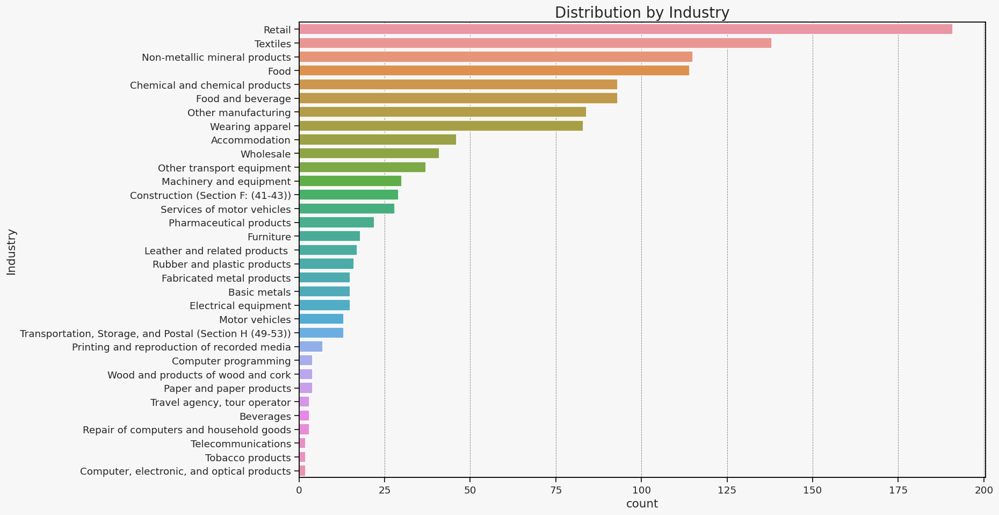

In [280]:
plt.figure(figsize=(15,10))
sns.countplot(df1,y='a4b_v4',order=order.index)
plt.title('Distribution by Industry',fontsize=18)
plt.ylabel("Industry")
plt.xlabel("count")
plt.show()

Categories "Food" and "Beverage" need to be merged with "food and beverage" to get the food and beverage and beverage 

In [281]:
# Replace food and beverage in the rest of the rows by 'Food and beverage'
df1['a4b_v4'] = df1['a4b_v4'].astype(str)
df1.loc[df1['a4b_v4'].isin(['Beverages', 'Food']), 'a4b_v4'] = 'Food and beverage'
df1['a4b_v4'] = df1['a4b_v4'].astype('category')
df1['a4b_v4'].value_counts(normalize=True)*100

a4b_v4
Food and beverage                             16.153846
Retail                                        14.692308
Textiles                                      10.615385
Non-metallic mineral products                  8.846154
Chemical and chemical products                 7.153846
                                                ...    
Repair of computers and household goods        0.230769
Travel agency, tour operator                   0.230769
Telecommunications                             0.153846
Tobacco products                               0.153846
Computer, electronic, and optical products     0.153846
Name: proportion, Length: 31, dtype: float64

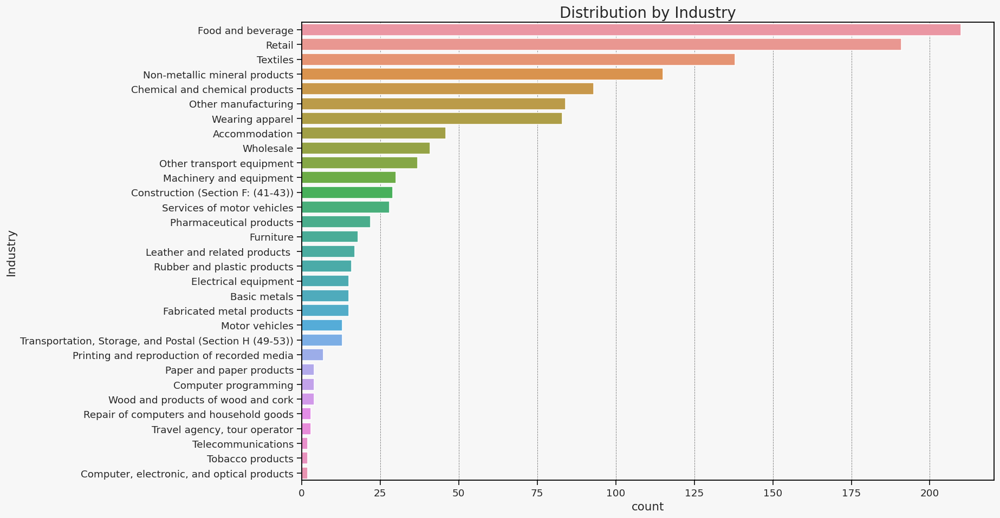

In [282]:
order= df1["a4b_v4"].value_counts()

plt.figure(figsize=(15,10))
sns.countplot(df1,y='a4b_v4',order=order.index)
plt.title('Distribution by Industry')
plt.ylabel("Industry")
plt.xlabel("count")
plt.show()

**What we can conclude:**
The top 3 industries represented in order are: Food and beverage (16.2%); Retail (14.7%); Textiles (10.6%).

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Region</h2>

* a2 - Sampling Region;
* a3a - Region of The Establishment

In [283]:
df1["a2"].value_counts()

a2
Punjab                565
Sindh                 256
Khyber-Pakhtunkhwa    180
Balochistan           153
Islamabad             146
Name: count, dtype: int64

In [284]:
df1["a2"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 1300 entries, 0 to 1299
Series name: a2
Non-Null Count  Dtype   
--------------  -----   
1300 non-null   category
dtypes: category(1)
memory usage: 1.6 KB


In [285]:
df1["a3a"].value_counts()

a3a
Punjab                562
Sindh                 255
Khyber-Pakhtunkhwa    181
Balochistan           153
Islamabad             149
Name: count, dtype: int64

In [286]:
df1["a3a"].value_counts(normalize=True)*100

a3a
Punjab                43.230769
Sindh                 19.615385
Khyber-Pakhtunkhwa    13.923077
Balochistan           11.769231
Islamabad             11.461538
Name: proportion, dtype: float64

In [287]:
df1["a3a"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 1300 entries, 0 to 1299
Series name: a3a
Non-Null Count  Dtype   
--------------  -----   
1300 non-null   category
dtypes: category(1)
memory usage: 1.6 KB


In [288]:
# display records whose Sector Region is not similar to Sampling Region
diff_region = df1[df1["a2"]!= df1["a3a"]]
diff_region

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a6a,d1a6b,d1a6c,d1a3,d2,d2a1,n3,d3a,d3b,d3c,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,PK16,h5,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata
14,Food,Medium,Sindh,Panel,Food and beverage,Other services,Punjab,30,Medium,12,10,2022,14,12,90,Urdu,Establishment,1,0,Yes,No,NaN,NaN,NaN,NaN,NaN,2021,6,30,Sole proprietorship,100,No,100,0,0,0,No,NaN,1995,20,1995,12,No,Yes,No,NaN,NaN,NaN,5500,Yes,30.0,2.0,0.0,5.0,NaN,Yes,10.0,1800000.0,No,NaN,NaN,Reduce electricity consumption,No,NaN,NaN,NaN,1200,Cubic feet,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,15.0,20000.0,Yes,8.0,NaN,NaN,Don't know (spontaneous),With little difficulty,Major obstacle,Restaurant,NaN,NaN,NaN,100,1.800000e+08,80000000.0,160000000.0,100,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,High trade costs,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Moderate obstacle,Major obstacle,Yes,Yes,Tend to disagree,Tend to agree,No action was taken,Yes,1-2 production performance indicators,No,NaN,NaN,NaN,Yes,Their own performance,Non-managers are normally not promoted,After 6 months of identifying non-manager unde...,Local â main product sold mostly in same mun...,Too many to count,Between 50% and 90%,NaN,No,"Small or medium private firms, excluding this ...",No,No,No,No,Yes,No,Domestic private firms operating in the same p...,They do not pay import duties or observe trade...,Regulations that restrict the establishmentâ...,Yes,"Yes, there is more competition",No,Yes,Negatively,Moderate obstacle,No,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Yes,NaN,NaN,Cost of land / buildings,Infrastructure quality,0,0,No,NaN,NaN,No,NaN,NaN,NaN,NaN,Moderate obstacle,No,NaN,Yes,Yes,2,NaN,NaN,No,NaN,NaN,Moderate obstacle,No,100,0,0,0,0,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,Yes,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,No,No,Application procedures were complex,Application proce

In [289]:
diff_region.shape

(20, 416)

Not clear which region should be considered 🤔.However, according to what I collected of information `a2`is the etablishment registeration region while a3a is the etablishment operation region. So I will keep `a3a` as it shows the physical location of the establishment.

In [290]:
df1.head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a6a,d1a6b,d1a6c,d1a3,d2,d2a1,n3,d3a,d3b,d3c,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,PK16,h5,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata
0,Food,Medium,Islamabad,Panel,Food and beverage,Manufacturing,Islamabad,38,Medium,31,7,2022,15,12,90,Urdu,Establishment,0,1,Yes,Yes,2.0,Yes,No,Yes,NaN,2021,6,30,Sole proprietorship,100,Yes,100,0,0,0,No,NaN,1995,108,1995,7,No,No,No,NaN,NaN,NaN,6000,No,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,No,NaN,NaN,Reduce electricity consumption,No,NaN,NaN,NaN,2000,Gallons,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,No,NaN,NaN,The establishment does not have an internet co...,NaN,NaN,NaN,NaN,With some difficulty,No obstacle,Manufacturing of,NaN,NaN,NaN,100,150000000.0,150000000.0,140000000.0,100,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,High trade costs,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No obstacle,No obstacle,Yes,No,Strongly agree,Strongly agree,We fixed it but did not take further action,Yes,1-2 production performance indicators,No,NaN,NaN,NaN,No,NaN,Does not apply (spontaneous),Rarely or never,National â main product sold mostly across t...,60.0,NaN,25.0,No,"Small or medium private firms, excluding this ...",No,No,No,No,No,No,Domestic private firms operating in the same p...,They avoid labor taxes or regulations,Regulations that restrict the establishmentâ...,No,"Yes, there is more competition",Prices set by HQ,No,NaN,Minor obstacle,No,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Yes,100.0,106.0,Availability of skilled labor force,Access to markets,100,100,No,NaN,NaN,Does not apply (spontaneous),NaN,NaN,NaN,NaN,No obstacle,No,NaN,Yes,Yes,2,NaN,NaN,No,NaN,NaN,No obstacle,Yes,80,0,0,20,0,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,Yes,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,No,No,No need for a loan - establishment had suffici...,No need for a loan - establishment had enough ...,N

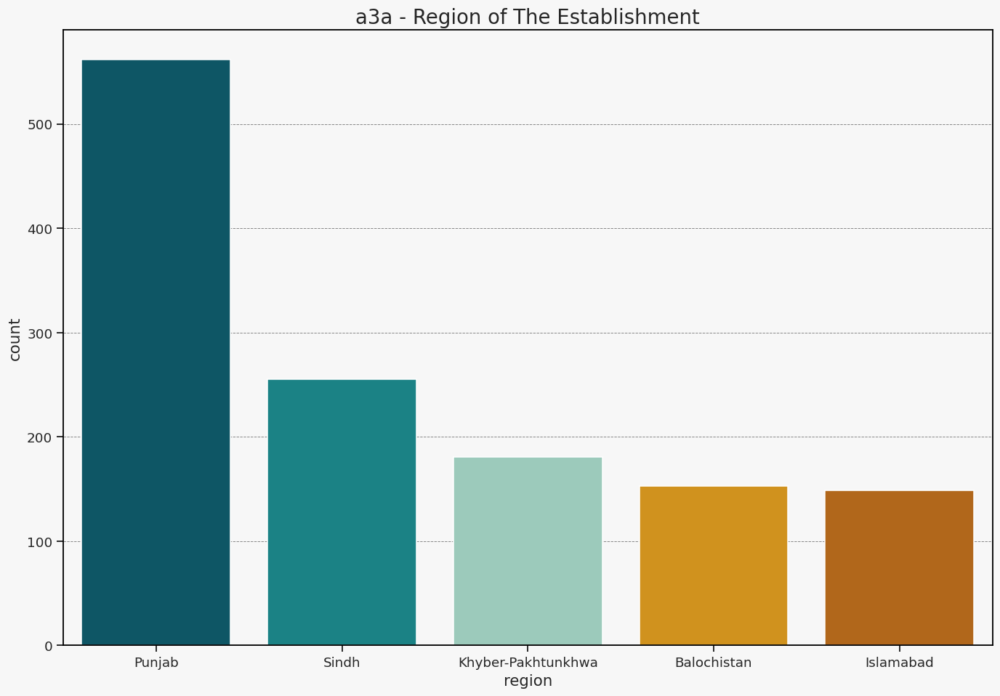

In [291]:
plt.figure(figsize=(15,10))
sns.countplot(df1,x='a3a')
plt.title('a3a - Region of The Establishment',fontsize=18)
plt.ylabel("count")
plt.xlabel("region")
plt.show()

Industry in each region.

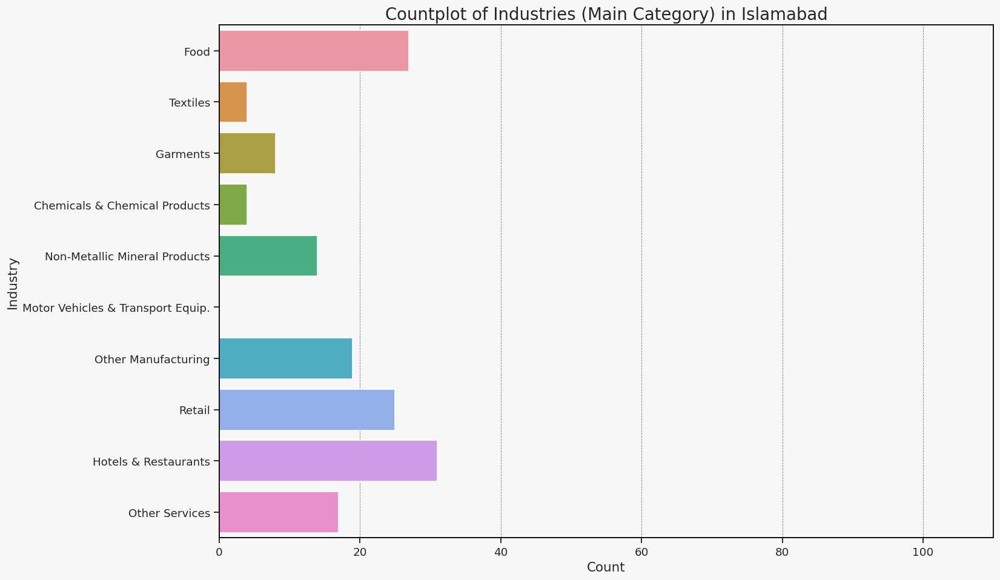

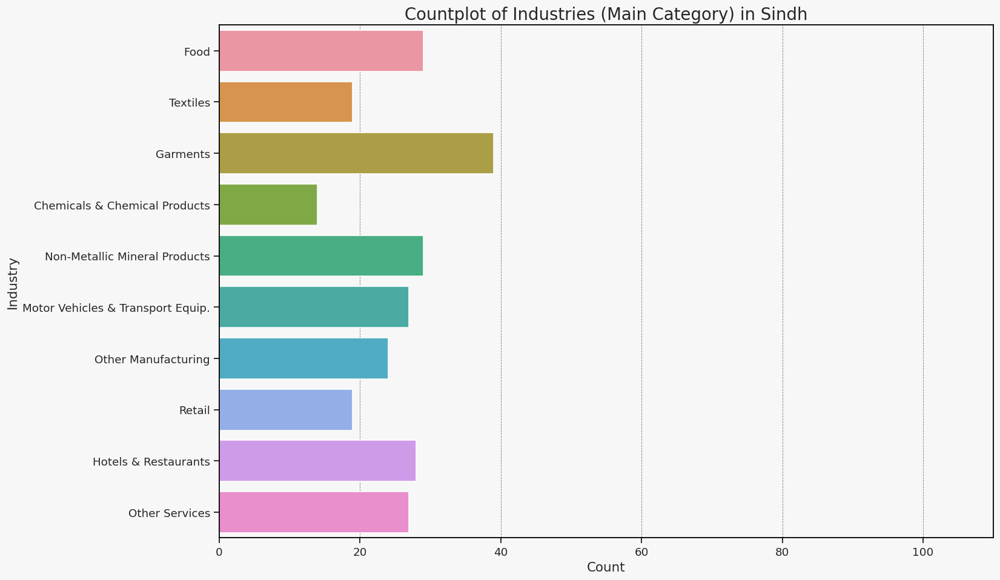

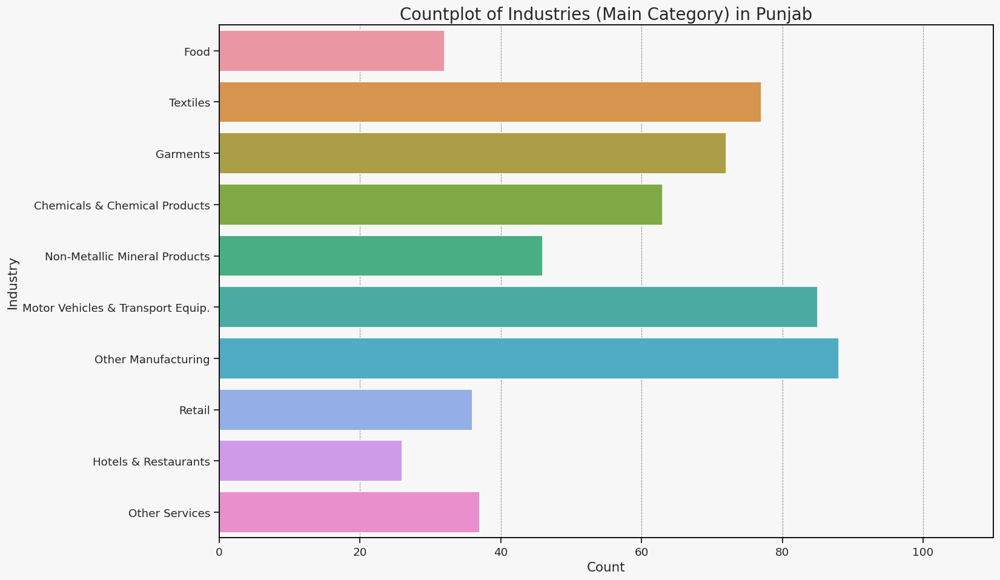

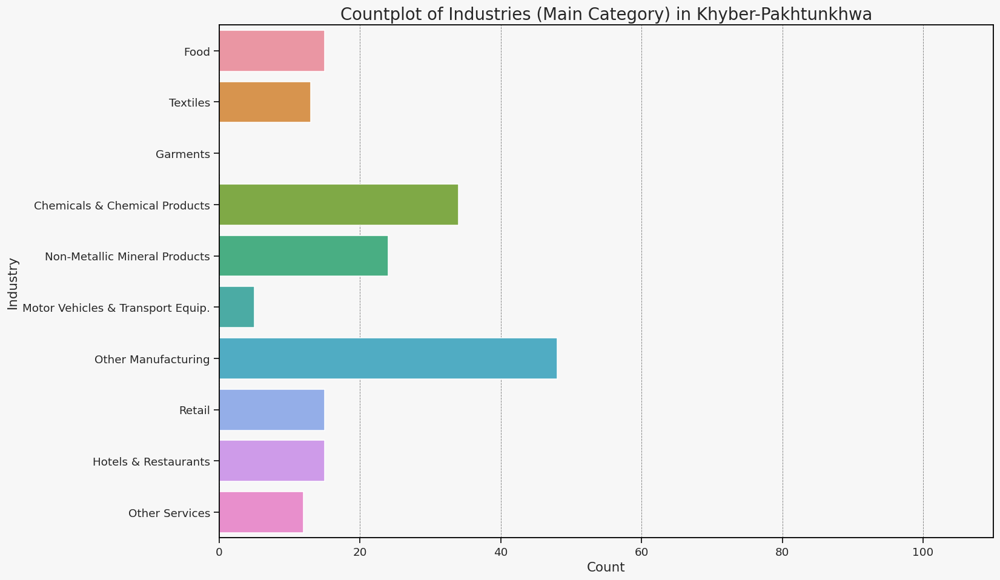

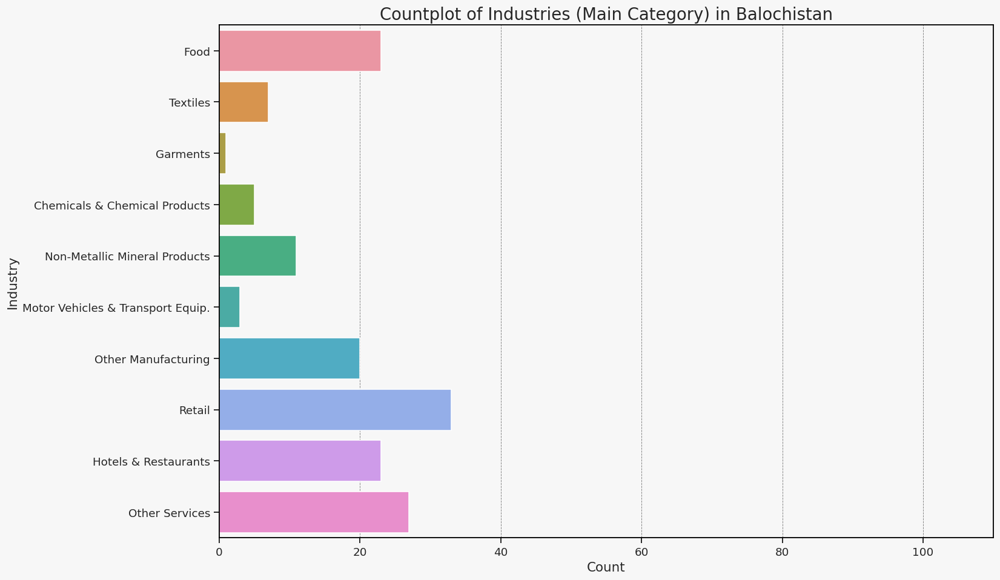

In [292]:
regions = df1["a3a"].unique()
for region in regions:
    subset = df1[df1["a3a"]== region]
    plt.figure(figsize=(15,10))
    sns.countplot(subset,y='a4a')
    plt.title('Countplot of Industries (Main Category) in '+ region,fontsize=18)
    plt.ylabel("Industry")
    plt.xlabel("Count")
    plt.xlim(0,110)
    plt.show()

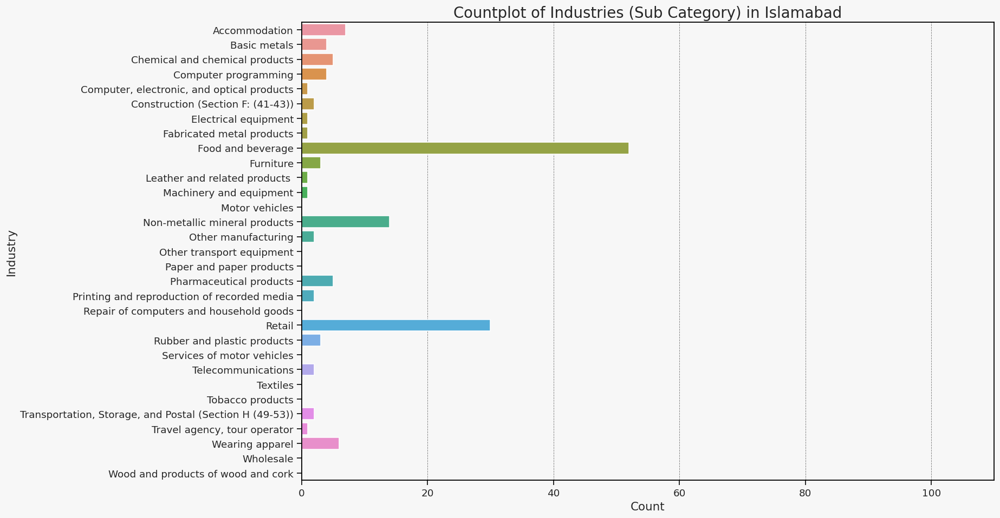

Islamabad : 
 a4b_v4
Food and beverage                          34.899329
Retail                                     20.134228
Non-metallic mineral products               9.395973
Accommodation                               4.697987
Wearing apparel                             4.026846
                                             ...    
Services of motor vehicles                  0.000000
Repair of computers and household goods     0.000000
Paper and paper products                    0.000000
Motor vehicles                              0.000000
Wood and products of wood and cork          0.000000
Name: proportion, Length: 31, dtype: float64


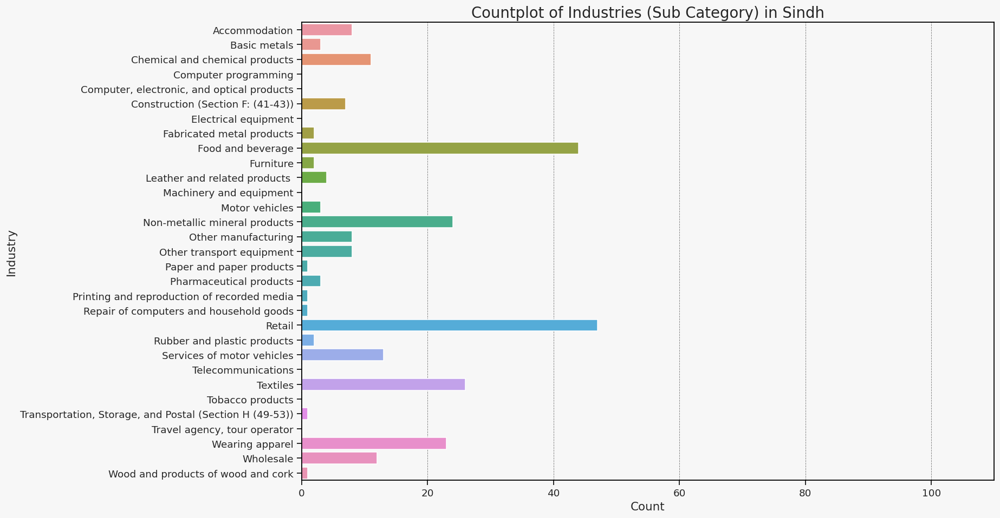

Sindh : 
 a4b_v4
Retail                                        18.431373
Food and beverage                             17.254902
Textiles                                      10.196078
Non-metallic mineral products                  9.411765
Wearing apparel                                9.019608
                                                ...    
Tobacco products                               0.000000
Travel agency, tour operator                   0.000000
Computer, electronic, and optical products     0.000000
Computer programming                           0.000000
Machinery and equipment                        0.000000
Name: proportion, Length: 31, dtype: float64


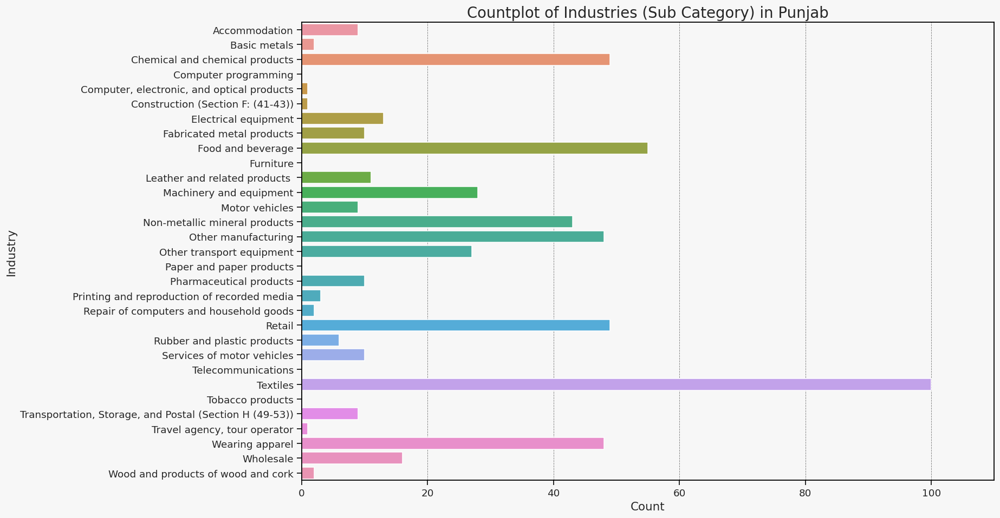

Punjab : 
 a4b_v4
Textiles                          17.793594
Food and beverage                  9.786477
Chemical and chemical products     8.718861
Retail                             8.718861
Wearing apparel                    8.540925
                                    ...    
Paper and paper products           0.000000
Telecommunications                 0.000000
Furniture                          0.000000
Tobacco products                   0.000000
Computer programming               0.000000
Name: proportion, Length: 31, dtype: float64


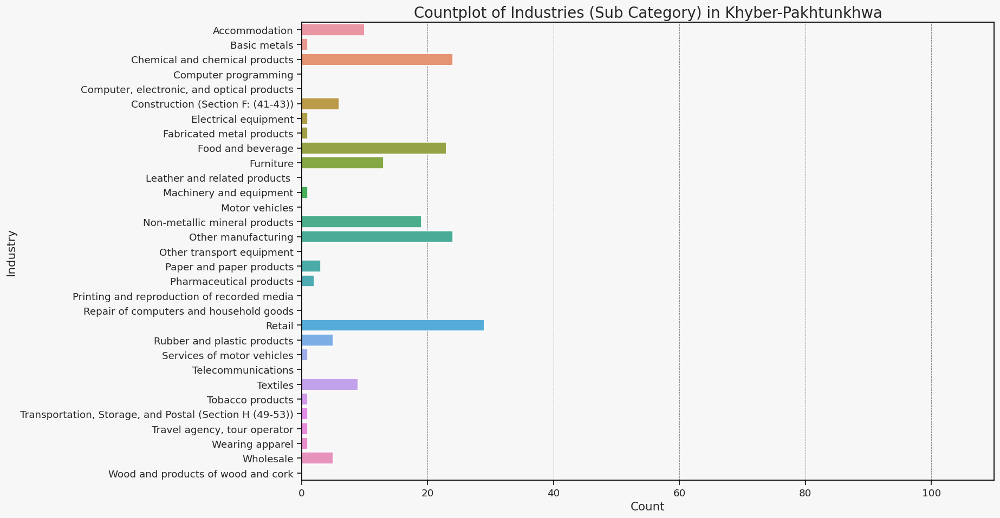

Khyber-Pakhtunkhwa : 
 a4b_v4
Retail                                        16.022099
Chemical and chemical products                13.259669
Other manufacturing                           13.259669
Food and beverage                             12.707182
Non-metallic mineral products                 10.497238
                                                ...    
Motor vehicles                                 0.000000
Leather and related products                   0.000000
Computer, electronic, and optical products     0.000000
Computer programming                           0.000000
Wood and products of wood and cork             0.000000
Name: proportion, Length: 31, dtype: float64


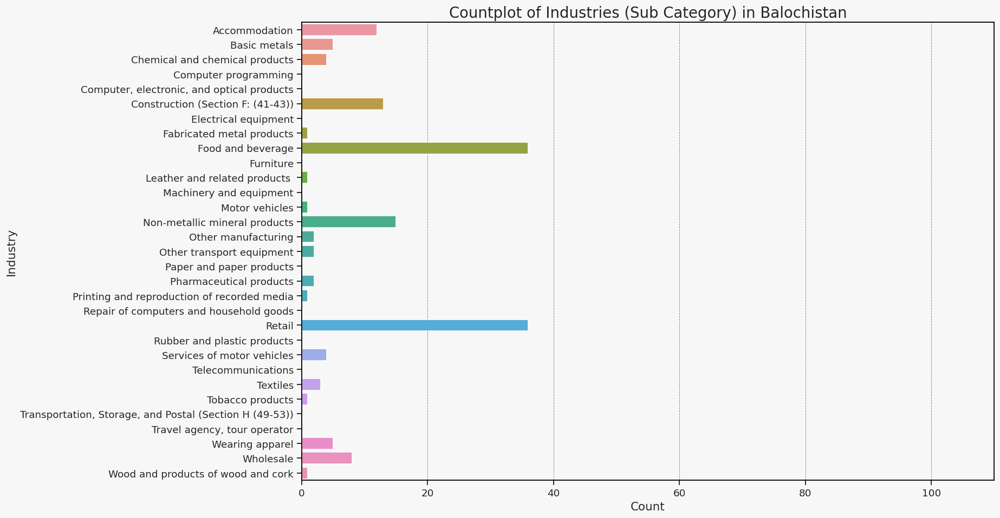

Balochistan : 
 a4b_v4
Food and beverage                                          23.529412
Retail                                                     23.529412
Non-metallic mineral products                               9.803922
Construction (Section F: (41-43))                           8.496732
Accommodation                                               7.843137
                                                             ...    
Paper and paper products                                    0.000000
Transportation, Storage, and Postal (Section H (49-53))     0.000000
Travel agency, tour operator                                0.000000
Computer, electronic, and optical products                  0.000000
Computer programming                                        0.000000
Name: proportion, Length: 31, dtype: float64


In [293]:
regions = df1["a3a"].unique()
for region in regions:
    subset = df1[df1["a3a"]== region]
    plt.figure(figsize=(15,10))
    sns.countplot(subset,y='a4b_v4')
    plt.title('Countplot of Industries (Sub Category) in '+ region,fontsize=18)
    plt.ylabel("Industry")
    plt.xlabel("Count")
    plt.xlim(0,110)
    plt.show()
    print(region,': \n',subset["a4b_v4"].value_counts(normalize=True)*100)

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Firm structure</h2>

* a7 - Establishment part of a multi-establishment Firm?;
* a7a - Number of Establishments In The Firm

In [294]:
df1["a7"].value_counts(normalize=True)*100

a7
No     78.230769
Yes    21.769231
Name: proportion, dtype: float64

In [295]:
mask = df1["a7"] == "No"
df1[mask]["a7a"].isna().sum()

1017

For each Firm that consists of one estblishment (`a7`== 'No') the number of Establishments in the Firm (`a7a`) should be set to 1.
Also "Don't know (spontaneous)" should be replaced by a numerical value.

In [296]:
# Add '1' as a new category if it's not already there
if 1 not in df1['a7a'].cat.categories:
    df1['a7a'] = df1['a7a'].cat.add_categories(["1.0"])

# Replace NaN with 1 where a7 == "No"
df1.loc[(df1['a7'] == "No") & (df1['a7a'].isna()), 'a7a'] = "1.0"
df1[["a7","a7a"]].head()

,a7,a7a
0,Yes,2.0
1,Yes,35.0
2,Yes,80.0
3,No,1.0
4,No,1.0


In [297]:
#check if there is still null
df1["a7a"].isna().sum()

0

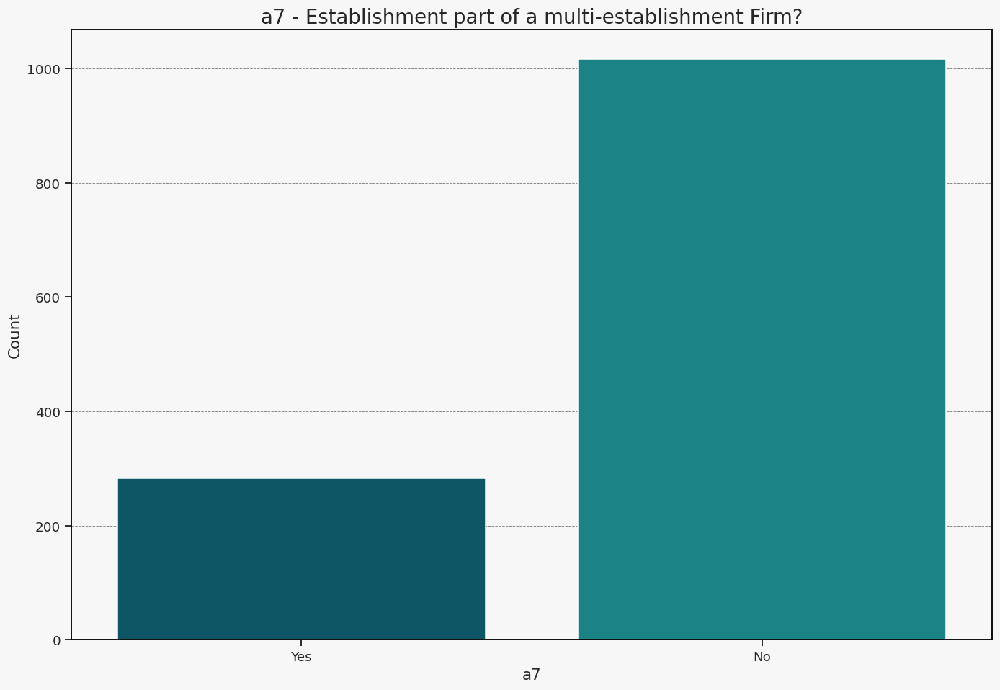

In [298]:
plt.figure(figsize=(15,10))
sns.countplot(df1,x='a7')
plt.title('a7 - Establishment part of a multi-establishment Firm?')
plt.ylabel("Count")
plt.show()

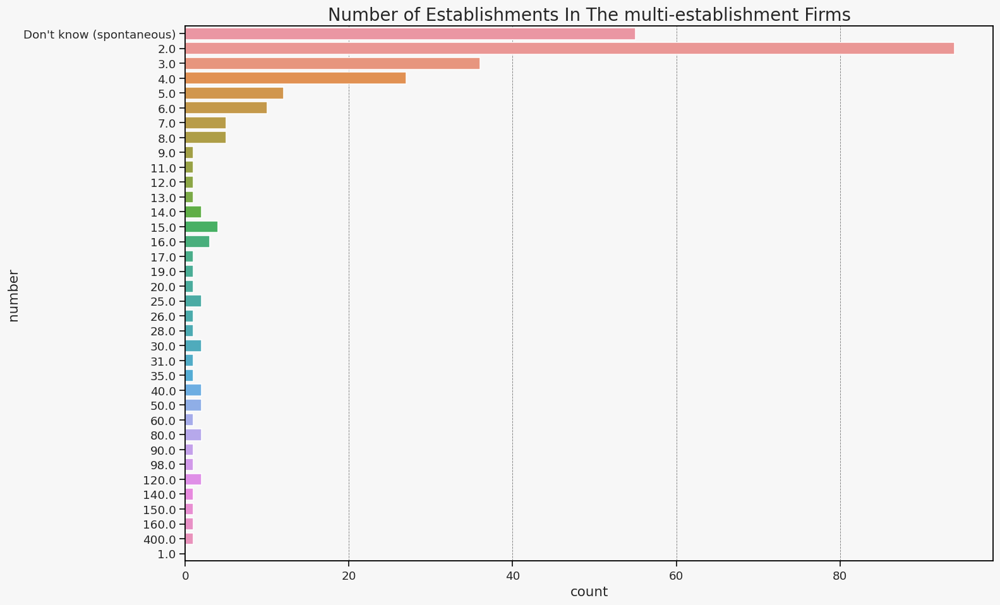

In [299]:

df_multi = df1[df1['a7']!="No"]

plt.figure(figsize=(15,10))
sns.countplot(df_multi,y='a7a')
plt.title('Number of Establishments In The multi-establishment Firms',fontsize=18)
plt.ylabel("number")
plt.show()

In [300]:
# calculate the percent of non response 
df1[(df1['a7a']=="Don't know (spontaneous)") & (df1['a7']=="Yes")]['a7a'].count()/(df1['a7']=="Yes").sum()*100

19.434628975265017

In [301]:
df1[(df1['a7a']!="Don't know (spontaneous)") & (df1['a7']=="Yes")]['a7a'].describe()

count     228.0
unique     34.0
top         2.0
freq       94.0
Name: a7a, dtype: float64

* Replace Don't know by 1 or median value of establishment dependent of the answer provided in a7

In [302]:
#find median of number of establishments
subset = df1[(df1['a7a']!="Don't know (spontaneous)") & (df1['a7']=="Yes")]['a7a'].astype(str)
establishment_median = subset.astype("float").median()
establishment_median

3.0

In [303]:
# Replace Don't know with numeric value
df1.loc[(df1['a7a']=="Don't know (spontaneous)") & (df1['a7']=="No"),'a7a'] = "1.0"
df1.loc[(df1['a7a']=="Don't know (spontaneous)") & (df1['a7']=="Yes"),'a7a']= establishment_median

In [304]:
df1['a7a'].value_counts()

a7a
1.0                         1017
2.0                           94
3.0                           91
4.0                           27
5.0                           12
                            ... 
31.0                           1
28.0                           1
26.0                           1
17.0                           1
Don't know (spontaneous)       0
Name: count, Length: 36, dtype: int64

In [305]:
df1['a7a']= df1['a7a'].cat.remove_unused_categories().astype("float")

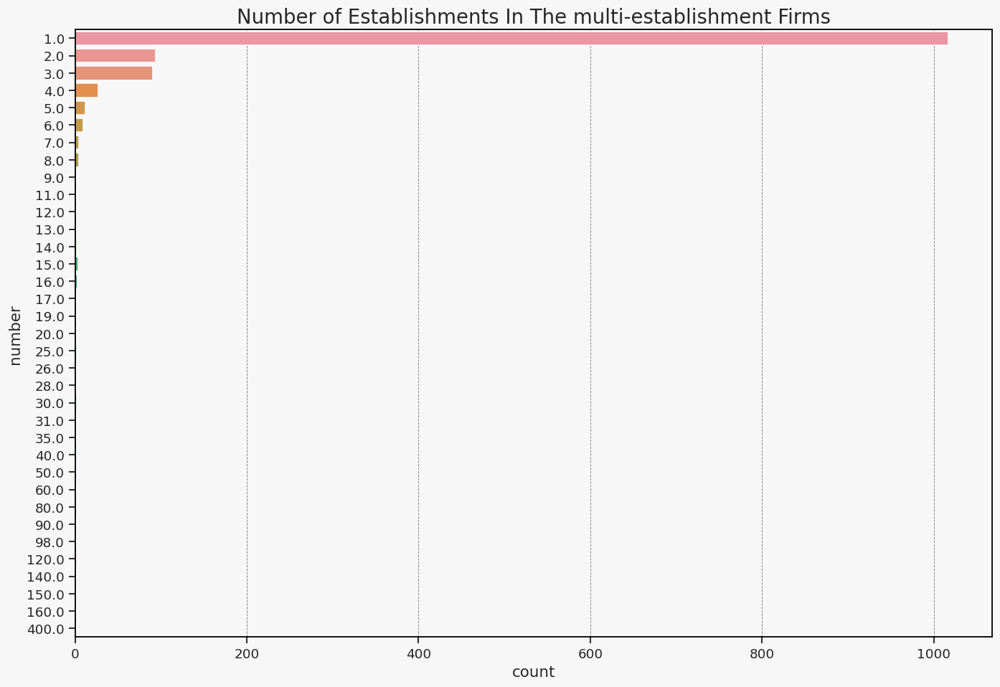

In [306]:
plt.figure(figsize=(15,10))
sns.countplot(df1,y='a7a')
plt.title('Number of Establishments In The multi-establishment Firms',fontsize=18)
plt.ylabel("number")
plt.show()

**What we conclude:**
* 78% of the enterprise are not multi-establishment firms.
* We dont know the count of the establishments of around 19% of the multi-establishment firms.
* Around 41,2% of the mulit-establishment firms consists only of 2 establishments.

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Obstacles</h2>

* m1a - Biggest Obstacle Affecting The Operation of This Establishment;
* k30 - How Much of An Obstacle: Access To Finance (k30)

In [307]:
order= df1["m1a"].value_counts()
order.index

CategoricalIndex(['Political instability', 'Corruption', 'Access to finance',
                  'Tax rates', 'Electricity', 'Access to land',
                  'Customs and trade regulations',
                  'Practices of competitors in the informal sector',
                  'Business licensing and permits', 'Does not apply',
                  'Transport', 'Labor regulations',
                  'Crime, theft and disorder',
                  'Inadequately educated workforce', 'Courts',
                  'Tax administration', 'Don't know (spontaneous)'],
                 categories=['Don't know (spontaneous)', 'Does not apply', 'Access to finance', 'Access to land', ..., 'Practices of competitors in the informal sector', 'Tax administration', 'Tax rates', 'Transport'], ordered=True, dtype='category', name='m1a')

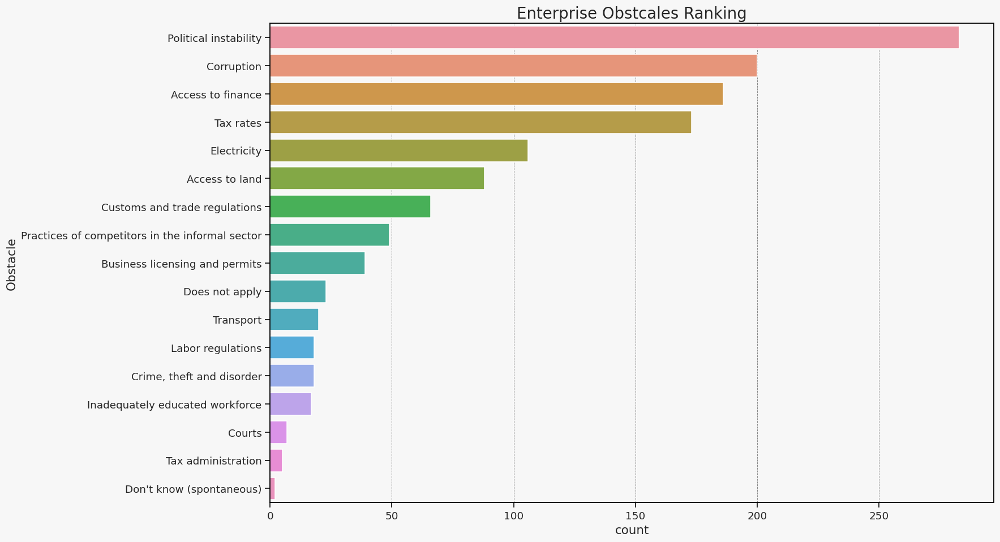

In [308]:
plt.figure(figsize=(15,10))
sns.countplot(df1,y='m1a', order=order.index)
plt.title('Enterprise Obstcales Ranking',fontsize=18)
plt.ylabel("Obstacle")
plt.show()

In [309]:
df1["m1a"].value_counts(normalize=True)*100

m1a
Political instability                              21.769231
Corruption                                         15.384615
Access to finance                                  14.307692
Tax rates                                          13.307692
Electricity                                         8.153846
Access to land                                      6.769231
Customs and trade regulations                       5.076923
Practices of competitors in the informal sector     3.769231
Business licensing and permits                      3.000000
Does not apply                                      1.769231
Transport                                           1.538462
Labor regulations                                   1.384615
Crime, theft and disorder                           1.384615
Inadequately educated workforce                     1.307692
Courts                                              0.538462
Tax administration                                  0.384615
Don't know (spontane

In [310]:
df1["k30"].value_counts(normalize=True)*100

k30
No obstacle                 33.384615
Minor obstacle              28.538462
Moderate obstacle           26.076923
Major obstacle               8.846154
Very severe obstacle         2.615385
Don't know (spontaneous)     0.307692
Does not apply               0.230769
Name: proportion, dtype: float64

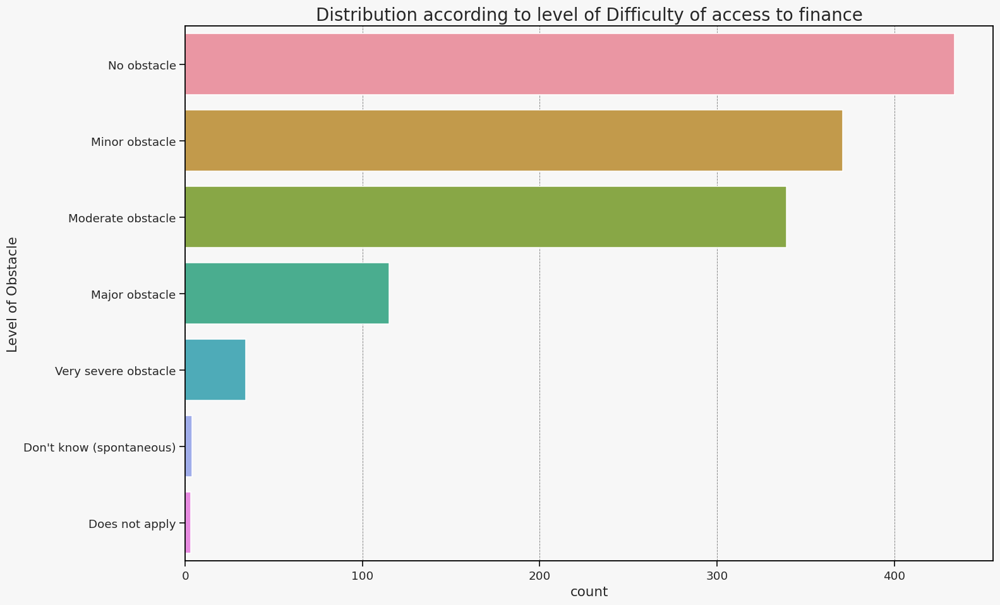

In [311]:
order = df1["k30"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k30',order= order.index)
plt.title('Distribution according to level of Difficulty of access to finance',fontsize=18)
plt.ylabel("Level of Obstacle")
plt.show()

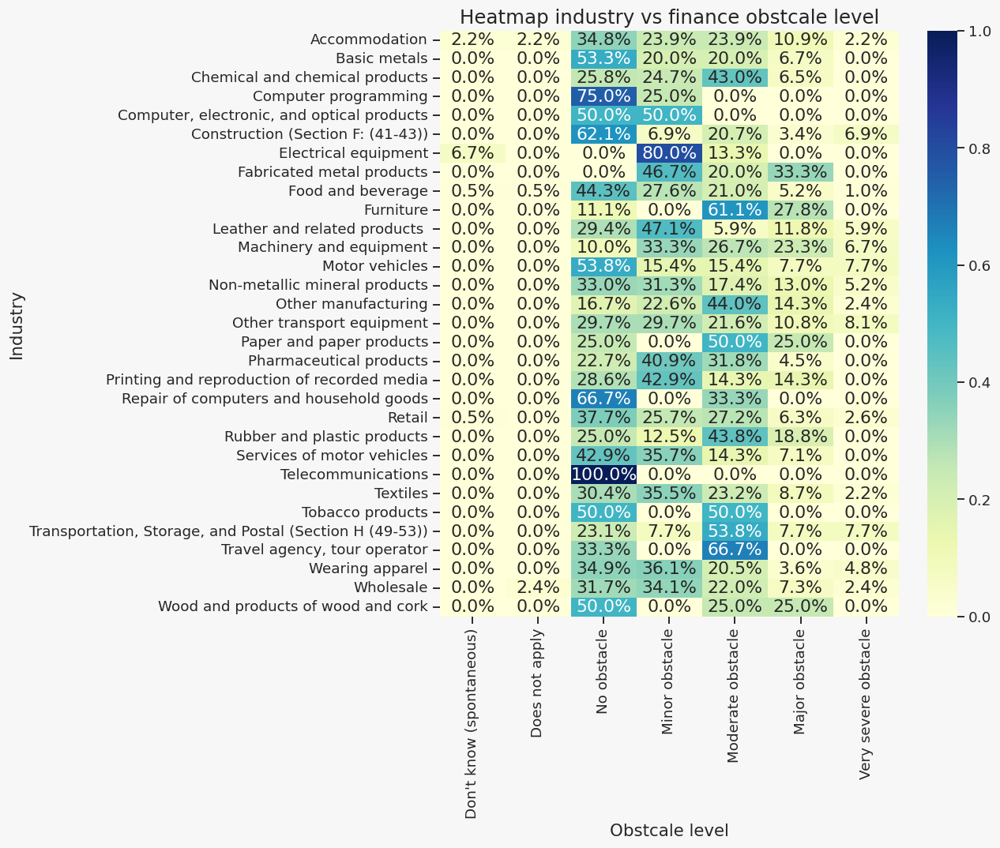

In [312]:
# Cross-tab: count of companies per (industry, finace obstcale level)
heatmap_data = pd.crosstab(df1['a4b_v4'], df1['k30'])
    # Normalize each row to sum to 1 (percent distribution by industry)
heatmap_data_normalized = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data_normalized, annot=True, fmt=".1%", cmap="YlGnBu")

plt.title("Heatmap industry vs finance obstcale level", fontsize=16)
plt.xlabel("Obstcale level")
plt.ylabel("Industry")
plt.tight_layout()
plt.show()

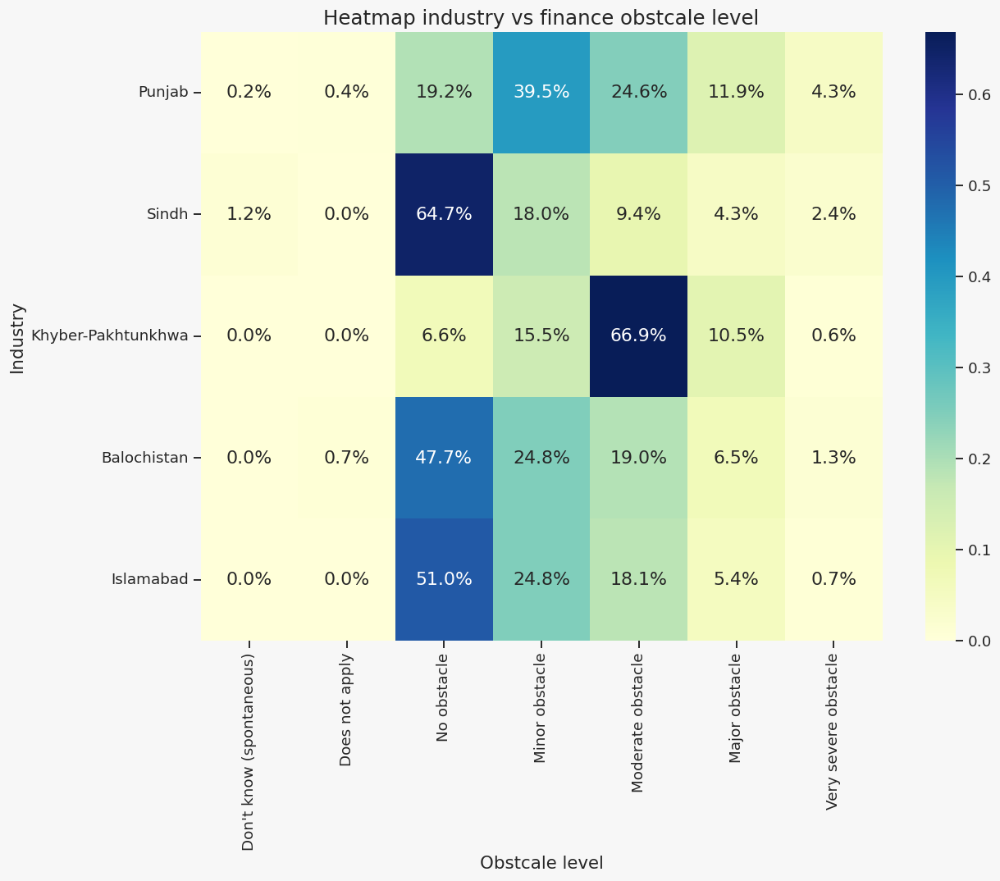

In [313]:
# Cross-tab: count of companies per (industry, finace obstcale level)
heatmap_data = pd.crosstab(df1['a3a'], df1['k30'])
    # Normalize each row to sum to 1 (percent distribution by industry)
heatmap_data_normalized = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data_normalized, annot=True, fmt=".1%", cmap="YlGnBu")

plt.title("Heatmap industry vs finance obstcale level", fontsize=16)
plt.xlabel("Obstcale level")
plt.ylabel("Industry")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [314]:

df1.loc[(df1['k30'].isin(['Minor obstacle', 'Moderate obstacle','Major obstacle','Very severe obstacle'])), 'finance_obstacle'] = 1
df1.loc[(df1['k30'].isin(['No obstacle',"Don't know (spontaneous)",'Does not apply'])), 'finance_obstacle'] = 0

In [315]:
df1["finance_obstacle"].value_counts(normalize=True)*100

finance_obstacle
1.0    66.076923
0.0    33.923077
Name: proportion, dtype: float64

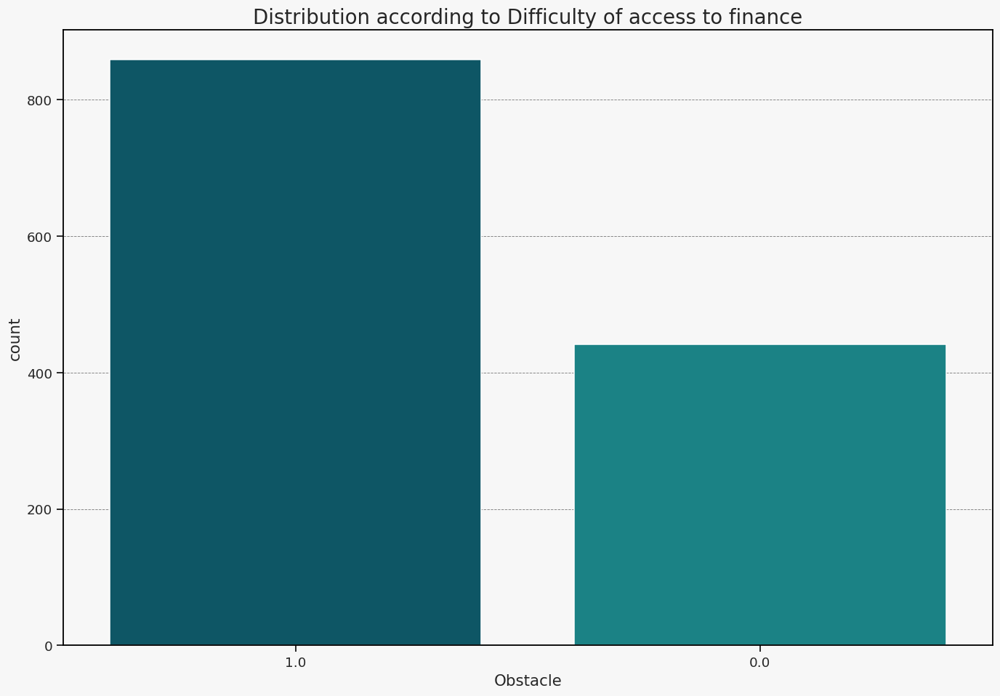

In [316]:
order = df1["finance_obstacle"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,x='finance_obstacle',order= order.index)
plt.title('Distribution according to Difficulty of access to finance',fontsize=18)
plt.xlabel("Obstacle")
plt.show()

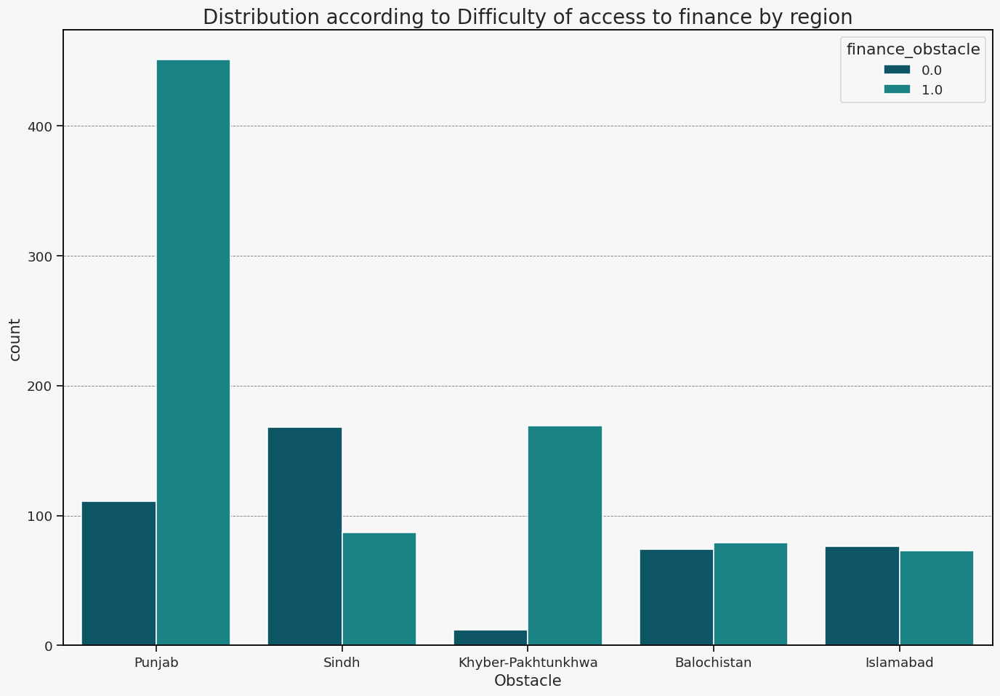

In [317]:
order = df1["finance_obstacle"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,x='a3a',hue='finance_obstacle')
plt.title('Distribution according to Difficulty of access to finance by region',fontsize=18)
plt.xlabel("Obstacle")
plt.show()

**What we conclude:**
* The top 4 obstacles in order are: Political instability (21.8%); Corruption (15.4%); `Access to finance (14.3%)`; Tax rates (13.3%).
* About two third of the enterprises found financing an obstacle to a certain degree (range from minor obstacle up to very sever obstacle)


<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Locality characteristics</h2>

* a3b - official Capital City?;
* a3c - Main Business City?;
* a3 -Size of Locality (a3).

In [318]:
df1["a3"].value_counts(normalize=True)*100

a3
City with population over 1 million    87.692308
Over 250.000 to 1 million               5.538462
50.000 to 250.000                       4.615385
Less than 50.000                        2.153846
Name: proportion, dtype: float64

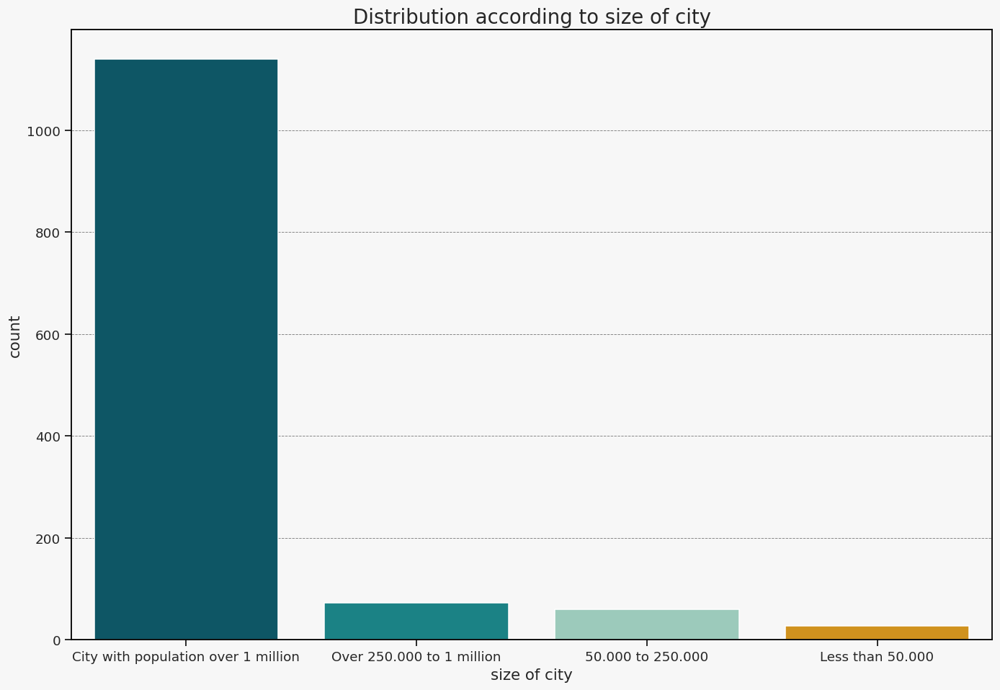

In [319]:
plt.figure(figsize=(15,10))
sns.countplot(df1,x='a3')
plt.title('Distribution according to size of city',fontsize=18)
plt.xlabel("size of city")
plt.show()

In [320]:
df1["a3b"].value_counts(normalize=True)*100

a3b
No     91.307692
Yes     8.692308
Name: proportion, dtype: float64

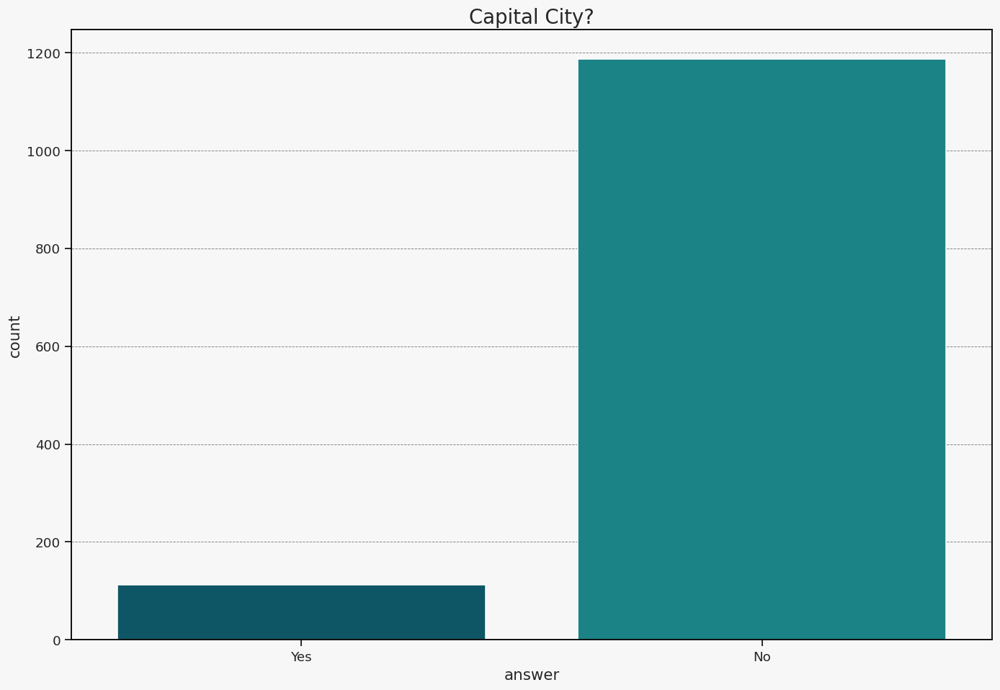

In [321]:
plt.figure(figsize=(15,10))
sns.countplot(df1,x='a3b')
plt.title('Capital City?',fontsize=18)
plt.xlabel("answer")
plt.show()

In [322]:
df1["a3c"].value_counts(normalize=True)*100

a3c
Yes    93.846154
No      6.153846
Name: proportion, dtype: float64

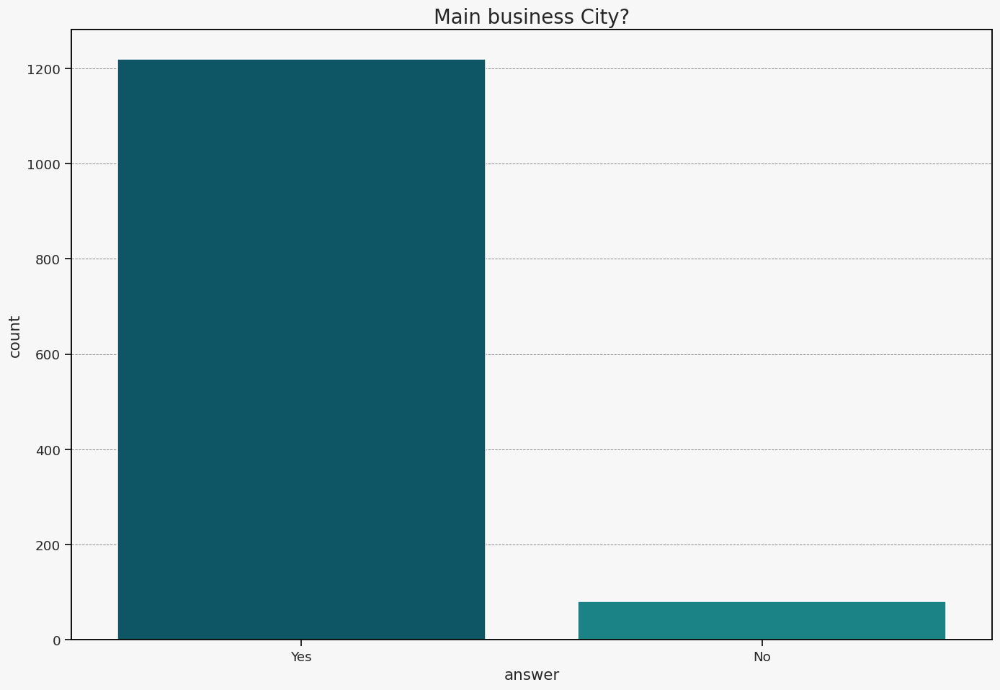

In [323]:
plt.figure(figsize=(15,10))
sns.countplot(df1,x='a3c')
plt.title('Main business City?',fontsize=18)
plt.xlabel("answer")
plt.show()

**What we can conclude:**
* The majority of enterprises are located in a city with population over 1 million,the majority are located also in a buisiness cities which are not capital cities.

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
E-payments, Mobile payement usage & Internet usage</h2>

   * k33 - Percentage of payments received using e-payments 
   * k34 - Main type of e-payment accepted 
   * k35 - Avg. days to receive main type of e-payment
   * k36 - Cost per transaction (% of transaction) to receive main type of e-payment
   * k37 - Monthly fees and subscription costs to receive main type of e-payment
   * k38 - Percentage of payments made using e-payments
   * k39 - Main type of e-payment used to make payments
   * k40 - Cost per transaction (% of transaction) to make main type of e-payment
   * PK25 - Does the firm use an internet connection? 
   * PK27 - Does this firm use mobile money? 

#### Received

In [324]:
df1["k33"].value_counts(normalize=True)*100

k33
0                           41.384615
Don't know (spontaneous)    12.615385
100                          9.000000
50                           5.692308
30                           4.692308
80                           4.384615
20                           3.692308
40                           3.538462
60                           3.153846
70                           3.153846
25                           2.307692
10                           1.615385
90                           1.230769
75                           0.846154
15                           0.615385
35                           0.538462
5                            0.461538
45                           0.230769
1                            0.153846
95                           0.153846
85                           0.076923
99                           0.076923
2                            0.076923
74                           0.076923
65                           0.076923
7                            0.076923
55      

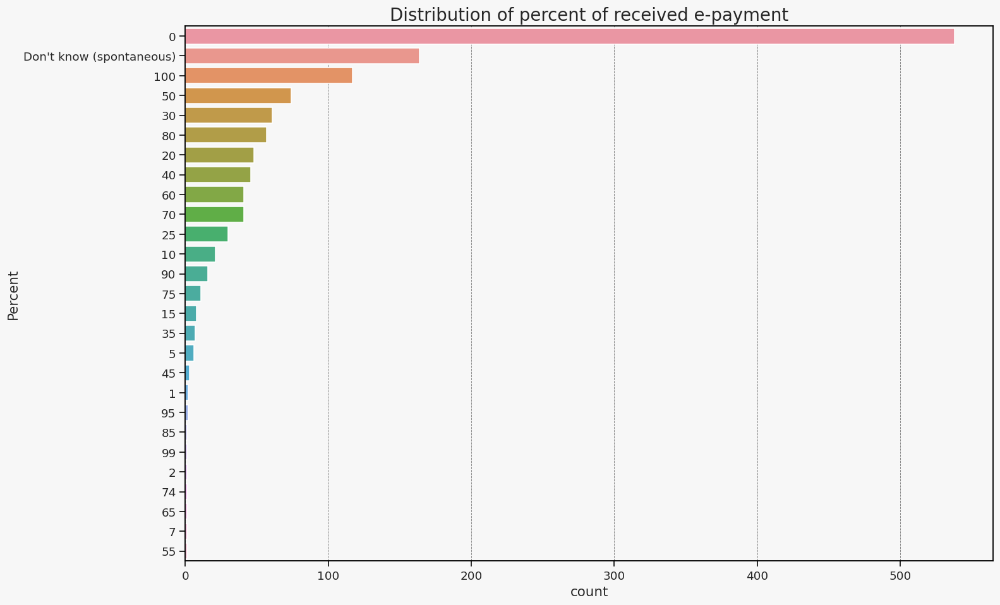

In [325]:
order = df1["k33"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k33',order= order.index)
plt.title('Distribution of percent of received e-payment',fontsize=18)
plt.ylabel("Percent")
plt.show()

In [326]:
df1["k34"].value_counts(normalize=True)*100

k34
Internet and mobile banking, including direct debit transfer    48.327759
Other                                                           22.575251
Debit cards                                                     20.234114
Credit cards                                                     5.351171
Mobile money                                                     2.508361
E-money and e-wallet, excluding mobile money                     0.836120
Don't know (spontaneous)                                         0.167224
Name: proportion, dtype: float64

In [327]:
df1["k34"].isna().sum()

702

In [328]:
df1[df1["k33"]== "Don't know (spontaneous)"]['k34'].value_counts(dropna=False)

k34
NaN                                                             164
Don't know (spontaneous)                                          0
Internet and mobile banking, including direct debit transfer      0
Debit cards                                                       0
Credit cards                                                      0
E-money and e-wallet, excluding mobile money                      0
Mobile money                                                      0
Other                                                             0
Name: count, dtype: int64

In [329]:
df1['k34'] = df1['k34'].cat.add_categories(["Doesn't receive e-payment"])
df1.loc[(df1['k33'] == 0), 'k34'] = "Doesn't receive e-payment"

In [330]:
df1["k34"].value_counts(normalize=True,dropna=False)*100

k34
Doesn't receive e-payment                                       41.384615
Internet and mobile banking, including direct debit transfer    22.230769
NaN                                                             12.615385
Other                                                           10.384615
Debit cards                                                      9.307692
Credit cards                                                     2.461538
Mobile money                                                     1.153846
E-money and e-wallet, excluding mobile money                     0.384615
Don't know (spontaneous)                                         0.076923
Name: proportion, dtype: float64

In [331]:
df1["k34"].isna().sum()

164

In [332]:
df1[df1["k34"].isna()]["k33"].value_counts(dropna=False)

k33
Don't know (spontaneous)    164
50                            0
99                            0
95                            0
90                            0
85                            0
80                            0
75                            0
74                            0
70                            0
65                            0
60                            0
55                            0
45                            0
0                             0
40                            0
35                            0
30                            0
25                            0
20                            0
15                            0
10                            0
7                             0
5                             0
2                             0
1                             0
100                           0
Name: count, dtype: int64

In [333]:
df1.loc[df1['k33'] == "Don't know (spontaneous)", 'k34'] = "Don't know (spontaneous)"

In [334]:
df1["k34"].isna().sum()

0

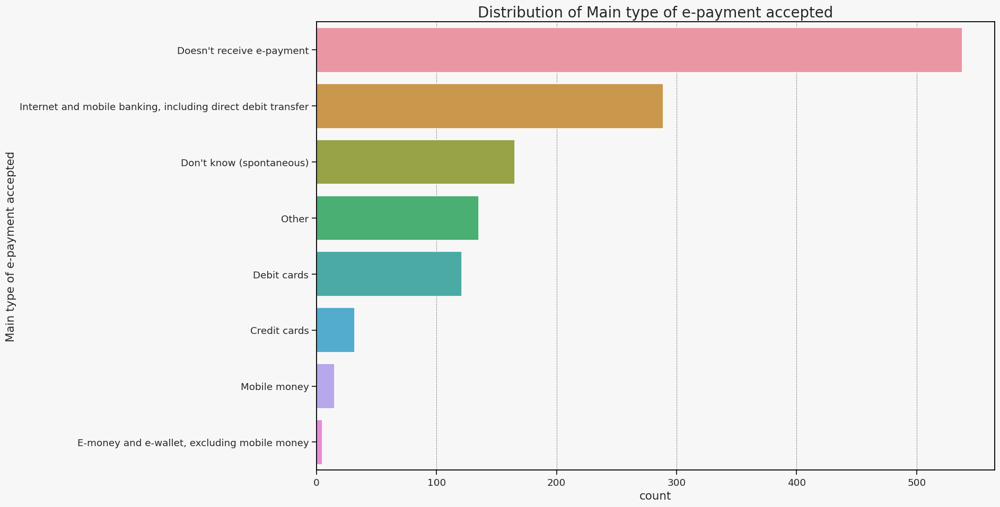

In [335]:
order = df1["k34"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k34',order= order.index)
plt.title('Distribution of Main type of e-payment accepted',fontsize=18)
plt.ylabel("Main type of e-payment accepted")
plt.show()

In [336]:
df1["k35"].isna().sum()

703

In [337]:
df1['k35'] = df1['k35'].cat.add_categories(["Doesn't receive e-payment"])
df1.loc[(df1['k33'] == 0), 'k35'] = "Doesn't receive e-payment"

In [338]:
df1["k35"].isna().sum()

165

In [339]:
df1[df1["k35"].isna()]["k33"].value_counts(dropna=False)

k33
Don't know (spontaneous)    164
90                            1
50                            0
99                            0
95                            0
85                            0
80                            0
75                            0
74                            0
70                            0
65                            0
60                            0
55                            0
45                            0
0                             0
40                            0
35                            0
30                            0
25                            0
20                            0
15                            0
10                            0
7                             0
5                             0
2                             0
1                             0
100                           0
Name: count, dtype: int64

In [340]:
df1.loc[df1['k33'] == "Don't know (spontaneous)", 'k35'] = "Don't know (spontaneous)"

In [341]:
df1["k35"].value_counts(dropna=False)

k35
Doesn't receive e-payment              538
Payment received in less than a day    334
Don't know (spontaneous)               169
3.0                                     39
5.0                                     29
10.0                                    29
15.0                                    26
8.0                                     23
2.0                                     22
1.0                                     22
20.0                                    16
4.0                                     15
6.0                                     10
7.0                                      8
12.0                                     7
25.0                                     3
35.0                                     3
14.0                                     2
18.0                                     2
9.0                                      1
40.0                                     1
NaN                                      1
Name: count, dtype: int64

In [342]:
delay = df1[(df1["k35"]!="Doesn't receive e-payment" )& (df1["k35"]!="Don't know (spontaneous)")]
delay["k35"].value_counts(normalize=True)*100

k35
Payment received in less than a day    56.418919
3.0                                     6.587838
5.0                                     4.898649
10.0                                    4.898649
15.0                                    4.391892
8.0                                     3.885135
1.0                                     3.716216
2.0                                     3.716216
20.0                                    2.702703
4.0                                     2.533784
6.0                                     1.689189
7.0                                     1.351351
12.0                                    1.182432
25.0                                    0.506757
35.0                                    0.506757
18.0                                    0.337838
14.0                                    0.337838
40.0                                    0.168919
9.0                                     0.168919
Don't know (spontaneous)                0.000000
Doesn't receive 

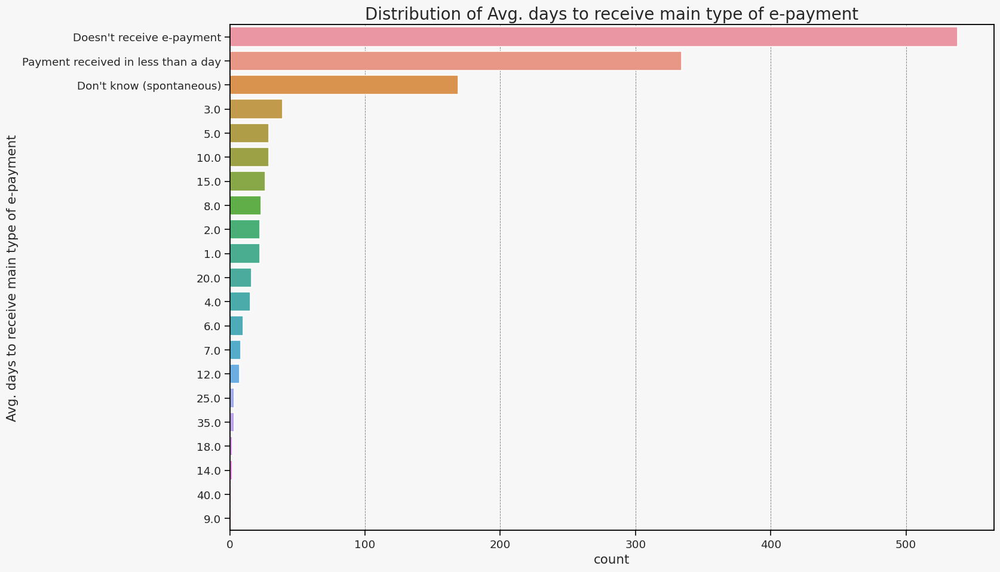

In [343]:
order = df1["k35"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k35',order= order.index)
plt.title('Distribution of Avg. days to receive main type of e-payment',fontsize=18)
plt.ylabel("Avg. days to receive main type of e-payment")
plt.show()

In [344]:
# Create a new column for avg.days to merge all values > 1 to "Payment received in more than a day"
df1['payment_avg_rec_days'] = df1['k35'].copy()

df1['payment_avg_rec_days'] = df1['payment_avg_rec_days'].cat.add_categories(["Payment received between 2 to 5 days","Payment received in more than 5 days"])
df1.loc[(df1['k35']!="Doesn't receive e-payment")&(df1['k35']!="Payment received in less than a day")&(df1['k35']!="Don't know (spontaneous)") &(df1['k35']<=5), 'payment_avg_rec_days'] = "Payment received between 2 to 5 days"
df1.loc[(df1['k35']!="Doesn't receive e-payment")&(df1['k35']!="Payment received in less than a day")&(df1['k35']!="Don't know (spontaneous)") &(df1['k35']>5), 'payment_avg_rec_days'] = "Payment received in more than 5 days"
df1["payment_avg_rec_days"]= df1["payment_avg_rec_days"].cat.remove_unused_categories()


In [345]:
df1["payment_avg_rec_days"].value_counts(dropna=False)

payment_avg_rec_days
Doesn't receive e-payment               538
Payment received in less than a day     334
Don't know (spontaneous)                169
Payment received in more than 5 days    131
Payment received between 2 to 5 days    127
NaN                                       1
Name: count, dtype: int64

In [346]:
delay_firm_rec_only= df1[(df1["payment_avg_rec_days"]!="Doesn't receive e-payment")&(df1["payment_avg_rec_days"]!="Don't know (spontaneous)")]
delay_firm_rec_only["payment_avg_rec_days"].value_counts(normalize=True)*100

payment_avg_rec_days
Payment received in less than a day     56.418919
Payment received in more than 5 days    22.128378
Payment received between 2 to 5 days    21.452703
Don't know (spontaneous)                 0.000000
Doesn't receive e-payment                0.000000
Name: proportion, dtype: float64

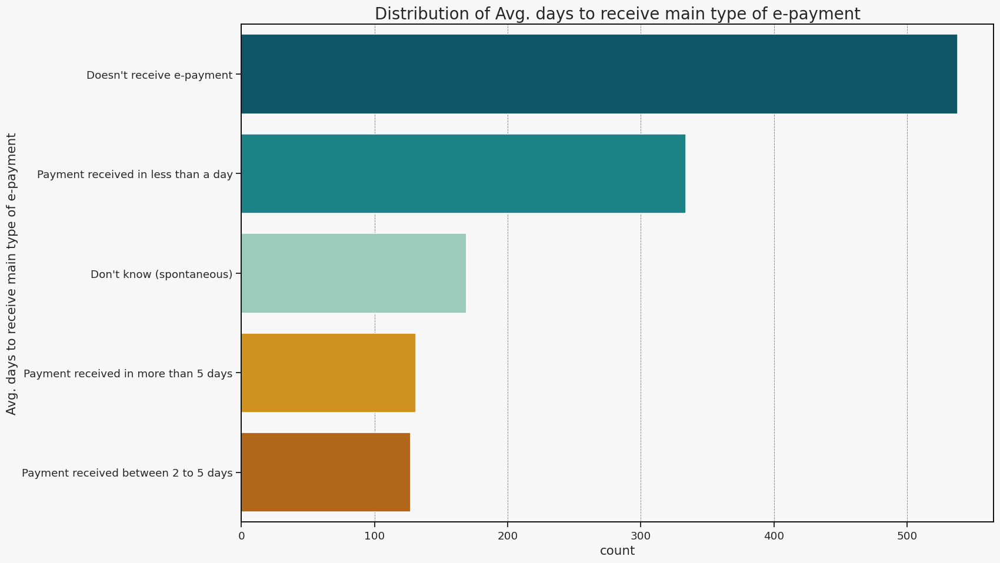

In [347]:
order = df1["payment_avg_rec_days"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='payment_avg_rec_days',order= order.index)
plt.title('Distribution of Avg. days to receive main type of e-payment')
plt.ylabel("Avg. days to receive main type of e-payment")
plt.show()

In [348]:
df1['k36'] = df1['k36'].cat.add_categories(["Doesn't receive e-payment"])
df1.loc[(df1['k33'] == 0), 'k36'] = "Doesn't receive e-payment"

In [349]:
df1['k36'].value_counts(dropna=False)

k36
Doesn't receive e-payment    538
0.0                          295
NaN                          165
1.0                          140
2.0                           58
Don't know (spontaneous)      45
3.0                           41
5.0                           16
4.0                            1
8.0                            1
Name: count, dtype: int64

In [350]:
df1.loc[df1['k33'] == "Don't know (spontaneous)", 'k36'] = "Don't know (spontaneous)"

In [351]:
df1['k36'].value_counts(dropna=False, normalize=True)*100

k36
Doesn't receive e-payment    41.384615
0.0                          22.692308
Don't know (spontaneous)     16.076923
1.0                          10.769231
2.0                           4.461538
3.0                           3.153846
5.0                           1.230769
4.0                           0.076923
8.0                           0.076923
NaN                           0.076923
Name: proportion, dtype: float64

In [352]:
# slice the column to get only the observations that use e-payment
percent_of_trans_rec = df1[(df1["k36"]!="Doesn't receive e-payment")& (df1["k36"]!="Don't know (spontaneous)")]
percent_of_trans_rec["k36"].value_counts(dropna=False,normalize=True)*100

k36
0.0                          53.345389
1.0                          25.316456
2.0                          10.488246
3.0                           7.414105
5.0                           2.893309
4.0                           0.180832
8.0                           0.180832
NaN                           0.180832
Don't know (spontaneous)      0.000000
Doesn't receive e-payment     0.000000
Name: proportion, dtype: float64

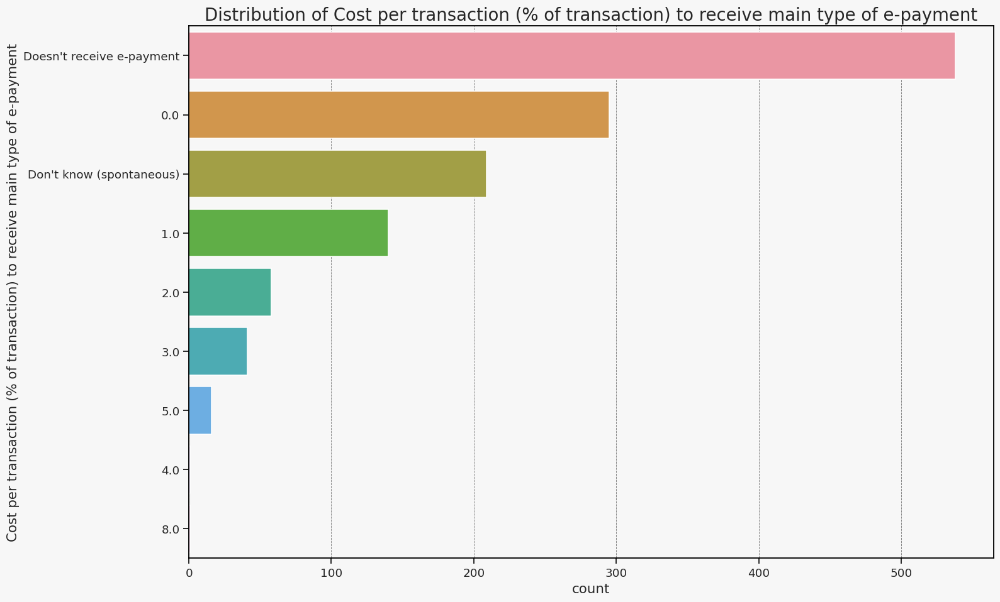

In [353]:
order = df1["k36"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k36',order= order.index)
plt.title('Distribution of Cost per transaction (% of transaction) to receive main type of e-payment',fontsize=18)
plt.ylabel("Cost per transaction (% of transaction) to receive main type of e-payment")
plt.show()

In [354]:
df1['k37'].value_counts(dropna=False)

k37
NaN                         703
0.0                         287
Don't know (spontaneous)     75
800.0                        40
1.0                          32
                           ... 
100.0                         1
2700.0                        1
3000.0                        1
4000.0                        1
1300.0                        1
Name: count, Length: 66, dtype: int64

The monthly fees doesnt give much indication since there are numerous fees vary a lot in addition to the donnot receive and dont know answers' count . I drop it.

#### Make

In [355]:
df1['k38'].value_counts(dropna=False)

k38
0                           664
Don't know (spontaneous)    200
100                          99
50                           67
80                           53
70                           37
20                           30
30                           30
40                           30
60                           18
25                           14
15                           10
10                            9
1                             8
75                            8
90                            7
13                            4
35                            3
45                            3
5                             2
2                             2
4                             1
6                             1
Name: count, dtype: int64

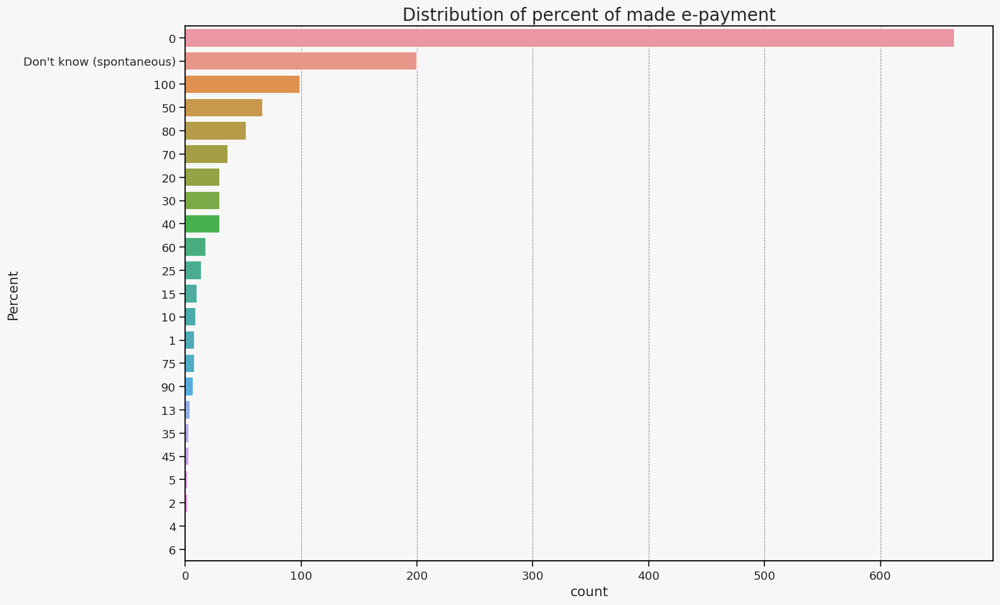

In [356]:
order = df1["k38"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k38',order= order.index)
plt.title('Distribution of percent of made e-payment',fontsize=18)
plt.ylabel("Percent")
plt.show()

In [357]:
df1["k39"].value_counts(dropna=False)

k39
NaN                                                             864
Internet and mobile banking, including direct debit transfer    252
Other                                                           132
Debit cards                                                      21
Credit cards                                                     21
Mobile money                                                      8
E-money and e-wallet, excluding mobile money                      2
Name: count, dtype: int64

In [358]:
df1['k39'] = df1['k39'].cat.add_categories(["Doesn't make e-payment","Don't know (spontaneous)"])
df1.loc[(df1['k38'] == 0), 'k39'] = "Doesn't make e-payment"

In [359]:
df1["k39"].value_counts(dropna=False)

k39
Doesn't make e-payment                                          664
Internet and mobile banking, including direct debit transfer    252
NaN                                                             200
Other                                                           132
Debit cards                                                      21
Credit cards                                                     21
Mobile money                                                      8
E-money and e-wallet, excluding mobile money                      2
Don't know (spontaneous)                                          0
Name: count, dtype: int64

In [360]:
df1.loc[df1['k38'] == "Don't know (spontaneous)", 'k39'] = "Don't know (spontaneous)"

In [361]:
df1["k39"].value_counts(normalize=True,dropna=False)*100

k39
Doesn't make e-payment                                          51.076923
Internet and mobile banking, including direct debit transfer    19.384615
Don't know (spontaneous)                                        15.384615
Other                                                           10.153846
Debit cards                                                      1.615385
Credit cards                                                     1.615385
Mobile money                                                     0.615385
E-money and e-wallet, excluding mobile money                     0.153846
Name: proportion, dtype: float64

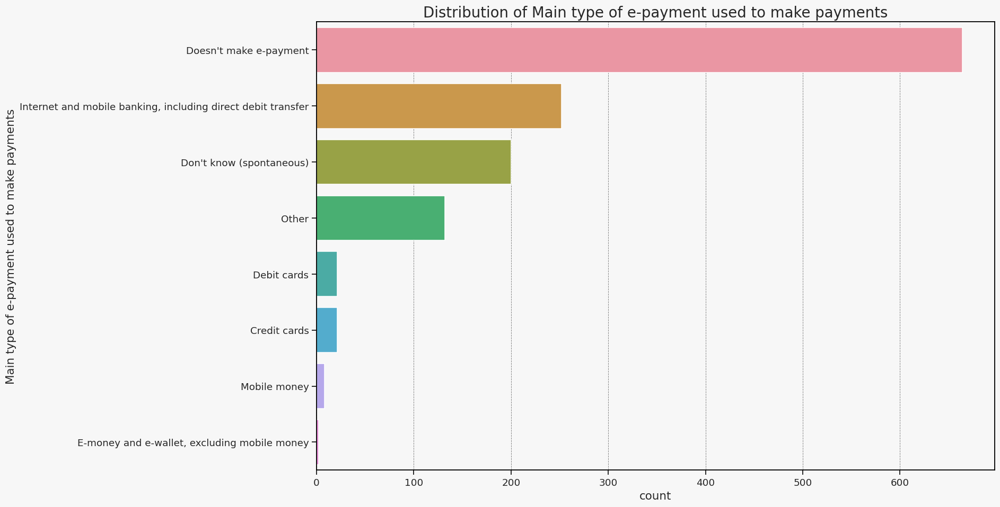

In [362]:
order = df1["k39"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k39',order= order.index)
plt.title('Distribution of Main type of e-payment used to make payments',fontsize=18)
plt.ylabel("Main type of e-payment used to make payments")
plt.show()

In [363]:
df1["k40"].value_counts(dropna=False)

k40
NaN                         864
0.0                         190
1.0                         146
2.0                          50
Don't know (spontaneous)     25
3.0                          12
5.0                           7
10.0                          3
15.0                          2
6.0                           1
Name: count, dtype: int64

In [364]:
df1['k40'] = df1['k40'].cat.add_categories(["Doesn't make e-payment"])
df1.loc[(df1['k38'] == 0), 'k40'] = "Doesn't make e-payment"
df1.loc[(df1['k38'] == "Don't know (spontaneous)"), 'k40'] = "Don't know (spontaneous)"

In [365]:
df1["k40"].value_counts(dropna=False,normalize=True)*100

k40
Doesn't make e-payment      51.076923
Don't know (spontaneous)    17.307692
0.0                         14.615385
1.0                         11.230769
2.0                          3.846154
3.0                          0.923077
5.0                          0.538462
10.0                         0.230769
15.0                         0.153846
6.0                          0.076923
Name: proportion, dtype: float64

In [366]:
# slice the column to get only the observations that use e-payment
percent_of_trans = df1[(df1["k40"]!="Doesn't make e-payment")& (df1["k40"]!="Don't know (spontaneous)")]
percent_of_trans["k40"].value_counts(dropna=False,normalize=True)*100

k40
0.0                         46.228710
1.0                         35.523114
2.0                         12.165450
3.0                          2.919708
5.0                          1.703163
10.0                         0.729927
15.0                         0.486618
6.0                          0.243309
Don't know (spontaneous)     0.000000
Doesn't make e-payment       0.000000
Name: proportion, dtype: float64

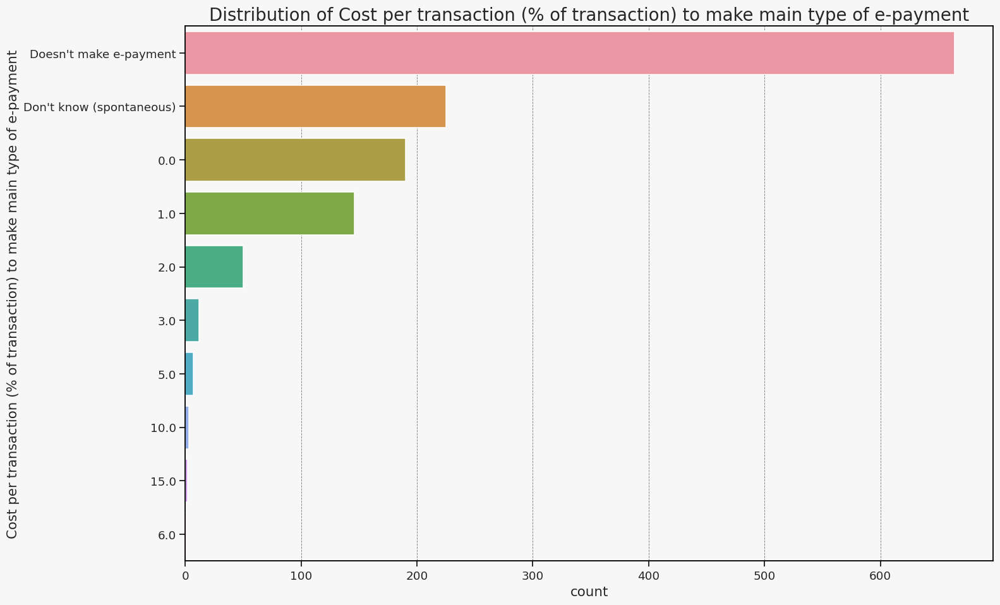

In [367]:
order = df1["k40"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='k40',order= order.index)
plt.title('Distribution of Cost per transaction (% of transaction) to make main type of e-payment',fontsize=18)
plt.ylabel("Cost per transaction (% of transaction) to make main type of e-payment")
plt.show()

* Are the companies who receive e-payment are those who make e-payment?

In [368]:
df1.head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a6a,d1a6b,d1a6c,d1a3,d2,d2a1,n3,d3a,d3b,d3c,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,PK16,h5,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata,finance_obstacle,payment_avg_rec_days
0,Food,Medium,Islamabad,Panel,Food and beverage,Manufacturing,Islamabad,38,Medium,31,7,2022,15,12,90,Urdu,Establishment,0,1,Yes,Yes,2.0,Yes,No,Yes,NaN,2021,6,30,Sole proprietorship,100,Yes,100,0,0,0,No,NaN,1995,108,1995,7,No,No,No,NaN,NaN,NaN,6000,No,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,No,NaN,NaN,Reduce electricity consumption,No,NaN,NaN,NaN,2000,Gallons,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,No,NaN,NaN,The establishment does not have an internet co...,NaN,NaN,NaN,NaN,With some difficulty,No obstacle,Manufacturing of,NaN,NaN,NaN,100,150000000.0,150000000.0,140000000.0,100,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,High trade costs,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No obstacle,No obstacle,Yes,No,Strongly agree,Strongly agree,We fixed it but did not take further action,Yes,1-2 production performance indicators,No,NaN,NaN,NaN,No,NaN,Does not apply (spontaneous),Rarely or never,National â main product sold mostly across t...,60.0,NaN,25.0,No,"Small or medium private firms, excluding this ...",No,No,No,No,No,No,Domestic private firms operating in the same p...,They avoid labor taxes or regulations,Regulations that restrict the establishmentâ...,No,"Yes, there is more competition",Prices set by HQ,No,NaN,Minor obstacle,No,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Yes,100.0,106.0,Availability of skilled labor force,Access to markets,100,100,No,NaN,NaN,Does not apply (spontaneous),NaN,NaN,NaN,NaN,No obstacle,No,NaN,Yes,Yes,2,NaN,NaN,No,NaN,NaN,No obstacle,Yes,80,0,0,20,0,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,Yes,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,No,No,No need for a loan - establishment had suffici...,No need for a

In [369]:
#create a column for reception of e-payment and another for makin e-payment. Consider Dont know as NO.
df1["rec_epayment"]=[ 0 if (x=="Don't know (spontaneous)" or x==0.0 ) else 1 for x in df1["k33"] ] 
df1["mak_epayment"]=[ 0 if (x=="Don't know (spontaneous)" or x==0.0 ) else 1 for x in df1["k38"] ] 

In [370]:
df1["rec_epayment"].value_counts(normalize=True)*100

rec_epayment
0    54.0
1    46.0
Name: proportion, dtype: float64

In [371]:
df1["mak_epayment"].value_counts(normalize=True)*100

mak_epayment
0    66.461538
1    33.538462
Name: proportion, dtype: float64

In [372]:
df1[["rec_epayment","k33", "mak_epayment","k38"]].head(10)

,rec_epayment,k33,mak_epayment,k38
0,0,0,0,0
1,1,40,1,50
2,0,0,0,0
3,1,60,0,0
4,1,60,0,0
5,1,10,0,0
6,1,30,1,20
7,0,0,0,0
8,1,70,0,0
9,1,50,1,50


In [373]:
rec_mak_enterprises = df1[df1["rec_epayment"]!=df1["mak_epayment"]]
rec_mak_enterprises.shape

(216, 420)

In [374]:
rec_mak_enterprises["mak_epayment"].value_counts()

mak_epayment
0    189
1     27
Name: count, dtype: int64

In [375]:
rec_mak_enterprises["rec_epayment"].value_counts()

rec_epayment
1    189
0     27
Name: count, dtype: int64

Not all enterprises who make e-payment recieve e-payment and the other way around.
Details: **189 enterprises make e-payment but dont receive vs 27 who receive and dont make.**
        

* What is the relation with internet connection?

In [376]:
df1["PK25"].describe()

count     1300
unique       3
top        Yes
freq      1005
Name: PK25, dtype: object

In [377]:
df1["PK25"].value_counts(normalize=True)*100

PK25
Yes                         77.307692
No                          22.615385
Don't know (spontaneous)     0.076923
Name: proportion, dtype: float64

In [378]:
# Create a new column for internet usage considering Dont know as no
df1["internet_usage"]=[ 0 if (x=="Don't know (spontaneous)" or x=="No" ) else 1 for x in df1["PK25"] ] 

In [379]:
df1[["internet_usage","PK25"]].head()

,internet_usage,PK25
0,1,Yes
1,1,Yes
2,1,Yes
3,1,Yes
4,1,Yes


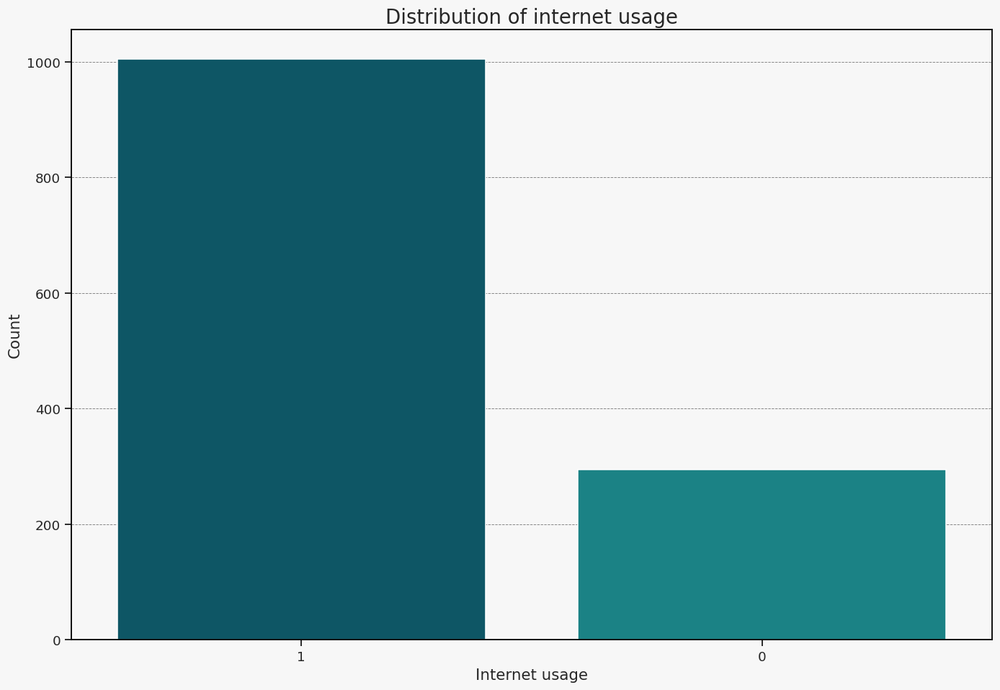

In [380]:
order = df1["internet_usage"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,x='internet_usage', order= order.index)
plt.title('Distribution of internet usage',fontsize=18)
plt.ylabel("Count")
plt.xlabel("Internet usage")
plt.show()

<Figure size 1650x1100 with 0 Axes>

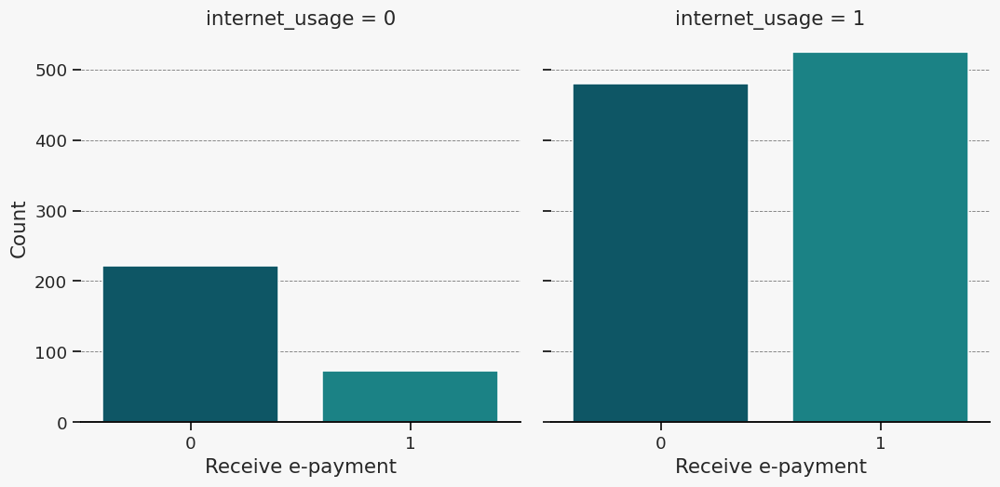

In [381]:
plt.figure(figsize=(15,10))
g = sns.catplot(
    data=df1, x="rec_epayment", col="internet_usage",
    kind="count",
)
g.set_axis_labels("Receive e-payment","Count")
g.despine(left=True)
plt.show()

<Figure size 1650x1100 with 0 Axes>

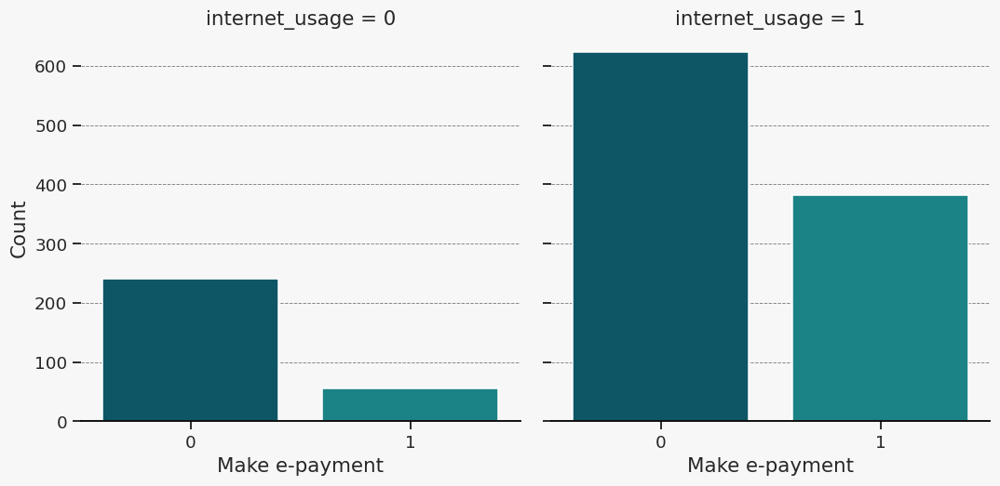

In [382]:
plt.figure(figsize=(15,10))
g = sns.catplot(
    data=df1, x="mak_epayment", col="internet_usage",
    kind="count",
)
g.set_axis_labels( "Make e-payment","Count")
g.despine(left=True)
plt.show()

A: 77.3 % of enterprises uses Internet and there dont seem to have an effect on the e-payment.

Q:What is the relation of using mobile money?

In [383]:
df1["PK27"].describe()

count     1300
unique       3
top         No
freq       963
Name: PK27, dtype: object

In [384]:
df1["PK27"].value_counts(normalize=True, dropna=False)*100

PK27
No                          74.076923
Yes                         25.692308
Don't know (spontaneous)     0.230769
Name: proportion, dtype: float64

In [385]:
# Create a new column for internet usage considering Dont know as no
df1["mobile_money_usage"]=[ 0 if (x=="Don't know (spontaneous)" or x=="No" ) else 1 for x in df1["PK27"] ] 

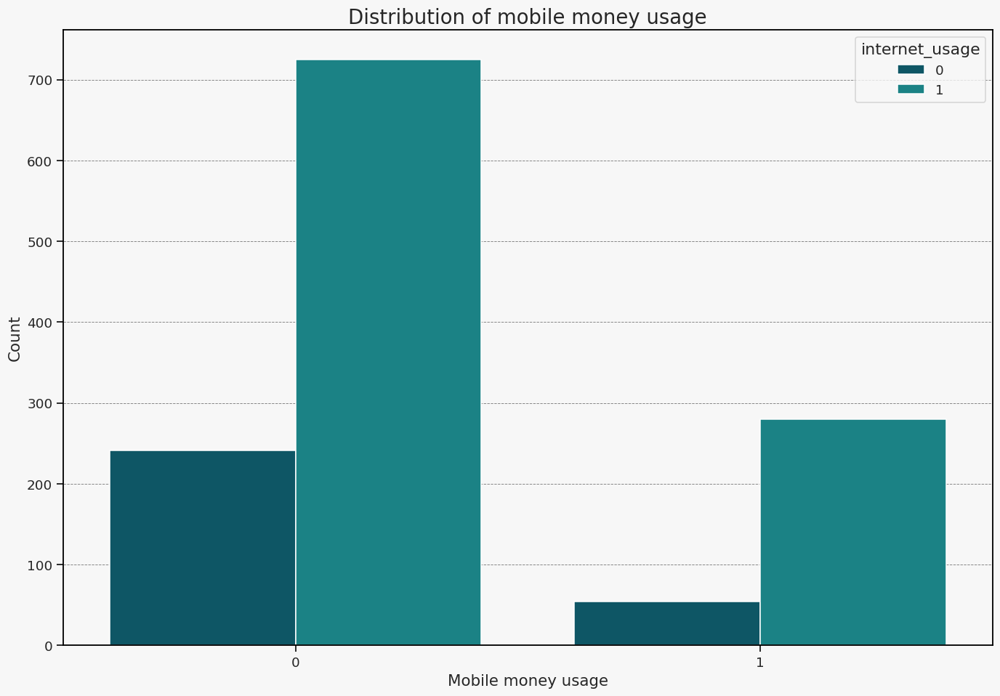

In [386]:
order = df1["mobile_money_usage"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,x='mobile_money_usage', hue='internet_usage',order= order.index)
plt.title('Distribution of mobile money usage',fontsize=18)
plt.ylabel("Count")
plt.xlabel("Mobile money usage")
plt.show()

Nothing suggest a relation between the two internet usage and mobile usage.

**What we can conclude:**
* **54.0%** of enterprises **receive e-payments** and **66.5%** of enterprises **make e-payments** (considering every answer as Don't know as No)
* The majority of firms who use epayment do make and receive payment however not all since the answers show that 189 enterprises make e-payment but dont receive vs 27 who receive and dont make.
* Out of the firms reported receiving e-payments 56.4% state having received Payment in less than a day
* Rank of popularity of payment methods according to firm who reported making or receiving e-payments are:
  1. Internet and mobile banking, including direct debit transfer
  2. Other
  3. Debit cards
  4. Credit cards
  5. Mobile money
  6. E-money and e-wallet, excluding mobile money
* The data doesnt suggest that the cost of transaction to be the cause of not adopting e-payment since in one hand 46.2% of received transactions are free of charge while 47.6% cost 1% to 2% and in the other hand 53.3% of made transactions are free of charge while 35.8% cost 1% to 2%.

* Also, the delay of payment reception is not suggested to be a hinder to e-payment adoption since only 22% of firms which receive e-payments reported average delay more than 5 days.

* **77.3 %** of enterprises uses **Internet** but there dont seem to have an effect on the e-payment.
* **25.7 %** of enterprises uses **Mobile payments** Noting that Mobile money ranked 5th in terms of popularity.

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Finance - loan /credit line/overdraft</h2>

   * k162 - In Last FY, Did Establishment Apply For New Loans/Lines of Credit?
   * PKk17 - Main Reason For Not Applying For New Loans or New Lines of Credit - localized
   * k82 - Establishment Has A Line of Credit or Loan From A Financial Institution?
   * k15d - Outstanding Personal Loans Used To Finance Establishment'S Business Activities?
   * PK28 - Does the firm owe any debt to informal sources?
   * k7 - At This Time, Does This Establishment Have An Overdraft Facility?
   * k6 - Does This Establishment Have A Checking And\or Saving Account?

* k162 - In Last FY, Did Establishment Apply For New Loans/Lines of Credit?

In [387]:
df1["k162"].describe()

count     1300
unique       5
top         No
freq      1238
Name: k162, dtype: object

In [388]:
df1["k162"].value_counts(normalize=True, dropna=False)*100

k162
No                                       95.230769
Don't know (spontaneous)                  3.692308
Yes, a line of credit only                0.461538
Yes, a loan only                          0.384615
Yes, both a line of credit and a loan     0.230769
Name: proportion, dtype: float64

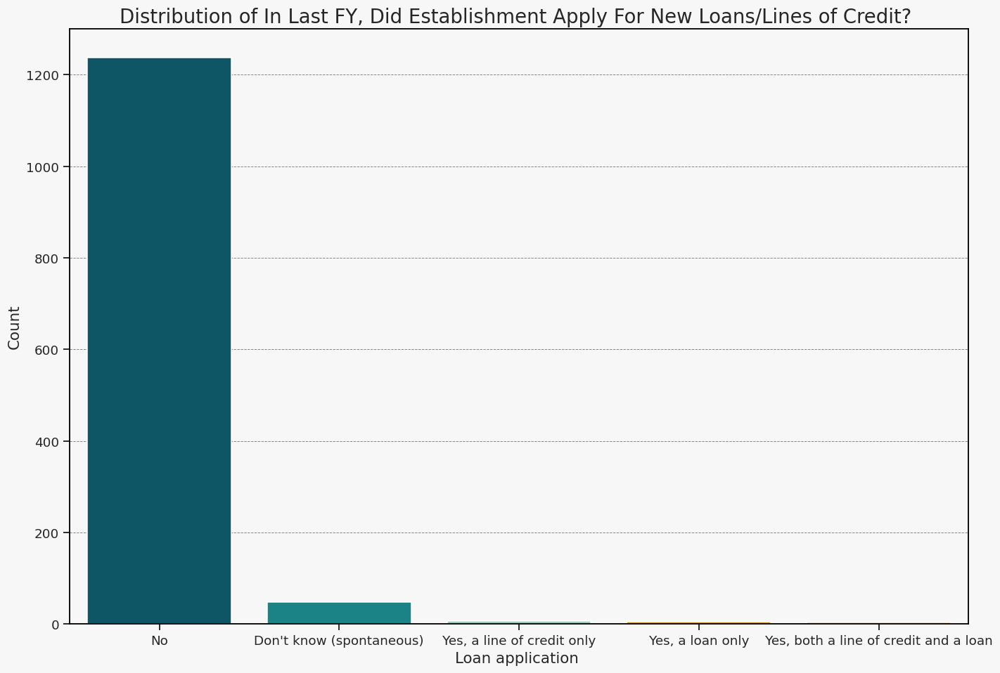

In [389]:
order = df1["k162"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,x='k162',order= order.index)
plt.title('Distribution of In Last FY, Did Establishment Apply For New Loans/Lines of Credit? ',fontsize=18)
plt.ylabel("Count")
plt.xlabel("Loan application ")
plt.show()

* PKk17 - Main Reason For Not Applying For New Loans or New Lines of Credit - localized

In [390]:
df1["PKk17"].describe()

count                                                  1238
unique                                                    9
top       No need for a loan - establishment had enough ...
freq                                                    587
Name: PKk17, dtype: object

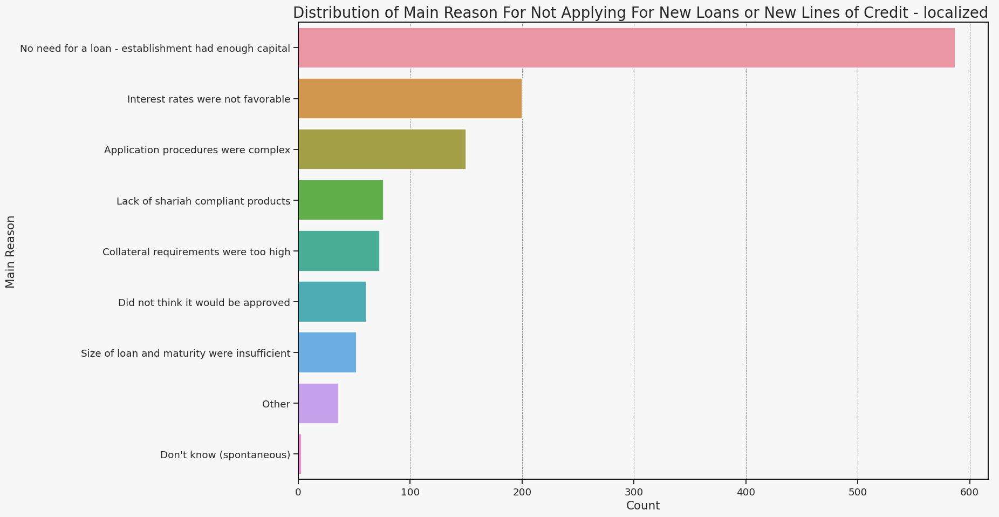

In [391]:
order = df1["PKk17"].value_counts()
plt.figure(figsize=(15,10))
sns.countplot(df1,y='PKk17',order= order.index)
plt.title('Distribution of Main Reason For Not Applying For New Loans or New Lines of Credit - localized ',fontsize=18)
plt.ylabel("Main Reason")
plt.xlabel("Count")
plt.show()

In [392]:
df1["PKk17"].value_counts(dropna=False)

PKk17
No need for a loan - establishment had enough capital    587
Interest rates were not favorable                        200
Application procedures were complex                      150
Lack of shariah compliant products                        76
Collateral requirements were too high                     73
NaN                                                       62
Did not think it would be approved                        61
Size of loan and maturity were insufficient               52
Other                                                     36
Don't know (spontaneous)                                   3
Name: count, dtype: int64

In [393]:
#Check why this answer was not filled by checking values of K162
df1[df1["PKk17"].isna()][["k162","PKk17"]]

,k162,PKk17
19,Don't know (spontaneous),NaN
37,Don't know (spontaneous),NaN
58,Don't know (spontaneous),NaN
171,Don't know (spontaneous),NaN
183,Don't know (spontaneous),NaN
...,...,...
1202,Don't know (spontaneous),NaN
1244,"Yes, a loan only",NaN
1255,Don't know (spontaneous),NaN
1259,Don't know (spontaneous),NaN


In [394]:
# If K162 = dont know then PKk17 become dont know, other than that creat new category called credit requested
df1['PKk17'] = df1['PKk17'].cat.add_categories(["Credit Requested"])
df1.loc[(df1['k162'] == "Don't know (spontaneous)"), 'PKk17'] = "Don't know (spontaneous)"
df1.loc[((df1['k162'] != "No")& (df1['k162'] != "Don't know (spontaneous)")), 'PKk17'] = "Credit Requested"

In [395]:
df1["PKk17"].value_counts(dropna=False,normalize=True)*100

PKk17
No need for a loan - establishment had enough capital    45.153846
Interest rates were not favorable                        15.384615
Application procedures were complex                      11.538462
Lack of shariah compliant products                        5.846154
Collateral requirements were too high                     5.615385
Did not think it would be approved                        4.692308
Size of loan and maturity were insufficient               4.000000
Don't know (spontaneous)                                  3.923077
Other                                                     2.769231
Credit Requested                                          1.076923
Name: proportion, dtype: float64

The weight of each reason among those who dont have enough capital.

In [396]:
df1[(df1["PKk17"]!= "No need for a loan - establishment had enough capital")& (df1["PKk17"]!= "Don't know (spontaneous)")]["PKk17"].value_counts(dropna=False,normalize=True)*100

PKk17
Interest rates were not favorable                        30.211480
Application procedures were complex                      22.658610
Lack of shariah compliant products                       11.480363
Collateral requirements were too high                    11.027190
Did not think it would be approved                        9.214502
Size of loan and maturity were insufficient               7.854985
Other                                                     5.438066
Credit Requested                                          2.114804
Don't know (spontaneous)                                  0.000000
No need for a loan - establishment had enough capital     0.000000
Name: proportion, dtype: float64

In [397]:
enough_capital = df1[(df1["PKk17"]== "No need for a loan - establishment had enough capital")]
enough_capital["finance_obstacle"].value_counts(dropna=False,normalize=True)*100

finance_obstacle
0.0    55.536627
1.0    44.463373
Name: proportion, dtype: float64

44.5% of the enterprises who answered that they have enough capital also reported that they perceive finance is an obstacle to a certain degree. 

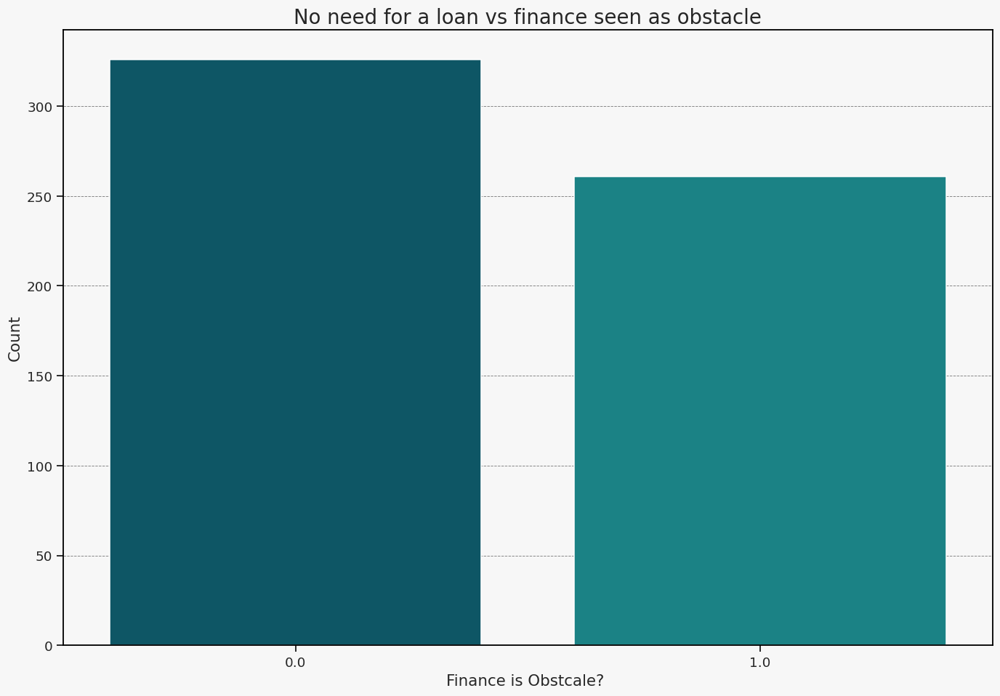

In [398]:
plt.figure(figsize=(15,10))
sns.countplot(enough_capital,x='finance_obstacle')
plt.title('No need for a loan vs finance seen as obstacle',fontsize=18)
plt.ylabel("Count")
plt.xlabel("Finance is Obstcale? ")
plt.show()

Establishment Has A Line of Credit or Loan From A Financial Institution?

In [399]:
df1["k82"].value_counts(dropna=False)

k82
No                                       1252
Don't know (spontaneous)                   24
Yes, a loan only                           14
Yes, a line of credit only                  5
Yes, both a line of credit and a loan       5
Name: count, dtype: int64

Outstanding Personal Loans Used To Finance Establishment'S Business Activities? 

In [400]:
df1["k15d"].value_counts(dropna=False,normalize=True)*100

k15d
No                          94.000000
Don't know (spontaneous)     3.692308
Yes                          2.307692
Name: proportion, dtype: float64

Does the firm owe any debt to informal sources? 

In [401]:
df1["PK28"].value_counts(dropna=False,normalize=True)*100

PK28
No                          95.153846
Yes                          2.538462
Don't know (spontaneous)     2.307692
Name: proportion, dtype: float64

At This Time, Does This Establishment Have An Overdraft Facility?

In [402]:
df1["k7"].value_counts(dropna=False,normalize=True)*100

k7
No                          56.615385
Yes                         41.615385
Don't know (spontaneous)     1.769231
Name: proportion, dtype: float64

Create a new feature combining loan, credit line and overdrafting

In [403]:
df1['access_formal_financing'] = df1.apply(
    lambda row: int(
        row['k7'] == "Yes" or # overdraft facility
        row['k82'] == "Yes" or # A Line of Credit or Loan From A Financial Institution
        row['k162'] in [
            "Yes, a loan only",
            "Yes, a line of credit only",
            "Yes, both a line of credit and a loan"
        ]
    ), axis=1
)

In [404]:
df1['access_formal_financing'].value_counts(dropna=False, normalize=True)*100

access_formal_financing
0    58.230769
1    41.769231
Name: proportion, dtype: float64

In [405]:
# Validate the results
df1[['access_formal_financing','k7','k82','k162']].head(20)

,access_formal_financing,k7,k82,k162
0,1,Yes,No,No
1,1,Yes,No,No
2,1,Yes,No,No
3,0,No,No,No
4,0,Don't know (spontaneous),No,No
5,1,Yes,No,No
6,1,Yes,No,No
7,1,Yes,No,No
8,0,No,No,No
9,0,No,No,No


Check the accessibility to formal finance by region and by industry.

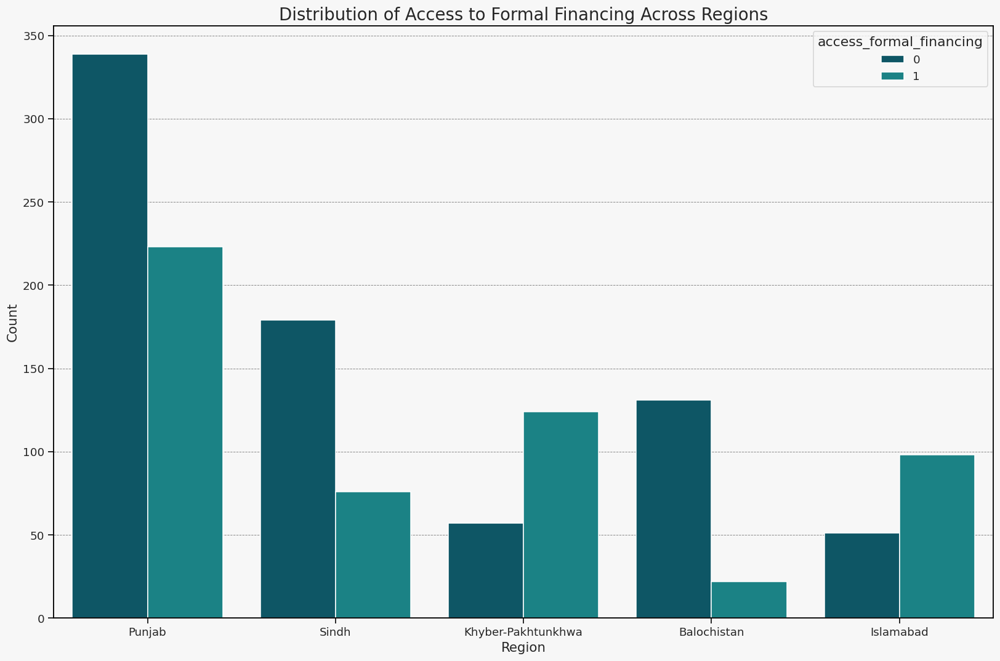

In [406]:
# Plot the countplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, x='a3a', hue='access_formal_financing')
plt.title('Distribution of Access to Formal Financing Across Regions', fontsize=18)
plt.ylabel("Count")
plt.xlabel("Region")
plt.tight_layout()
plt.show()

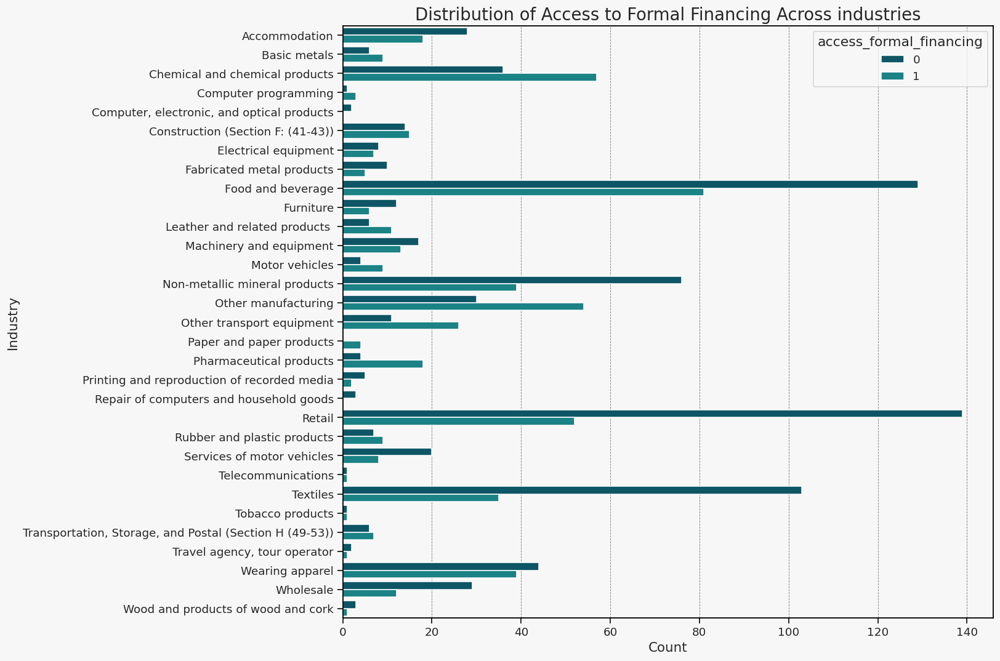

In [407]:
# Plot the countplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, y='a4b_v4', hue='access_formal_financing')
plt.title('Distribution of Access to Formal Financing Across industries', fontsize=18)
plt.ylabel("Industry")
plt.xlabel("Count")
plt.tight_layout()
plt.show()

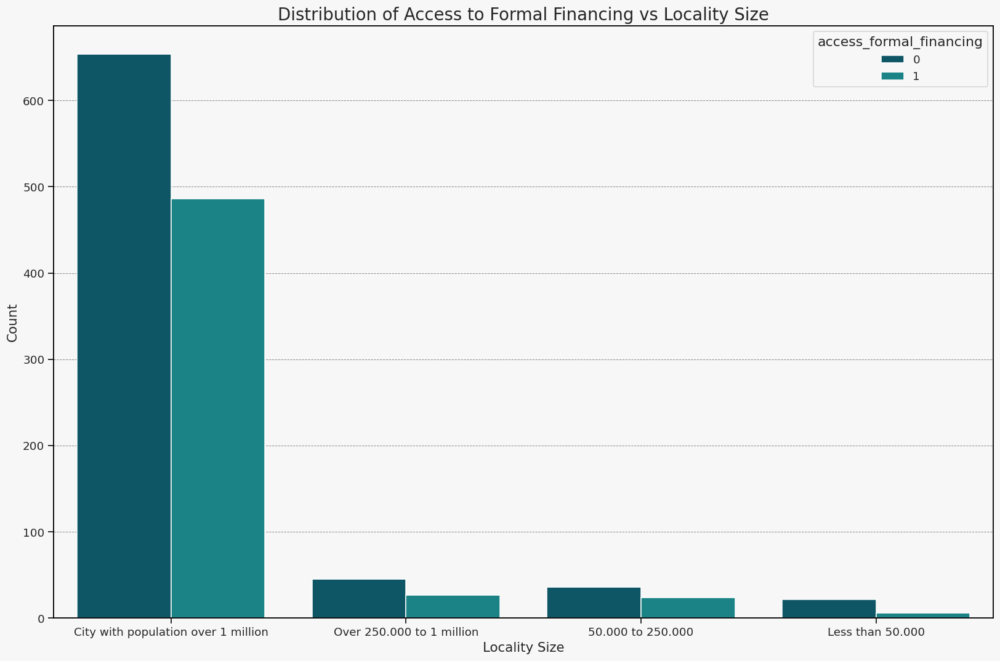

In [408]:
# Plot the countplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, x='a3', hue='access_formal_financing')
plt.title('Distribution of Access to Formal Financing vs Locality Size', fontsize=18)
plt.ylabel("Count")
plt.xlabel("Locality Size")
plt.tight_layout()
plt.show()

Does This Establishment Have A Checking And\or Saving Account? 

In [409]:
df1['k6'].value_counts(dropna=False)

k6
Yes                         1181
No                           116
Don't know (spontaneous)       3
Name: count, dtype: int64

In [410]:
df1['has_account'] = df1.apply(
    lambda row: int(
        row['k6'] == "Yes"
    ), axis=1
)


In [411]:
df1['has_account'].value_counts(normalize=True)*100

has_account
1    90.846154
0     9.153846
Name: proportion, dtype: float64

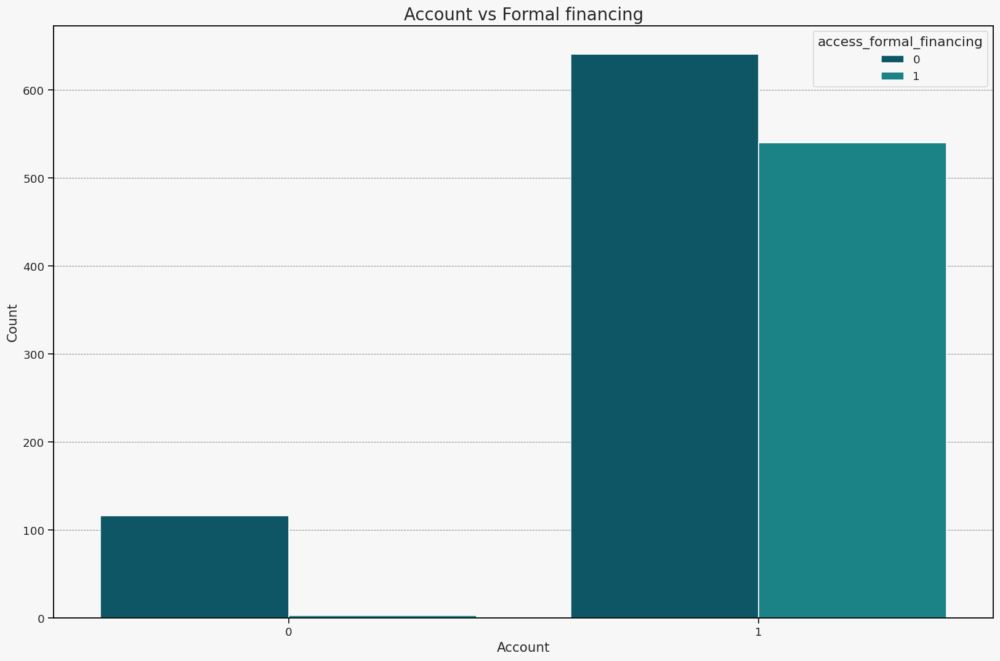

In [412]:
# Plot the countplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, x='has_account', hue='access_formal_financing')
plt.title('Account vs Formal financing', fontsize=18)
plt.ylabel("Count")
plt.xlabel("Account")
plt.tight_layout()
plt.show()

The plot shows some enterprises not having bank account but still have access to official finance.I need to understand how!

In [413]:
no_account_finance_df = df1[(df1['has_account'] == 0) & (df1['access_formal_financing'] == 1)]
no_account_finance_df

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a6a,d1a6b,d1a6c,d1a3,d2,d2a1,n3,d3a,d3b,d3c,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,PK16,h5,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata,finance_obstacle,payment_avg_rec_days,rec_epayment,mak_epayment,internet_usage,mobile_money_usage,access_formal_financing,has_account
433,Other Manufacturing,Medium,Islamabad,Panel,Pharmaceutical products,Manufacturing,Islamabad,90,Medium,1,8,2022,11,25,90,Urdu,Establishment,0,1,Yes,Yes,90.0,No,NaN,NaN,Yes,2021,12,31,Partnership,80,Yes,100,0,0,0,No,NaN,2009,90,2013,8,No,No,No,NaN,NaN,NaN,2800,No,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,No,NaN,NaN,Reduce electricity consumption,No,NaN,NaN,NaN,1500,Gallons,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,No,NaN,NaN,No,NaN,NaN,NaN,NaN,With some difficulty,Minor obstacle,Manufacturing of,NaN,NaN,NaN,100,900000000.0,920000000.0,800000000.0,100,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,High trade costs,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Minor obstacle,Minor obstacle,No,NaN,Tend to agree,Tend to agree,We fixed it and took action to make sure it di...,No,NaN,No,NaN,NaN,NaN,No,NaN,Promotions were based partly on performance an...,After 6 months of identifying non-manager unde...,National â main product sold mostly across t...,Too many to count,NaN,25.0,No,"Government or government agencies, including s...",No,No,Yes,Yes,Yes,Yes,Foreign firms operating in Pakistan,They do not pay import duties or observe trade...,Criteria for licensing that puts certain types...,No,"Yes, there is more competition",Yes,No,NaN,Minor obstacle,No,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Yes,100.0,72.0,Labor cost,Availability of land slot,100,0,No,NaN,NaN,No,NaN,NaN,NaN,NaN,Minor obstacle,No,NaN,Yes,Yes,2,NaN,NaN,No,NaN,NaN,Minor obstacle,Yes,100,0,0,0,0,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,No,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,No,No,Applic

These enterprises records shows inconsistency since despite that they answer No or Don't know to the detention of bank account they answered yes to having overdraft facility. So these record must be corrected.Use the dataset original columns to check if these records are all we have.

In [414]:
no_account_overdraft_df = df1[((df1['k6'] == "No")|(df1['k6'] == "Don't know (spontaneous)")) & (df1['k7'] == "Yes")]
no_account_overdraft_df

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a6a,d1a6b,d1a6c,d1a3,d2,d2a1,n3,d3a,d3b,d3c,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,PK16,h5,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata,finance_obstacle,payment_avg_rec_days,rec_epayment,mak_epayment,internet_usage,mobile_money_usage,access_formal_financing,has_account
433,Other Manufacturing,Medium,Islamabad,Panel,Pharmaceutical products,Manufacturing,Islamabad,90,Medium,1,8,2022,11,25,90,Urdu,Establishment,0,1,Yes,Yes,90.0,No,NaN,NaN,Yes,2021,12,31,Partnership,80,Yes,100,0,0,0,No,NaN,2009,90,2013,8,No,No,No,NaN,NaN,NaN,2800,No,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,No,NaN,NaN,Reduce electricity consumption,No,NaN,NaN,NaN,1500,Gallons,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,No,NaN,NaN,No,NaN,NaN,NaN,NaN,With some difficulty,Minor obstacle,Manufacturing of,NaN,NaN,NaN,100,900000000.0,920000000.0,800000000.0,100,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,High trade costs,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Minor obstacle,Minor obstacle,No,NaN,Tend to agree,Tend to agree,We fixed it and took action to make sure it di...,No,NaN,No,NaN,NaN,NaN,No,NaN,Promotions were based partly on performance an...,After 6 months of identifying non-manager unde...,National â main product sold mostly across t...,Too many to count,NaN,25.0,No,"Government or government agencies, including s...",No,No,Yes,Yes,Yes,Yes,Foreign firms operating in Pakistan,They do not pay import duties or observe trade...,Criteria for licensing that puts certain types...,No,"Yes, there is more competition",Yes,No,NaN,Minor obstacle,No,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Yes,100.0,72.0,Labor cost,Availability of land slot,100,0,No,NaN,NaN,No,NaN,NaN,NaN,NaN,Minor obstacle,No,NaN,Yes,Yes,2,NaN,NaN,No,NaN,NaN,Minor obstacle,Yes,100,0,0,0,0,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,NaN,No,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,No,No,Applic

Same records.

In [415]:

df1.loc[((df1['k6'] == "No")|(df1['k6'] == "Don't know (spontaneous)")) & (df1['k7'] == "Yes"),'k6'] ="Yes"
df1['has_account'] = df1.apply(
    lambda row: int(
        row['k6'] == "Yes" 
    ), axis=1
)


In [416]:

df1['has_account'].value_counts(normalize=True)*100

has_account
1    91.076923
0     8.923077
Name: proportion, dtype: float64

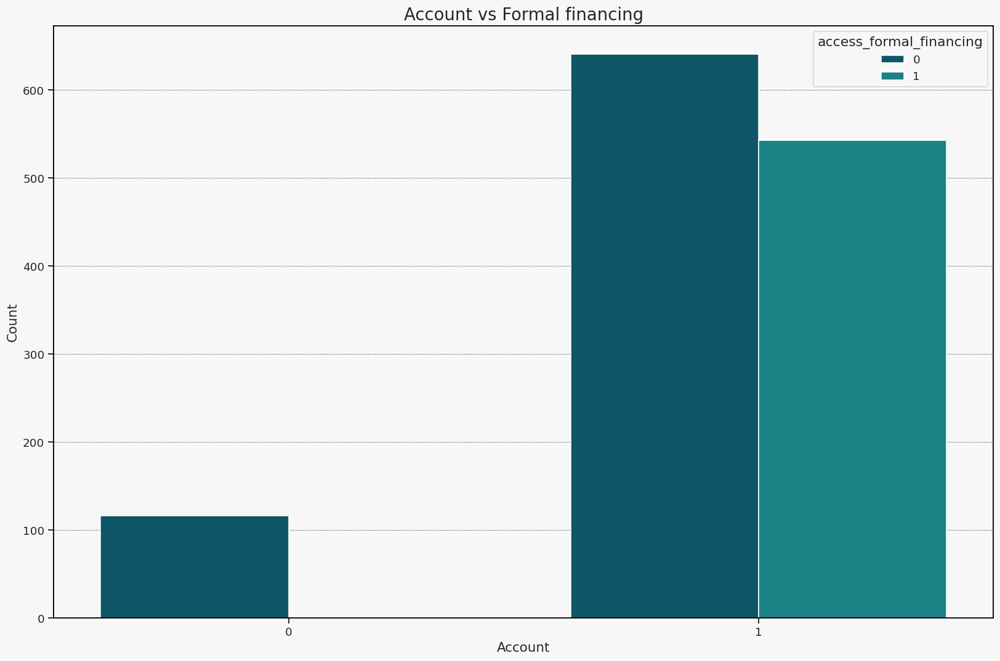

In [417]:
# Plot the countplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, x='has_account', hue='access_formal_financing')
plt.title('Account vs Formal financing', fontsize=18)
plt.ylabel("Count")
plt.xlabel("Account")
plt.tight_layout()
plt.show()

In [418]:
no_account_df = df1[df1['has_account']==0]

In [419]:
no_account_df.shape

(116, 424)

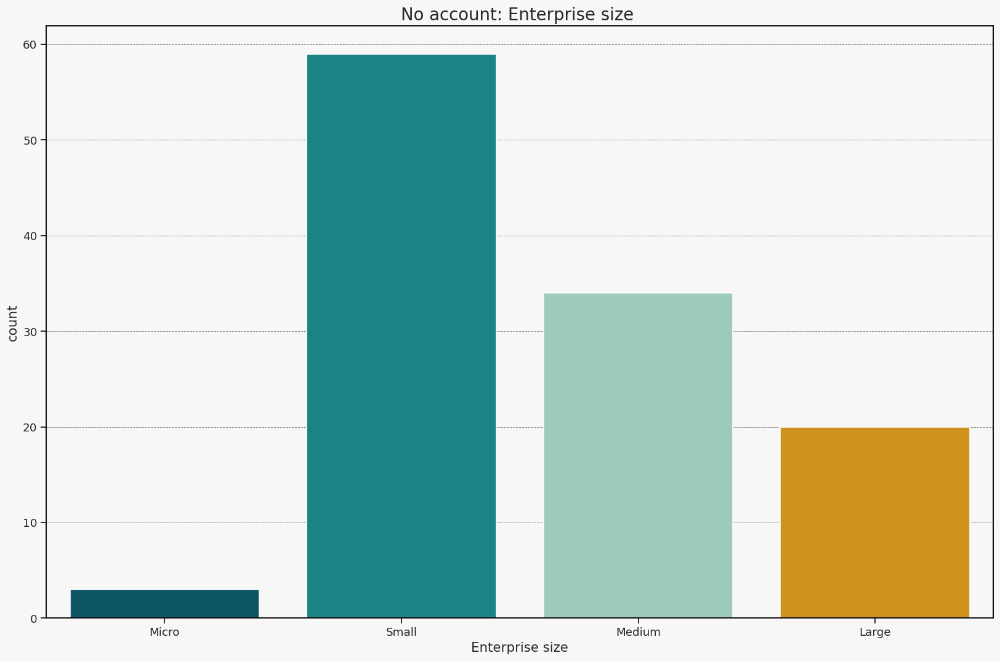

In [420]:
# Plot the countplot
plt.figure(figsize=(15, 10))
sns.countplot(data=no_account_df, x='a6b')
plt.title('No account: Enterprise size ', fontsize=18)
plt.xlabel("Enterprise size")
plt.ylabel("count")
plt.tight_layout()
plt.show()

In [421]:
no_account_df['a6b'].value_counts(normalize=True,dropna=False)*100

a6b
Small     50.862069
Medium    29.310345
Large     17.241379
Micro      2.586207
Name: proportion, dtype: float64

In [422]:
no_account_df[no_account_df['a6b']=="Large"]['a6c'].value_counts()

a6c
300     4
100     3
150     3
120     2
250     2
125     2
170     1
350     1
200     1
2010    1
Name: count, dtype: int64

In [423]:
no_account_df[no_account_df['a6c']==2010]

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a6a,d1a6b,d1a6c,d1a3,d2,d2a1,n3,d3a,d3b,d3c,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,PK16,h5,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata,finance_obstacle,payment_avg_rec_days,rec_epayment,mak_epayment,internet_usage,mobile_money_usage,access_formal_financing,has_account
1083,Non-Metallic Mineral Products,Medium,Punjab,Fresh,Non-metallic mineral products,Manufacturing,Punjab,2010,Large,21,10,2022,12,15,90,Urdu,Establishment,0,1,Yes,Yes,2.0,Yes,No,Yes,NaN,2021,6,30,Sole proprietorship,100,Yes,100,0,0,0,No,NaN,2010,13,2010,7,No,No,No,NaN,NaN,NaN,500,Yes,13.0,1.0,30.0,NaN,300000.0,No,NaN,NaN,Yes,10.0,500000.0,Invest in alternate sources of electricity,No,NaN,NaN,NaN,1800,Gallons,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,No,NaN,NaN,The establishment does not have an internet co...,NaN,NaN,NaN,NaN,With some difficulty,Major obstacle,Manufacturing of,NaN,NaN,NaN,100,20000000.0,15000000.0,11000000.0,100,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,5.0,High trade costs,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Very severe obstacle,Minor obstacle,Yes,No,Tend to agree,Tend to agree,We fixed it and took action to make sure it di...,Yes,3-9 production performance indicators,Yes,Combination of short term and long term produc...,Possible to achieve without much effort,Only senior managers,No,NaN,Promotions were based solely on performance an...,After 6 months of identifying non-manager unde...,Local â main product sold mostly in same mun...,18.0,NaN,30.0,No,"Small or medium private firms, excluding this ...",No,No,No,No,No,No,Domestic private firms operating in the same p...,They do not pay import duties or observe trade...,Criteria for licensing that puts certain types...,Yes,"Yes, there is more competition",Prices are regulated,No,NaN,Minor obstacle,No,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,No,100.0,72.0,Cost of land / buildings,Availability of main inputs,100,

In [424]:
df1[df1['a6c']==2010][['k6','k7','k82','k9','k10','b5','b6','a6c']]

,k6,k7,k82,k9,k10,b5,b6,a6c
1083,No,No,No,NaN,NaN,2010,13,2010


In [425]:
#check the relationship between a6B,a6a and a6c
df.groupby(['a6b', 'a6a'])['a6c'].agg(['min', 'mean', 'max'])

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


min        mean     max
a6b    a6a                              
Micro  Small     2.0    3.285714     4.0
       Medium    3.0    3.000000     3.0
       Large     NaN         NaN     NaN
Small  Small     5.0   10.095238    19.0
       Medium    5.0    9.378641    18.0
       Large     5.0    9.294118    18.0
Medium Small    20.0   34.914530    80.0
       Medium   20.0   47.311864    95.0
       Large    20.0   51.395062    95.0
Large  Small   100.0  314.230769  1840.0
       Medium  100.0  244.782609  3000.0
       Large   100.0  410.735849  5500.0

Categories in a6b is consistent with a6c but **a6a is not consistent**.

Check the size of enterprises which detain a bank account.

In [426]:
no_account_df['a6c'].describe()

count     116.000000
mean       65.491379
std       196.755487
min         3.000000
25%         7.000000
50%        15.000000
75%        60.000000
max      2010.000000
Name: a6c, dtype: float64

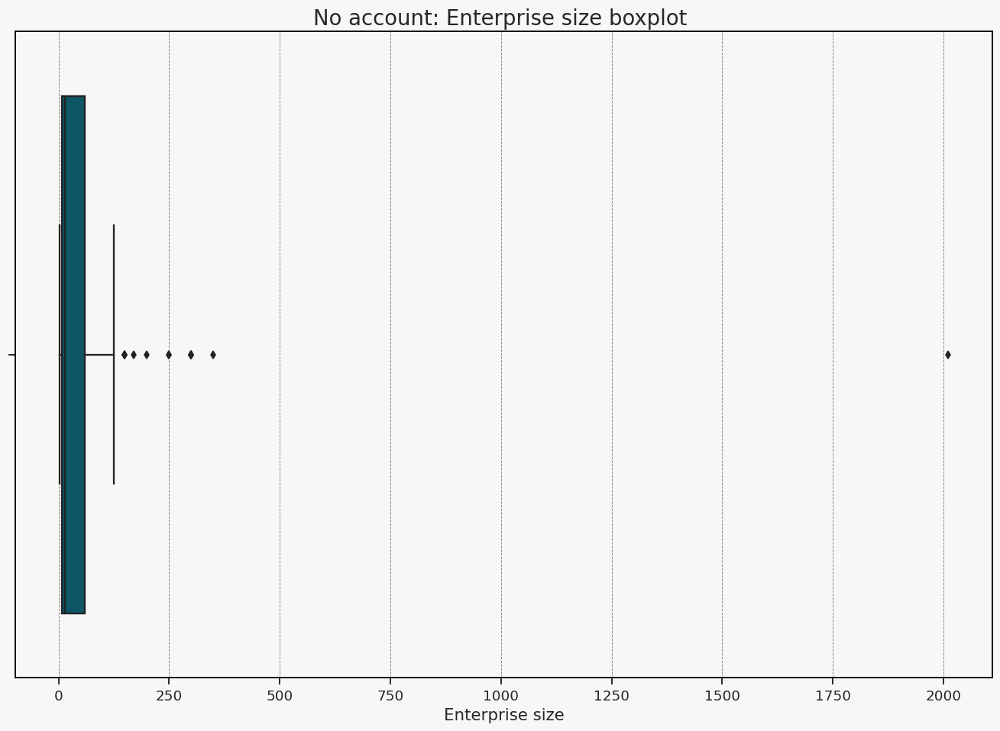

In [427]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=no_account_df, x='a6c')
plt.title('No account: Enterprise size boxplot ', fontsize=18)
plt.xlabel("Enterprise size")
plt.show()

An enterprise with size 2010 and dont have a bank account is probably a mistake.However, I will take action later if deemed necessary.

**What we can conclude:**
* `Loan`:
    * In the last FY, 95% of enterprises didnt apply to a loan
    * Reasons:
        1. "No need for a loan - establishment had enough capital" 45% ;
        2. Interest rates were not favorable  15.4%;Application procedures were complex 11.5%;
        3. Lack of shariah compliant products 5.8%, Collateral requirements were too high 5.6%;
        4.  Did not think it would be approved 4.7%, Size of loan and maturity were insufficient  4%;
        5.  others
    * However, 44.5% of enterprises who signaled that financing was sort of obstacle to them also reported not applying       to a loan because "No need for a loan - establishment had enough capital "!
* Only 2.3% of enterprises report having personal Outstanding loan and 2.5% reported having informal loans.
* We can see that around 41.8% of the enterprises are have acces of a type of formal financing ( From the replies to  k162 - In Last FY, Did Establishment Apply For New Loans/Lines of Credit?,  k82 - Establishment Has A Line of Credit or Loan From A Financial Institution?& k7 - At This Time, Does This Establishment Have An Overdraft Facility?.).
* Worth noting that enterprises which have acess to finance with respect who dont are higher in  Khyber-Pakthunkhwa & Islamabad
* `Bank account`:
    * 91% of enterprises have bank account 


<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Start operation / head counts</h2>

   * a6c - screener Size
   * b5 - Year Establishment Began Operations
   * b6 - Number of Full-Time Employees of The Establishment When It Started Operations

* b5 - Year Establishment Began Operations

In [428]:
df1['b5'].describe()

count     1300
unique      82
top       2010
freq        75
Name: b5, dtype: int64

  * b6 - Number of Full-Time Employees of The Establishment When It Started Operations

In [429]:
df1['b6'].describe()

count     1300
unique      80
top          5
freq       153
Name: b6, dtype: int64

* a6c - screener Size

In [430]:
df1['a6c'].describe()

count    1300.000000
mean      104.034615
std       333.481940
min         2.000000
25%        12.000000
50%        27.500000
75%        80.000000
max      5500.000000
Name: a6c, dtype: float64

In [431]:
#replace dont know with most frequent value =2010
df1['b5'] = df1['b5'].astype(str).replace("Don't know (spontaneous)", "2010")
df1['b5'] = df1['b5'].astype("int16")

In [432]:
#replace dont know with most frequent value =5
df1['b6'] = df1['b6'].replace("Don't know (spontaneous)", "5")
df1['b6'] = df1['b6'].astype("int16")

In [433]:
# Compute years in business 2022 is the year of the survey subtructed by the year of foundation
df1['years_in_business'] = 2022 - df1['b5']
df1['years_in_business'] = df1['years_in_business'].astype("int16")

# changes in head count now vs starting up
df1['Head_count_change'] = df1['a6c'].astype("int16") - df1['b6'].astype("int16")
# Compute rate of growth in headcount
df1['head_count_growth_rate'] = (
    df1['Head_count_change'] /
    df1['b6'].astype("int16")
)

df1['head_count_growth_over_years'] = (
    df1['Head_count_change'] /
    df1['years_in_business']
)

In [434]:
df1['business_age_group'] = pd.cut(
    df1['years_in_business'],
    bins=[0, 5, 10, 20, df1['years_in_business'].max()],
    labels=['Startup (≤5)', 'Young (6–10)', 'Mature (11–20)', 'Established (>20)'],
    include_lowest=True
)

In [435]:
# Preview the result
df1[['b5','years_in_business','b6', 'a6c','Head_count_change','head_count_growth_over_years','b5']].head()

,b5,years_in_business,b6,a6c,Head_count_change,head_count_growth_over_years,b5
0,1995,27,108,38,-70,-2.592593,1995
1,1992,30,15,35,20,0.666667,1992
2,2012,10,80,80,0,0.000000,2012
3,1970,52,4,31,27,0.519231,1970
4,2000,22,5,60,55,2.500000,2000


In [436]:
df1[['b5','years_in_business','b6', 'a6c','Head_count_change','head_count_growth_over_years','b5']].describe()

,b5,years_in_business,b6,a6c,Head_count_change,head_count_growth_over_years,b5
count,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000,1300.000000
mean,1996.213846,25.786154,58.138462,104.034615,45.896154,1.753428,1996.213846
std,15.815540,15.815540,224.302129,333.481940,239.335848,9.464913,15.815540
min,1886.000000,1.000000,1.000000,2.000000,-1770.000000,-147.500000,1886.000000
25%,1987.000000,14.000000,5.000000,12.000000,0.000000,0.000000,1987.000000
50%,2000.000000,22.000000,15.000000,27.500000,8.000000,0.400000,2000.000000
75%,2008.000000,35.000000,40.000000,80.000000,32.250000,1.470588,2008.000000
max,2021.000000,136.000000,3000.000000,5500.000000,5200.000000,166.416667,2021.000000


In [437]:
# Define outliers using IQR on head_count_growth_over_years
q1 = df1['head_count_growth_over_years'].quantile(0.25)
q3 = df1['head_count_growth_over_years'].quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Create outlier flag
df1['is_outlier'] = df1['head_count_growth_over_years'].apply(
    lambda x: 'Outlier' if x < lower_bound or x > upper_bound else 'Normal'
)

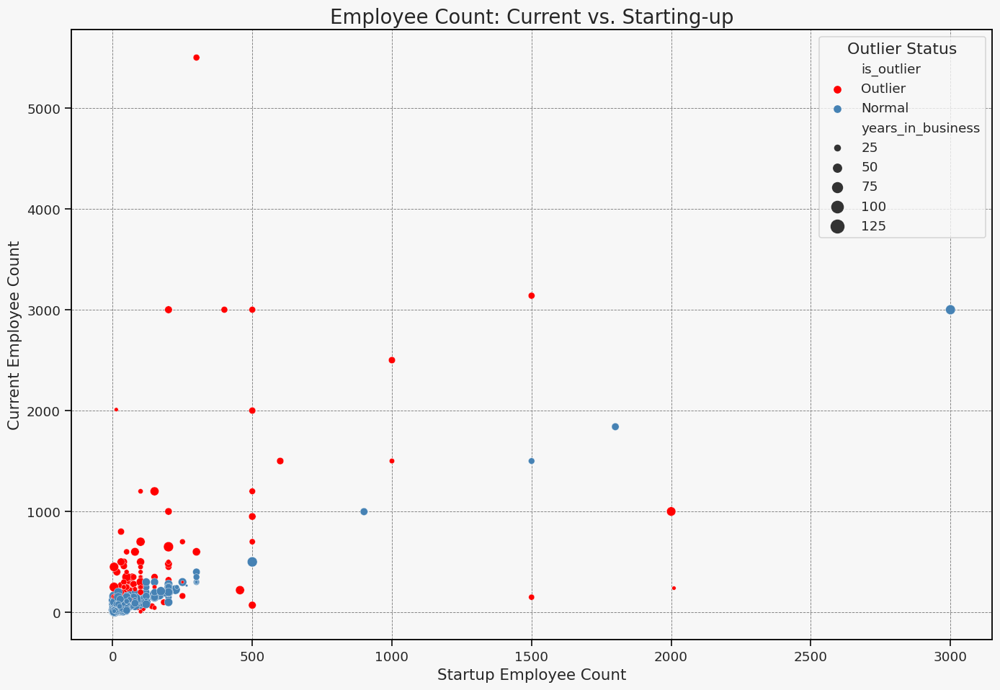

In [438]:
# Plot the scatterplot
plt.figure(figsize=(15, 10))
sns.scatterplot(
    data=df1,
    x='b6', y='a6c',
    size='years_in_business',
    hue='is_outlier',  # Color by outlier flag
    palette={'Outlier': 'red', 'Normal': 'steelblue'},
    sizes=(1, 150) ,
    legend='brief'
)

plt.title('Employee Count: Current vs. Starting-up', fontsize=18)
plt.xlabel("Startup Employee Count")
plt.ylabel("Current Employee Count")
plt.legend(title="Outlier Status", loc='upper right')
plt.show()

In [439]:
df1= df1.drop(columns=['is_outlier'])

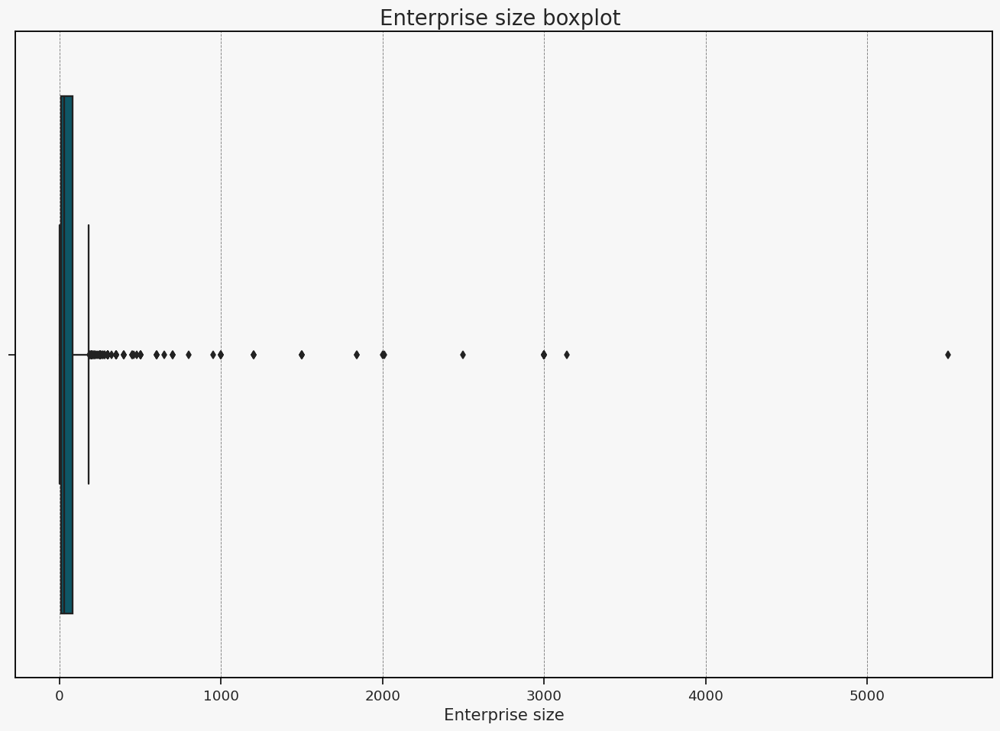

In [440]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='a6c')
plt.title('Enterprise size boxplot ', fontsize=18)
plt.xlabel("Enterprise size")
plt.show()

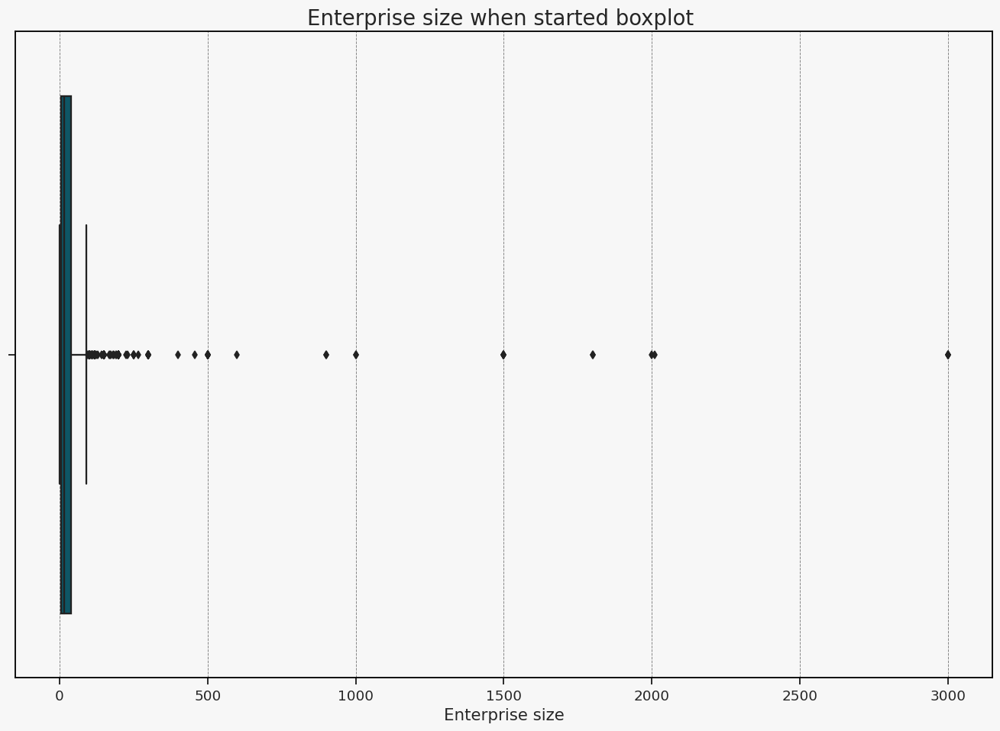

In [441]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='b6')
plt.title('Enterprise size when started boxplot ', fontsize=18)
plt.xlabel("Enterprise size")
plt.show()

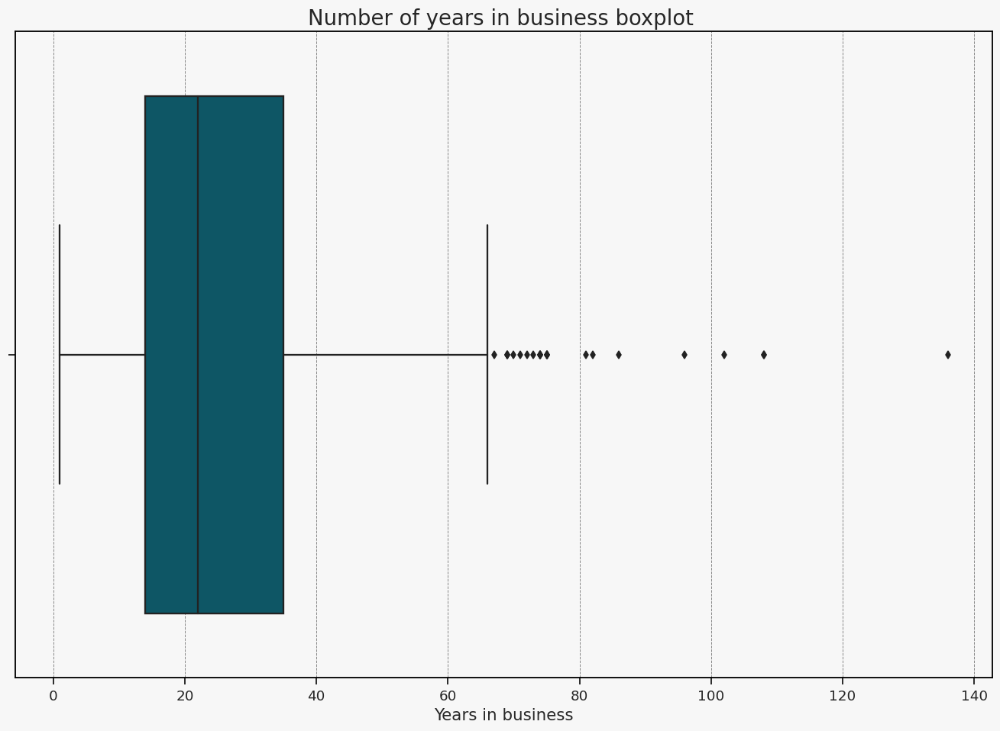

In [442]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='years_in_business')
plt.title('Number of years in business boxplot ', fontsize=18)
plt.xlabel("Years in business")
plt.show()

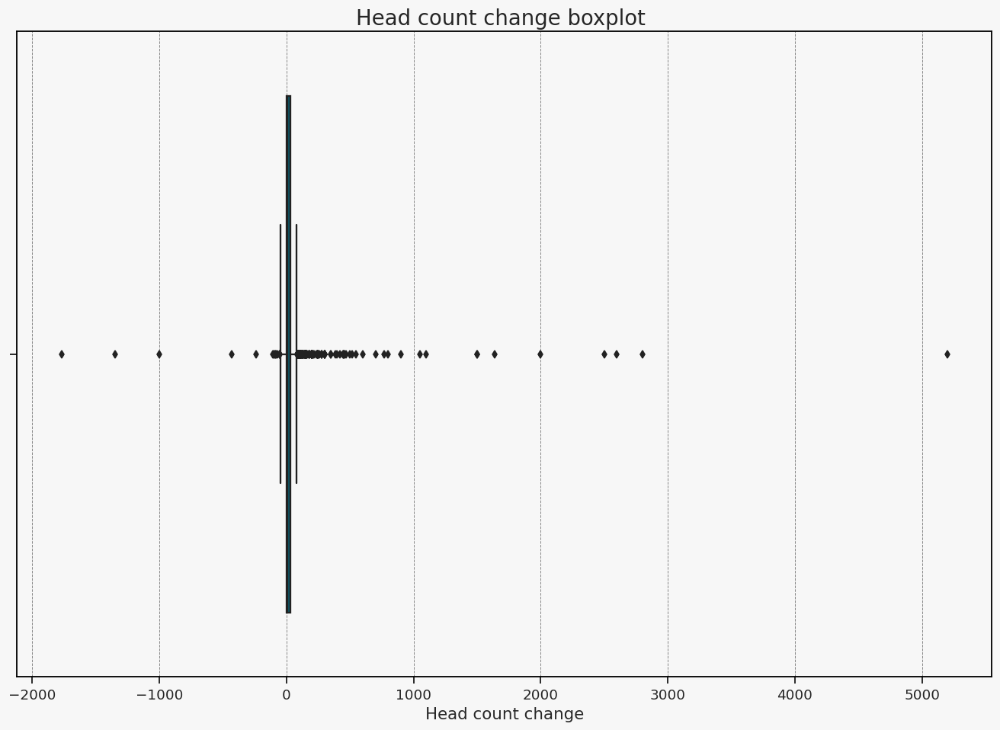

In [443]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='Head_count_change')
plt.title('Head count change boxplot ', fontsize=18)
plt.xlabel("Head count change")
plt.show()

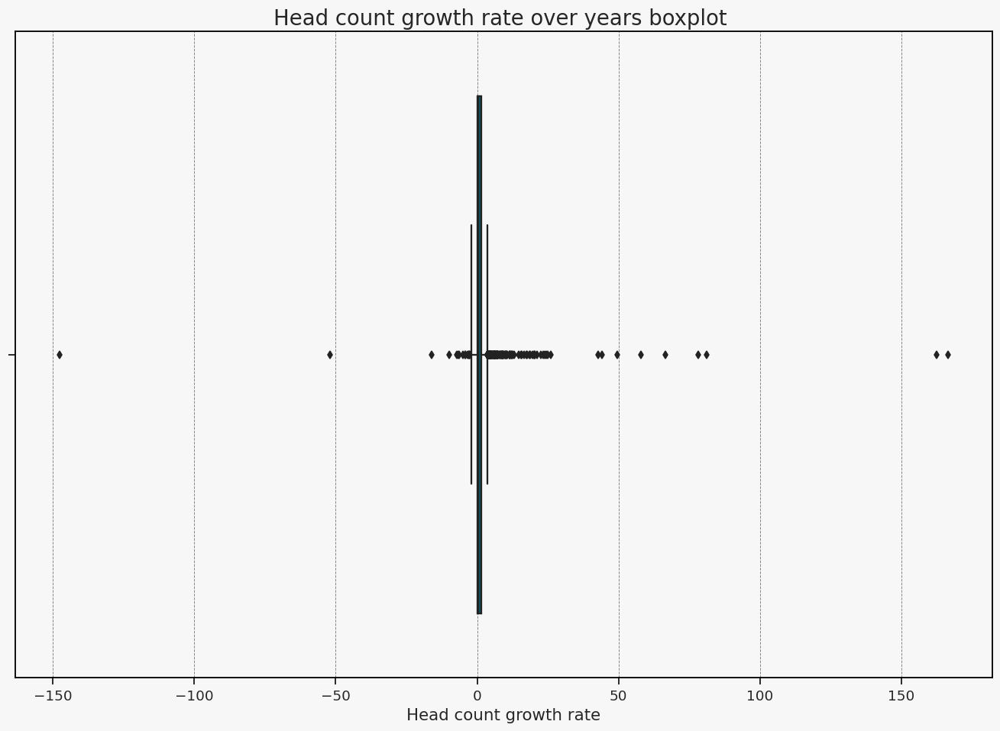

In [444]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='head_count_growth_over_years')
plt.title('Head count growth rate over years boxplot ', fontsize=18)
plt.xlabel("Head count growth rate")
plt.show()

In [445]:
#head count median when started up
df1['b6'].median()

15.0

In [446]:
# Create 4 categories of companies based on years in business
df1['business_age_group'] = pd.cut(
    df1['years_in_business'],
    bins=[0, 5, 10, 20, df1['years_in_business'].max()],
    labels=['Startup (≤5)', 'Young (6–10)', 'Mature (11–20)', 'Established (>20)'],
    include_lowest=True
)

In [447]:
df1['business_age_group'].value_counts(normalize=True, dropna=False)*100

business_age_group
Established (>20)    55.923077
Mature (11–20)       30.230769
Young (6–10)         10.461538
Startup (≤5)          3.384615
Name: proportion, dtype: float64

In [448]:
df1['size_shrink']= df1.apply(
    lambda row: int(
        row['Head_count_change']<0
    ), axis=1
)

In [449]:
df1[['size_shrink', 'Head_count_change']].head()

,size_shrink,Head_count_change
0,1,-70
1,0,20
2,0,0
3,0,27
4,0,55


In [450]:
df1['size_shrink'].value_counts(normalize=True, dropna=False)*100

size_shrink
0    92.923077
1     7.076923
Name: proportion, dtype: float64

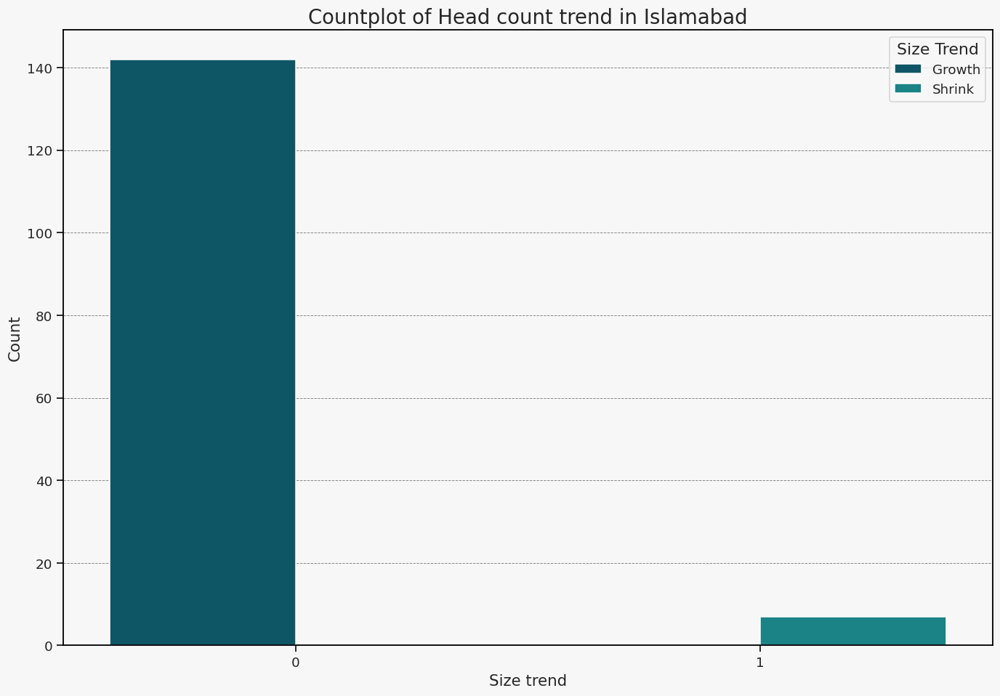

Islamabad : 
 size_shrink
0    95.302013
1     4.697987
Name: proportion, dtype: float64


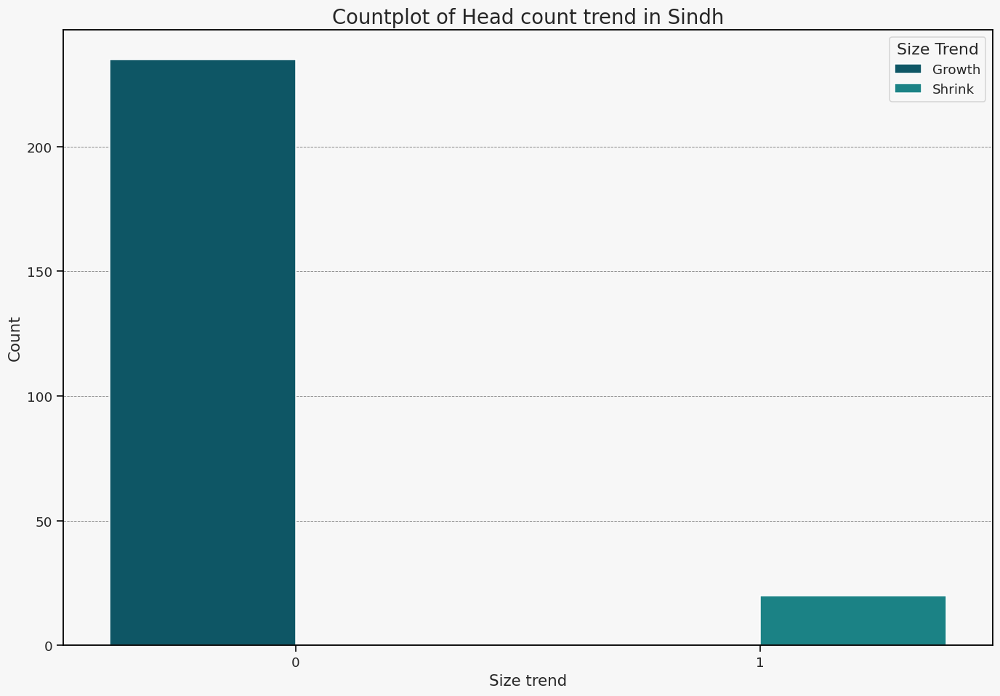

Sindh : 
 size_shrink
0    92.156863
1     7.843137
Name: proportion, dtype: float64


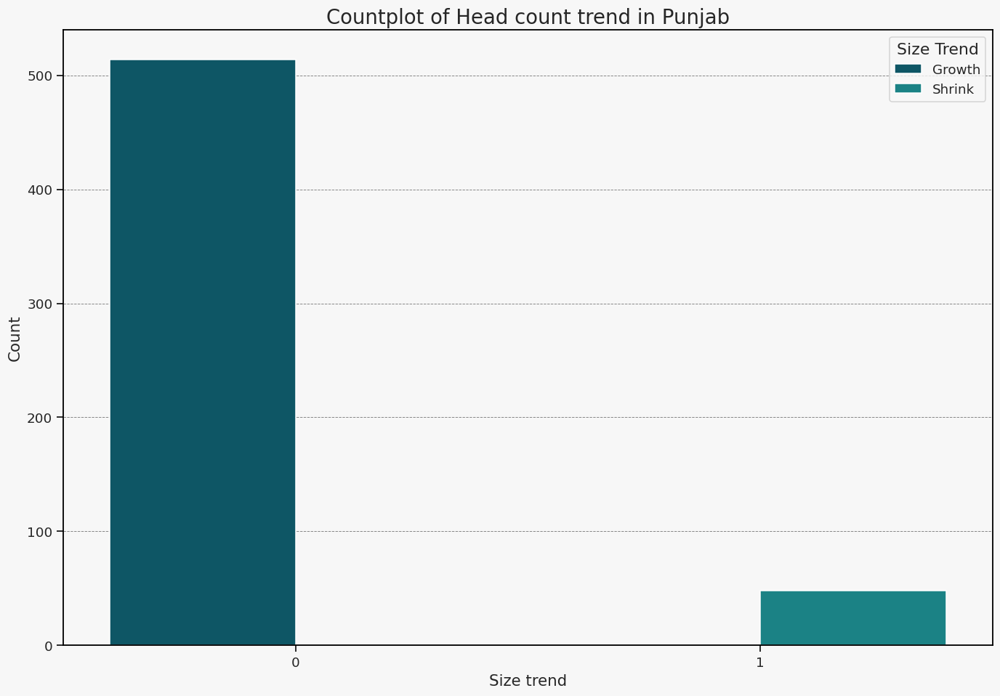

Punjab : 
 size_shrink
0    91.459075
1     8.540925
Name: proportion, dtype: float64


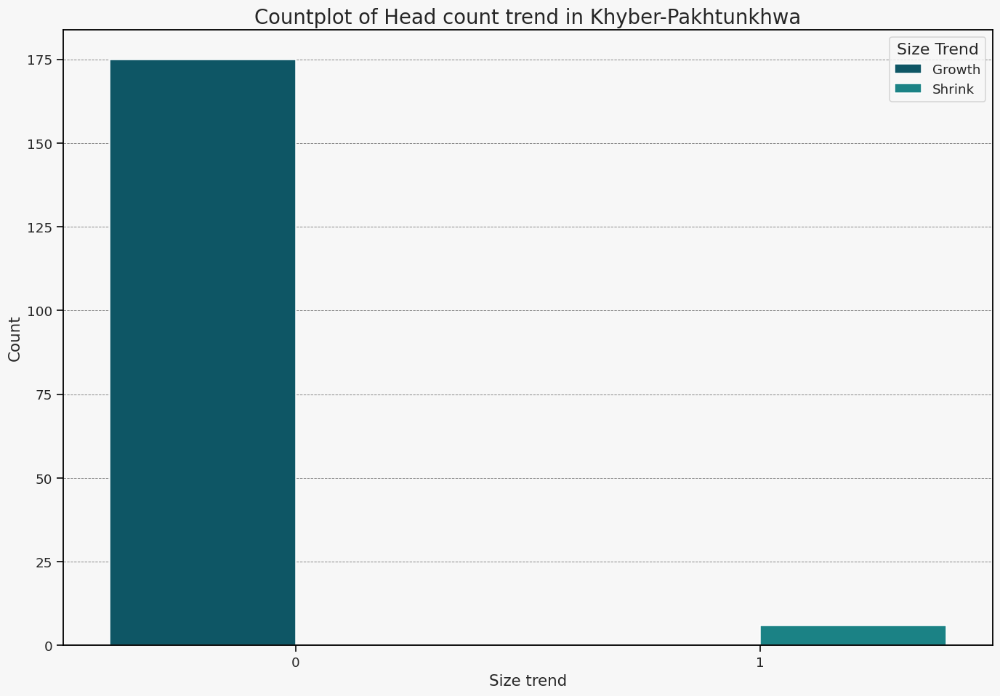

Khyber-Pakhtunkhwa : 
 size_shrink
0    96.685083
1     3.314917
Name: proportion, dtype: float64


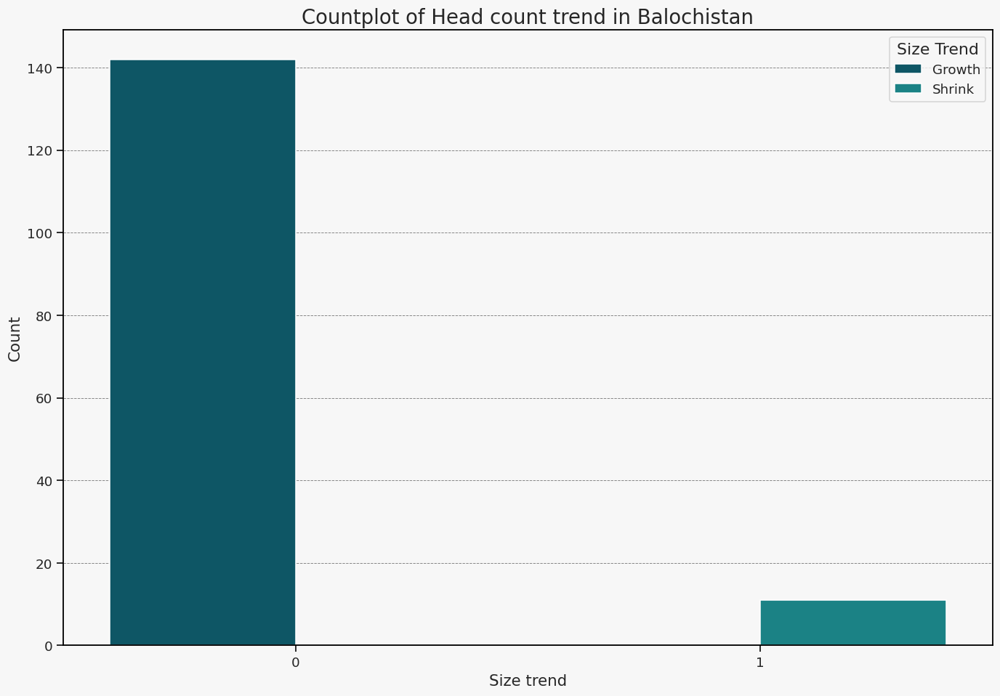

Balochistan : 
 size_shrink
0    92.810458
1     7.189542
Name: proportion, dtype: float64


In [451]:
regions = df1["a3a"].unique()
for region in regions:
    subset = df1[df1["a3a"]== region]
    plt.figure(figsize=(15,10))
    sns.countplot(subset,x='size_shrink',hue='size_shrink')
    plt.title('Countplot of Head count trend in '+ region,fontsize=18)
    plt.ylabel("Count")
    plt.xlabel("Size trend")
    handles, labels = plt.gca().get_legend_handles_labels()
    new_labels = ["Growth", "Shrink"]
    plt.legend(title="Size Trend", handles=handles, labels=new_labels)
    plt.show()
    print(region,': \n',subset["size_shrink"].value_counts(normalize=True)*100)

**What we can conclude:**
* 7% of enterprises shrinked

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Sales</h2>

    * d2 - In Last Fiscal Year, What Were This Establishment's Total Annual Sales? (d2)
    * n3 - What were the establishment's sales 3 years ago? (n3)

In [452]:
df1[['d2','n3']].describe()

,d2,n3
count,1300.0,1300.0
unique,274.0,307.0
top,30000000.0,40000000.0
freq,44.0,35.0


In [453]:
df1[['d2','n3']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   d2      1300 non-null   category
 1   n3      1300 non-null   category
dtypes: category(2)
memory usage: 25.9 KB


In [454]:
df1[(df1['n3']== 'Establishment was not in business in Fiscal Year') & (2022 - df1['b5']>3 )].head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,a4a,a6a,a2,panel,a4b_v4,a0,a3a,a6c,a6b,a14d,a14m,a14y,a14h,a14min,a1,a1a,a1c,competition_select,tax_select,vat_applicable,a7,a7a,a7b,a11,a7c,a9,a20y,a20m,a20d,b1,b3,b3a,b2a,b2b,b2c,b2d,b4,b4a,b5,b6,b6b,b7,b7a,b8,c3,c4,c5,c31,c32,c6,c7,c8a,c8b,c9a,c9b,c10,c11,PK1,PK2,PK3,PK4,PK5,c12,c13,c14,c33,c34,c34b,c15,c152,c16,c162,c17,c172,c35a,c35b,c22b,c36,c37,c38,c39,c40a,c40b,c41a,c41b,c42,c30a,d1a1a,d1a6a,d1a6b,d1a6c,d1a3,d2,d2a1,n3,d3a,d3b,d3c,d32,d4,d4a,d4b,d5a,PK6,PK7,d33a,d33b,d34,d35,d36a,d36b,d37,d8,d10,d11,PK8,d12a,d12b,d13,d39,d14a,d14b,d14,d15a,d40a,d40b,d41,PK9,d30a,d30b,o1,o2,o3a,o3b,r1,r2,r3,r4,r5,r6,r7,r8,r9,r10,r11,e1,e2b,e31a,e31b,e6,PK10,PK11a,PK11b,PK11c,PK11d,PK11e,PK12,PK13,PK14,PK15,e11,e32,e33,e34,e35,e30,h1,h2,PK16,h5,PK17,PK18,PK19,PK20,PK21,PK22,PK23,PK24a,PK24b,PK24c,PK24d,PK24e,PK24f,PK24g,PK24h,PK24i,PK24j,PK24k,h8,h9,PK25,f1,f2,PK26a,PK26b,g6a,g1a,g2,g3,g4,g31,g32,g33,g5a,g5b,g30a,ge3,ge3a,ge7,ge8d,i1,i2a,i2b,i3,i4a,i4b,i30,PK27,k3a,k3bc,k3e,k3f,k3hd,k4,n5a,n5b,k5a,k5a1,k5i,k5i1,k5bc,k5bc1,k5e,k5e1,k5f,k5f1,k5hdj,k5hdj1,k4b,n5c,n5d,k6,k7,k82,k9,k10,k11,k13,k14a,k14b,k14c,k14d,k14e,k15a,k15b,k15c,PK28,PK29,k15d,k162,k17,PKk17,k20a1,k31,k32,k21,k33,k34,k35,k36,k37,k38,k39,k40,k30,h7a,j31,PK30a,PK30b,PK30c,j2,PK31a,PK31b,PK32,j3,j4,j5,j32,j33,j34,j35a,j35b,j36,j37,j38,j39,j40,j6a,j6,j41,j42,j43,j7a,j7b,j10,j11,j12,j13,j14,j15,j30a,j30b,j30c,j30e,j30f,h30,j30_taxrate_pos,j30_taxadmin_pos,j30_permit_pos,j30_instability_pos,j30_corruption_pos,j30_courts_pos,PK33,PK34,l1,l2,l3a,l3b,l4a1,l4a2,l4b,l5a,l5b,l5,l9b,l9b1,l10,l11a,l11a1,l11b,l11b1,l12a,l12a1,l31,l32,l33,l34,l35,l36,l1a,l6,l6a,l8,l37,l38,l39,l40,l41,l30a,l30b,SARl31,m1a,m1a_finance_pos,m1a_land_pos,m1a_permit_pos,m1a_corruption_pos,m1a_courts_pos,m1a_crime_pos,m1a_trade_pos,m1a_electricity_pos,m1a_workforce_pos,m1a_labor_pos,m1a_instability_pos,m1a_informal_pos,m1a_taxadmin_pos,m1a_taxrate_pos,m1a_transport_pos,n2a,n2a2,n2b,n2k,n2l,n2e,n2i,n2a1,n2b1,n2e1,n7a,n11,n12,a15d,a15m,a15y,a15h,a15min,a16,a17,a18,a19h,a19m,a13,a3b,a3c,a3,d1a2_v4,d1a2,a4b,ic1,stratificationregioncode,stratificationsizecode,stratificationsectorcode,stratificationpanelcode,wstrict,wmedian,wweak,strata,finance_obstacle,payment_avg_rec_days,rec_epayment,mak_epayment,internet_usage,mobile_money_usage,access_formal_financing,has_account,years_in_business,Head_count_change,head_count_growth_rate,head_count_growth_over_years,business_age_group,size_shrink
511,Hotels & Restaurants,Small,Balochistan,Panel,Accommodation,Other services,Balochistan,5,Small,24,11,2022,16,31,90,Urdu,Establishment,1,1,Yes,No,1.0,NaN,NaN,NaN,NaN,2022,6,30,Sole proprietorship,100,Yes,100,0,0,0,No,NaN,1998,5,1998,25,No,No,No,NaN,NaN,NaN,1454,Yes,90.0,1.0,30.0,NaN,None,Yes,Don't know (spontaneous),Don't know (spontaneous),No,NaN,NaN,Reduce electricity consumption,No,NaN,NaN,NaN,6000,Gallons,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,Yes,No,NaN,NaN,No,NaN,NaN,NaN,NaN,With no difficulty at all,Moderate obstacle,Hotel,40.0,10000.0,Square Feet,100,357000000.0,0.0,Establishment was not in business in Fiscal Year,100,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,Other,100,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No obstacle,No obstacle,No,NaN,Does not apply (spontaneous),Does not apply (spontaneous),We fixed it and took action to make sure it di...,Yes,3-9 production performance indicators,Yes,Combination of short term and long term produc...,Targets were not achieved,Only senior managers,No,NaN,Non-managers are normally not promoted,Within 6 months of identifying non-manager und...,Local â main product sold mostly in same mun...,Too many to count,Below 50%,NaN,No,"Small or medium private firms, excluding this ...",No,No,No,No,No,Yes,Informal firms,DONâT KNOW (SPONTANEOUS),Regulatory restrictions on the maximum number ...,Yes,No change,No,No,NaN,Minor obstacle,No,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Yes,NaN,NaN,Availability of land slot,Personal knowle

In [455]:
df1['d2'] = df1['d2'].astype(float)

In [456]:
# Step 1: Convert to string
df1['n3'] = df1['n3'].astype(str)

# Step 2: Replace "Don't know (spontaneous)" with NaN or a numeric value
df1['n3'] = df1['n3'].replace(["Establishment was not in business in Fiscal Year","Don't know (spontaneous)"], np.nan)

# Step 3: Now safely convert to float
df1['n3'] = df1['n3'].astype(float)

In [457]:
df1['n3'] = df1['n3'].replace(np.nan, df1['n3'].median())

In [458]:

df1['sales_diff_rate'] = np.where(
    (df1['n3'] != 0) & (~df1['n3'].isna()),
    (df1['d2'] - df1['n3']) / df1['n3'],
    np.nan  
)

In [459]:
# Define outliers using IQR on rate_of_growth
q1 = df1['sales_diff_rate'].quantile(0.25)
q3 = df1['sales_diff_rate'].quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Create outlier flag
df1['is_outlier'] = df1['sales_diff_rate'].apply(
    lambda x: 'Outlier' if x < lower_bound or x > upper_bound else 'Normal'
)

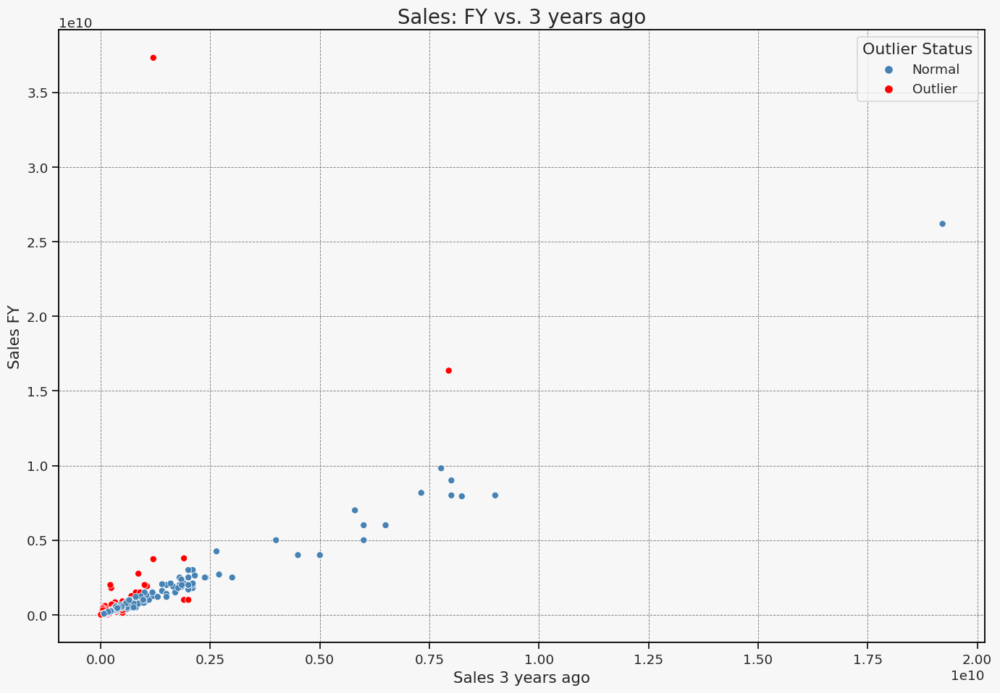

In [460]:
# Plot the scatterplot
plt.figure(figsize=(15, 10))
sns.scatterplot(
    data=df1,
    x='n3', y='d2',
    hue='is_outlier',  # Color by outlier flag
    palette={'Outlier': 'red', 'Normal': 'steelblue'},
    legend='brief'
)

plt.title('Sales: FY vs. 3 years ago', fontsize=18)
plt.xlabel("Sales 3 years ago")
plt.ylabel("Sales FY")
plt.legend(title="Outlier Status", loc='upper right')
plt.show()

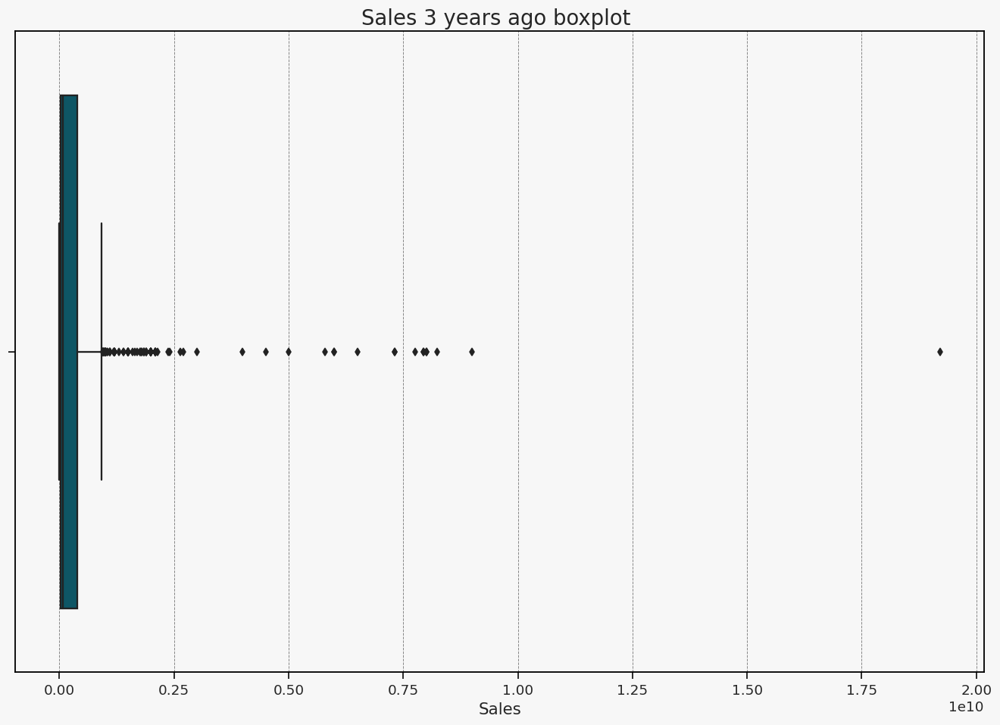

In [461]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='n3')
plt.title('Sales 3 years ago boxplot ', fontsize=18)
plt.xlabel("Sales")
plt.show()

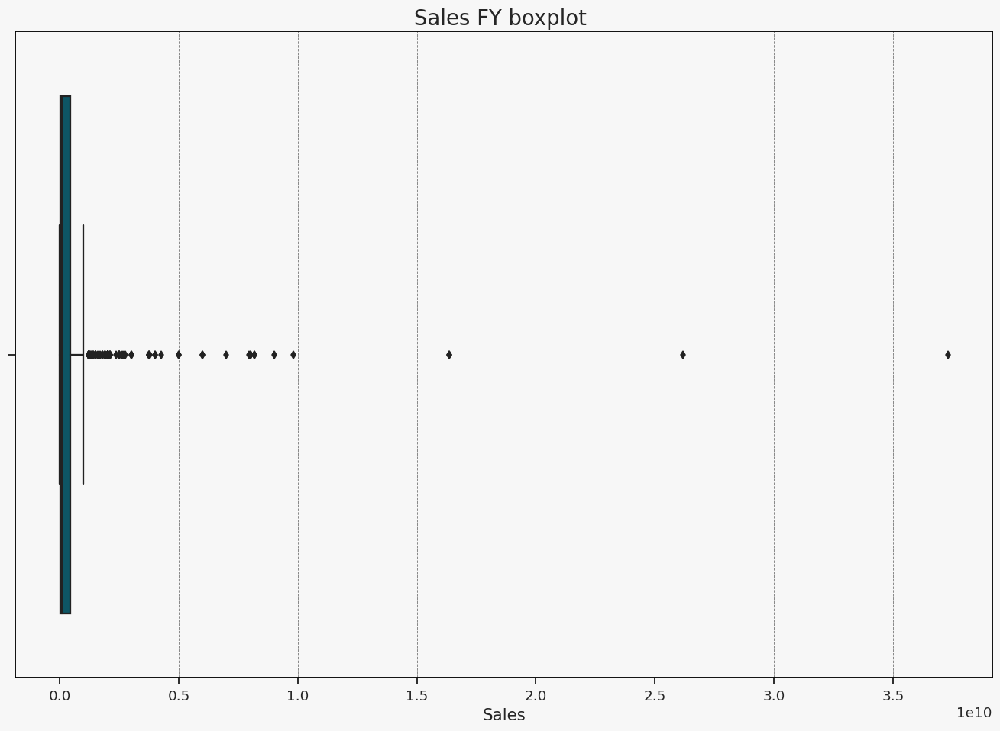

In [462]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='d2')
plt.title('Sales FY boxplot ', fontsize=18)
plt.xlabel("Sales")
plt.show()

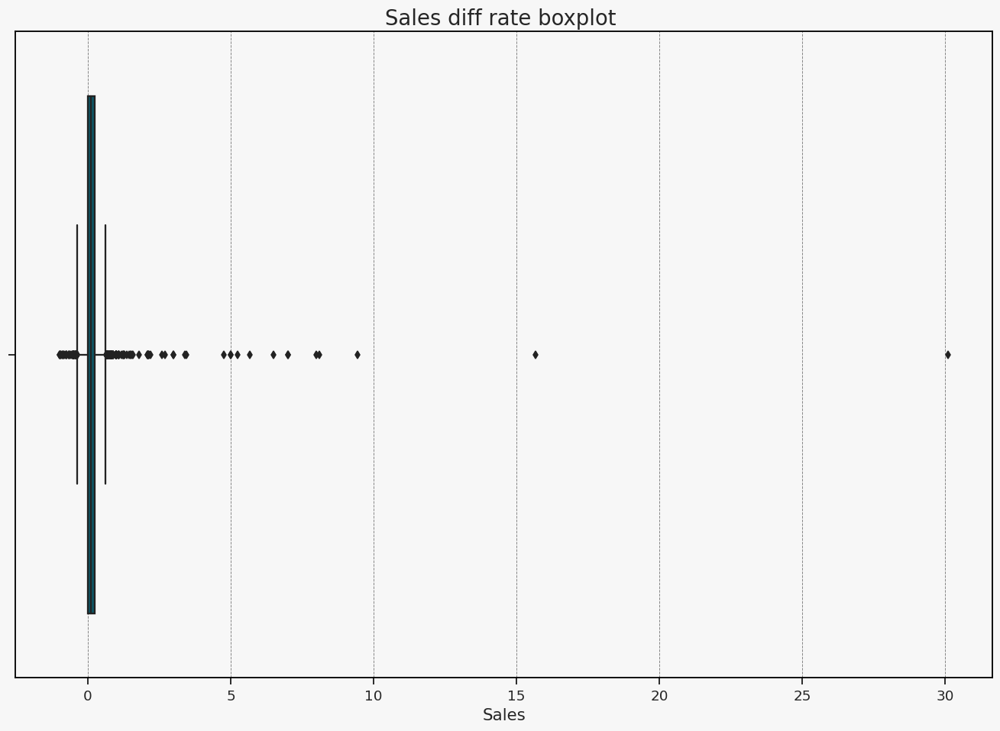

In [463]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.boxplot(data=df1, x='sales_diff_rate')
plt.title('Sales diff rate boxplot ', fontsize=18)
plt.xlabel("Sales")
plt.show()

In [464]:
df1['sales_trend'] = np.select(
    [
        df1['sales_diff_rate'] > 0,
        df1['sales_diff_rate'] < 0,
        df1['sales_diff_rate'] == 0
    ],
    [
        'Growth',
        'Decline',
        'Flat'
    ],
    default=np.nan  
)

In [465]:
df1['sales_trend'].value_counts(normalize=True)*100

sales_trend
Growth     69.769231
Decline    24.615385
Flat        5.615385
Name: proportion, dtype: float64

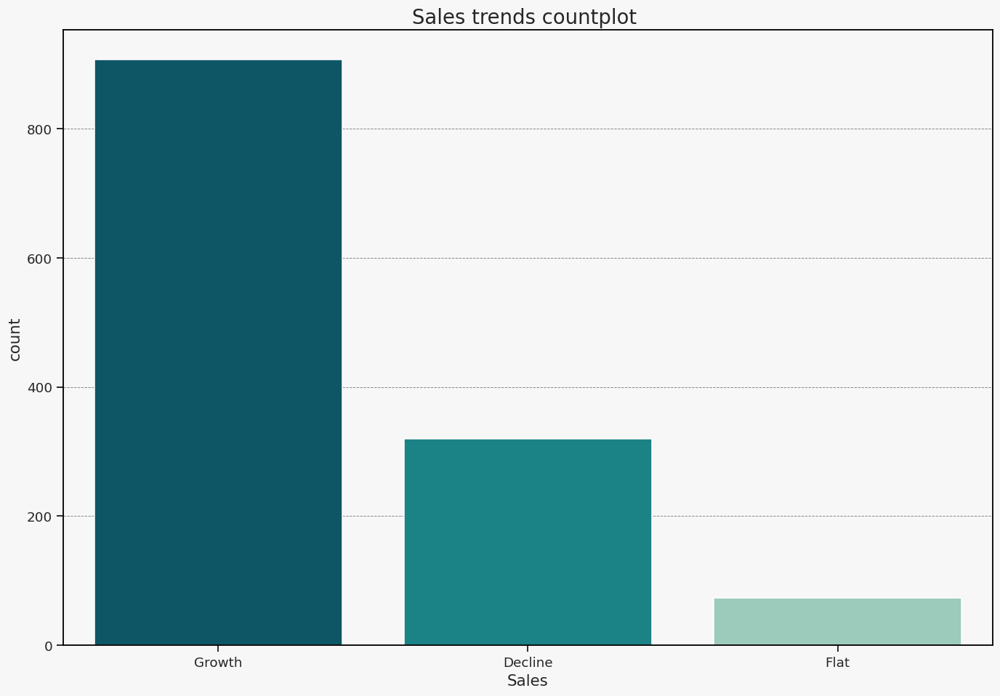

In [466]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, x='sales_trend')
plt.title('Sales trends countplot ', fontsize=18)
plt.xlabel("Sales")
plt.show()

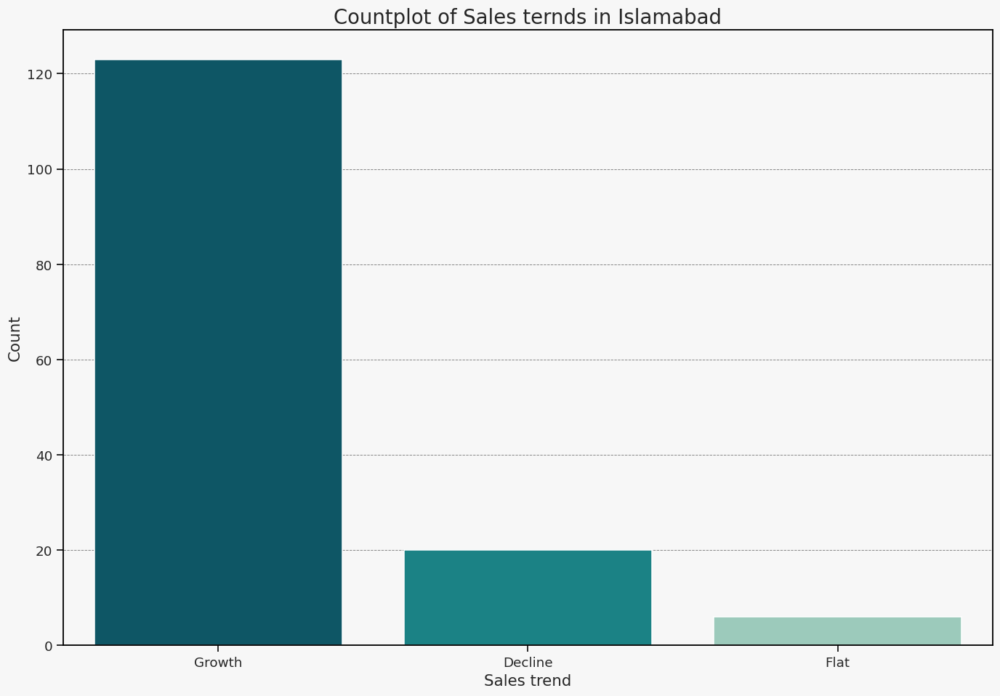

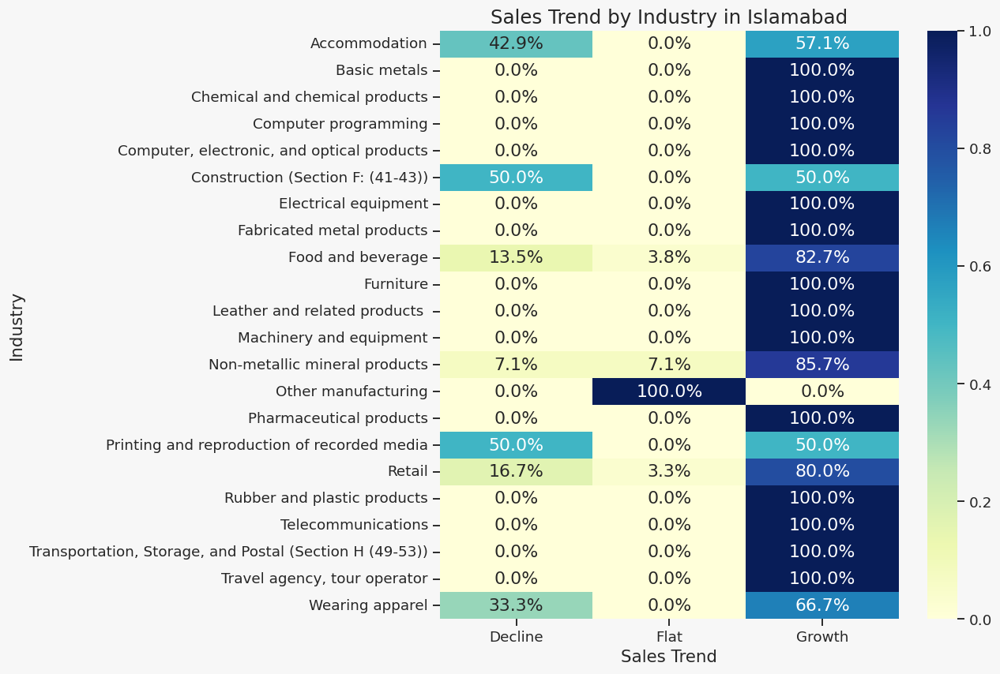

Islamabad : 
 sales_trend
Growth     82.550336
Decline    13.422819
Flat        4.026846
Name: proportion, dtype: float64


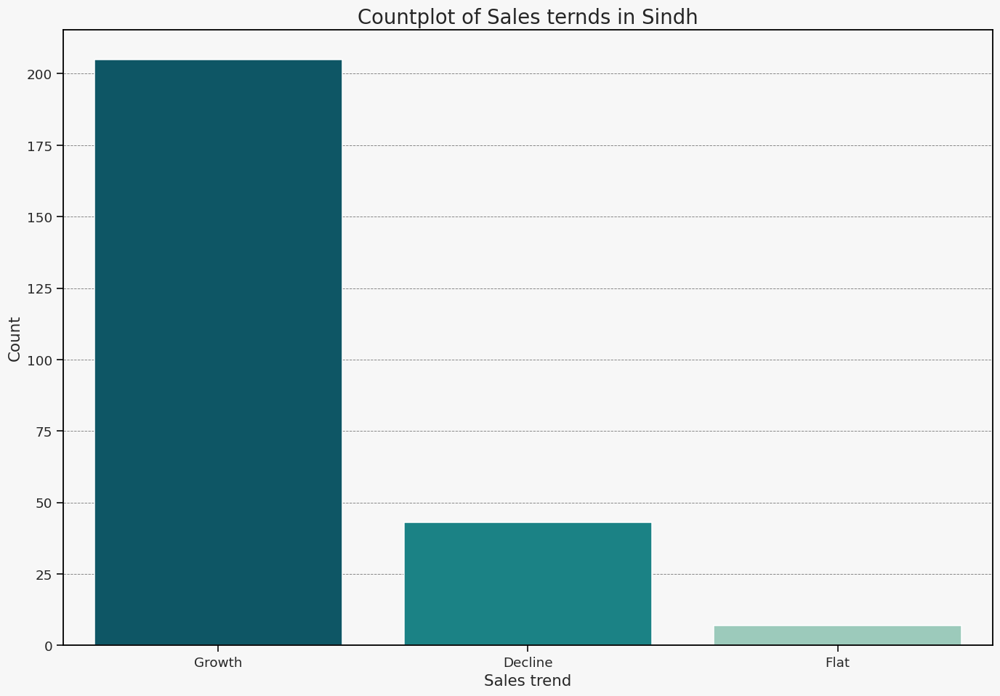

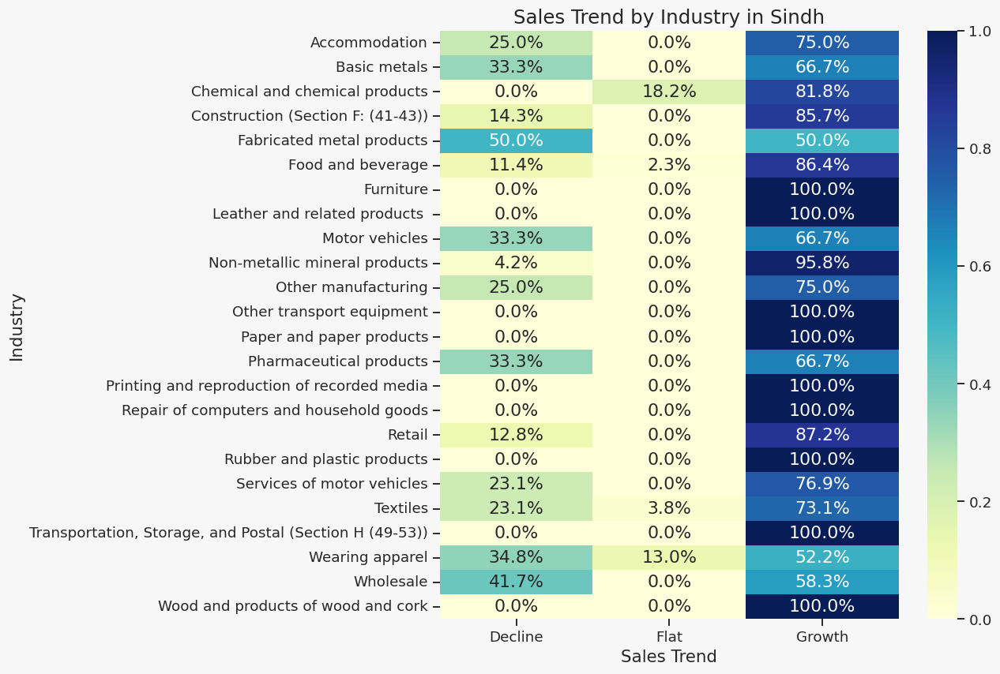

Sindh : 
 sales_trend
Growth     80.392157
Decline    16.862745
Flat        2.745098
Name: proportion, dtype: float64


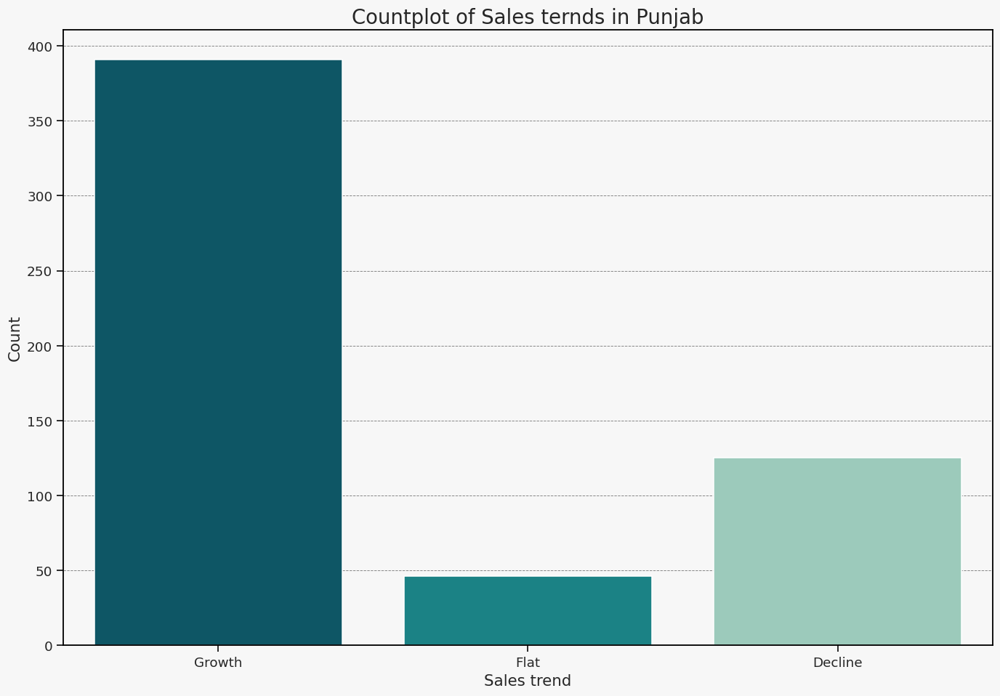

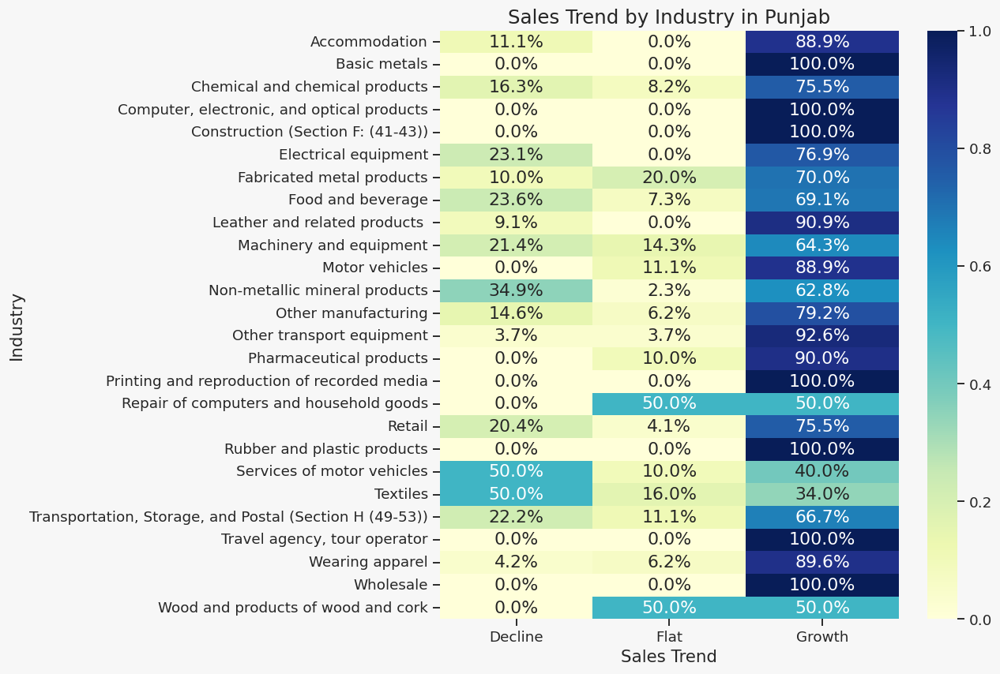

Punjab : 
 sales_trend
Growth     69.572954
Decline    22.241993
Flat        8.185053
Name: proportion, dtype: float64


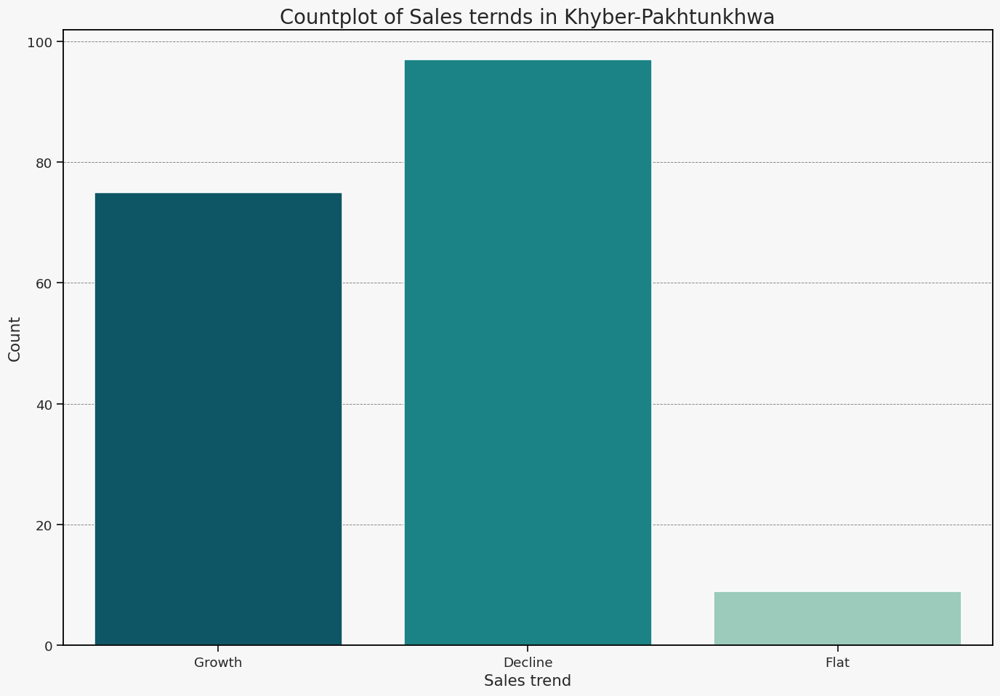

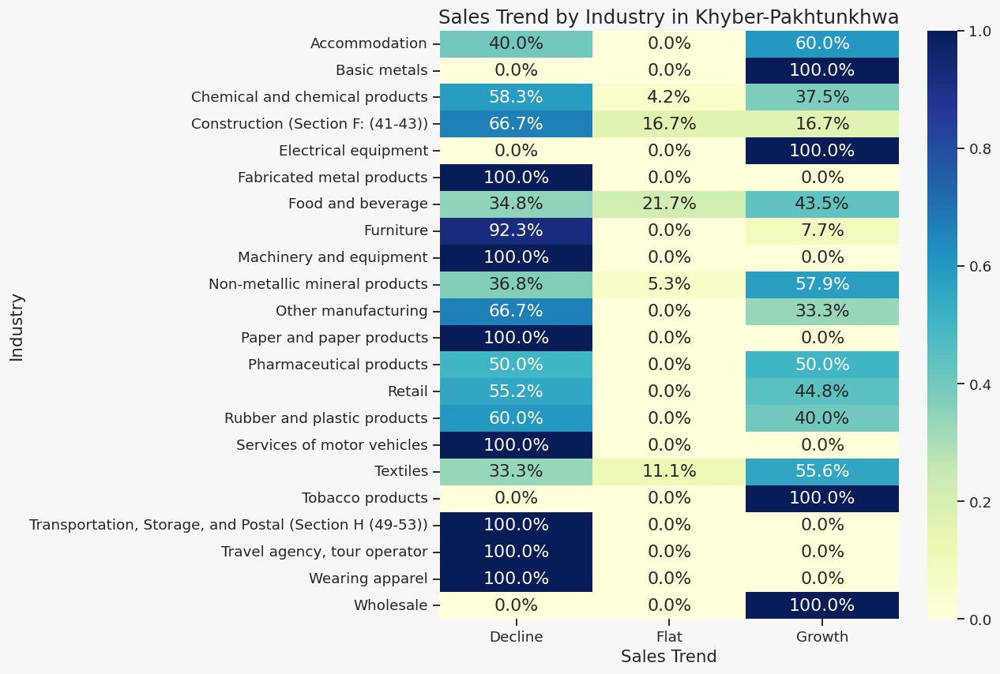

Khyber-Pakhtunkhwa : 
 sales_trend
Decline    53.591160
Growth     41.436464
Flat        4.972376
Name: proportion, dtype: float64


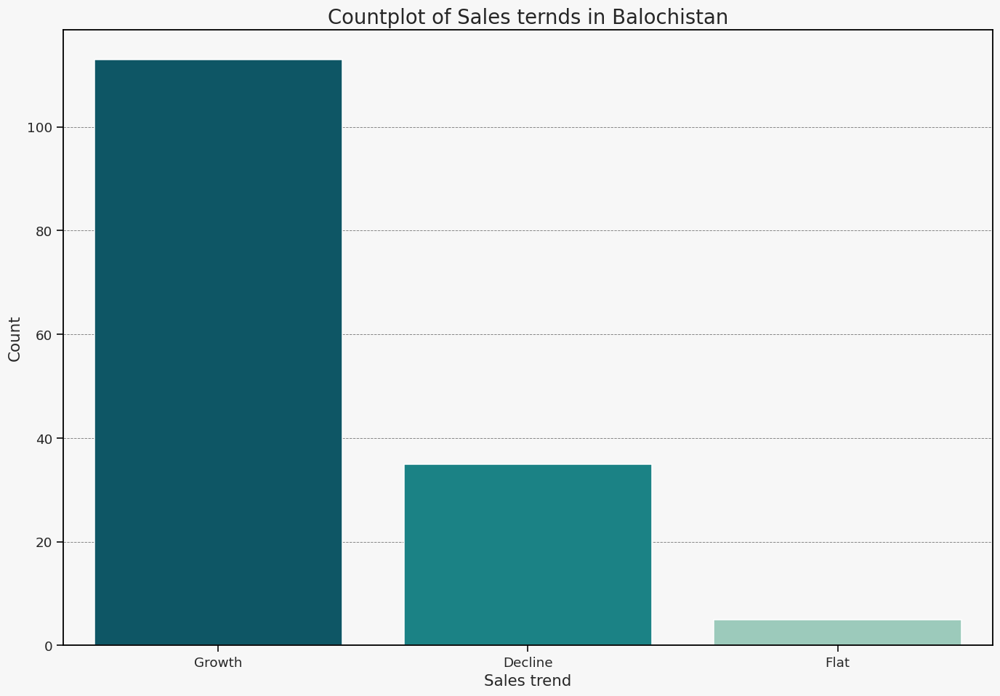

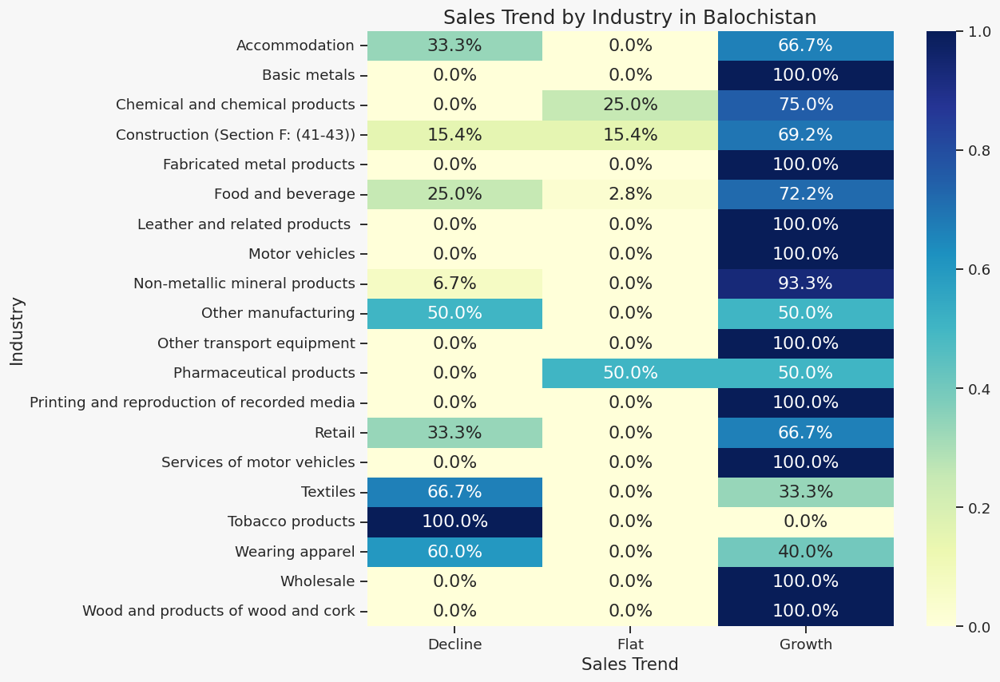

Balochistan : 
 sales_trend
Growth     73.856209
Decline    22.875817
Flat        3.267974
Name: proportion, dtype: float64


In [467]:
regions = df1["a3a"].unique()
for region in regions:
    subset = df1[df1["a3a"]== region]
    plt.figure(figsize=(15,10))
    sns.countplot(subset,x='sales_trend')
    plt.title('Countplot of Sales ternds in '+ region,fontsize=18)
    plt.ylabel("Count")
    plt.xlabel("Sales trend")
    plt.show()

    
    # Cross-tab: count of companies per (industry, sales_trend)
    heatmap_data = pd.crosstab(subset['a4b_v4'], subset['sales_trend'])
    # Normalize each row to sum to 1 (percent distribution by industry)
    heatmap_data_normalized = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)
    plt.figure(figsize=(12, 8))
    sns.heatmap(heatmap_data_normalized, annot=True, fmt=".1%", cmap="YlGnBu")

    plt.title("Sales Trend by Industry in "+ region, fontsize=16)
    plt.xlabel("Sales Trend")
    plt.ylabel("Industry")
    plt.tight_layout()
    plt.show()
    print(region,': \n',subset["sales_trend"].value_counts(normalize=True)*100)

In [468]:
df1['FY_sales_M']=df1['d2']/1000000

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Ownership and managment</h2>

* b1 - Legal Status of The Firm;
* b3a - Is the largest owner also the top manager;
* b7a - Is The Top Manager Female?

In [469]:
df1[['b1','b3a','b7a']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   b1      1300 non-null   category
 1   b3a     1300 non-null   category
 2   b7a     1300 non-null   category
dtypes: category(3)
memory usage: 4.4 KB


In [470]:
df1[['b1','b3a','b7a']].describe()

,b1,b3a,b7a
count,1300,1300,1300
unique,6,3,3
top,Sole proprietorship,Yes,No
freq,812,737,1252


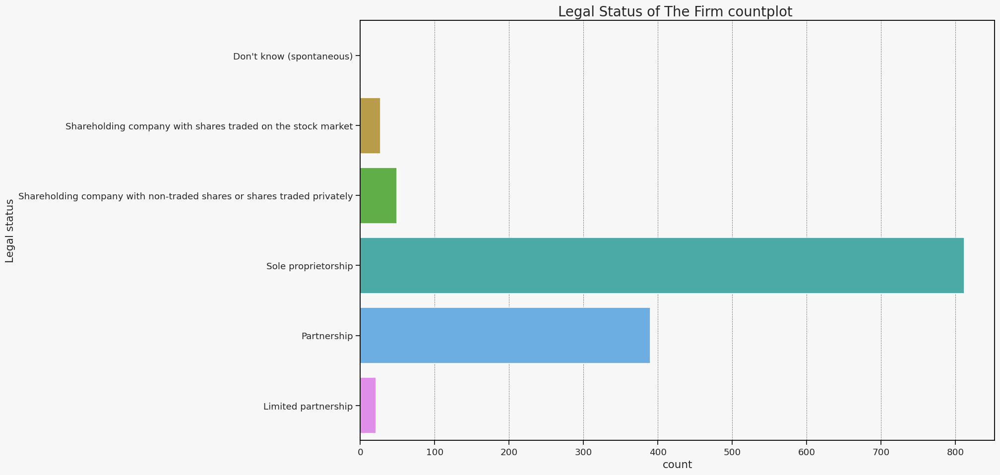

In [471]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, y='b1')
plt.title('Legal Status of The Firm countplot ', fontsize=18)
plt.ylabel("Legal status")
plt.show()

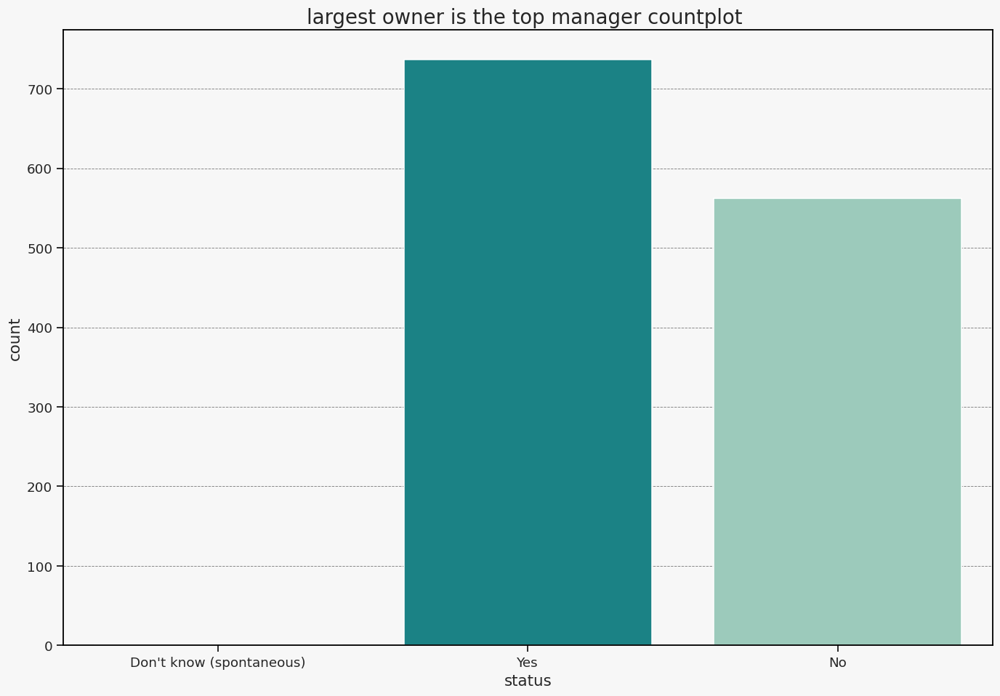

In [472]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, x='b3a')
plt.title('largest owner is the top manager countplot ', fontsize=18)
plt.xlabel("status")
plt.show()

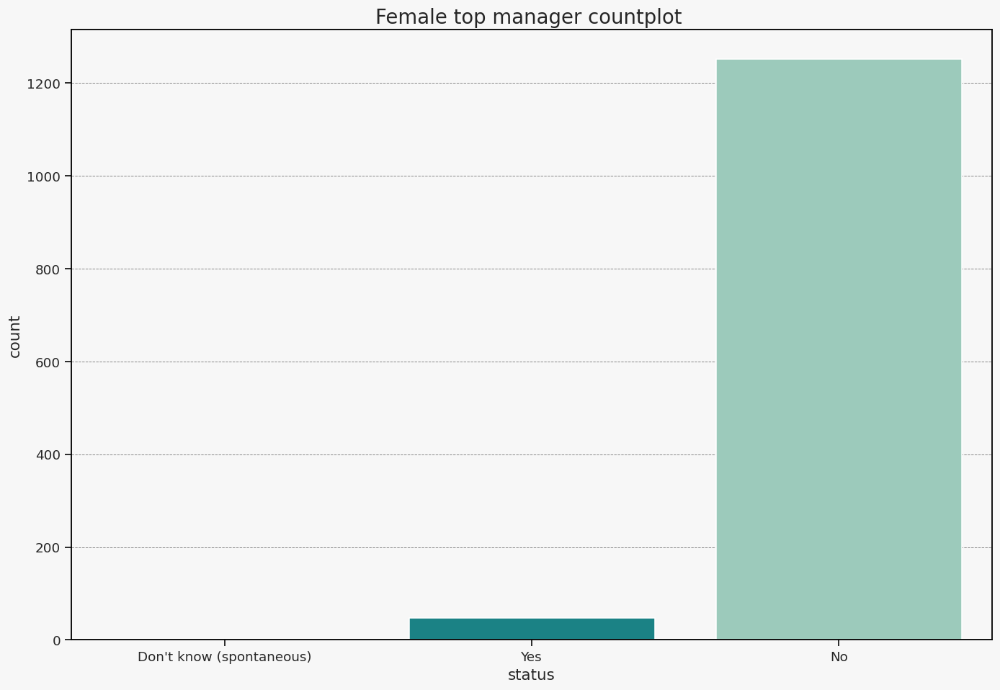

In [473]:
# Plot the boxplot
plt.figure(figsize=(15, 10))
sns.countplot(data=df1, x='b7a')
plt.title('Female top manager countplot ', fontsize=18)
plt.xlabel("status")
plt.show()

<h1 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Clustering</h1>



In [474]:
df1_clustering_0 = df1.copy()

In [475]:
df1_clustering_0.shape

(1300, 434)

In [476]:
#drop columns with null > 30%
print("Dropped columns")
for col in columns_with_nulls_list:
    if (df1_clustering_0[col].isna().sum() /len(df1[col])) > 0.3:
        df1_clustering_0 = df1_clustering_0.drop(labels=col,axis=1)
        print(col,' : count =', df1[col].isna().sum(),'; percent = ',round(100* (df1[col].isna().sum()/len(df1[col])),2))

Dropped columns
a7b  : count = 1017 ; percent =  78.23
a11  : count = 1123 ; percent =  86.38
a7c  : count = 1123 ; percent =  86.38
a9  : count = 1194 ; percent =  91.85
b4a  : count = 1229 ; percent =  94.54
c4  : count = 1260 ; percent =  96.92
c5  : count = 1260 ; percent =  96.92
c31  : count = 1260 ; percent =  96.92
c7  : count = 706 ; percent =  54.31
c8a  : count = 712 ; percent =  54.77
c8b  : count = 712 ; percent =  54.77
c9a  : count = 861 ; percent =  66.23
c9b  : count = 1145 ; percent =  88.08
c11  : count = 722 ; percent =  55.54
PK1  : count = 722 ; percent =  55.54
PK3  : count = 1241 ; percent =  95.46
PK4  : count = 1241 ; percent =  95.46
c13  : count = 1283 ; percent =  98.69
c14  : count = 1283 ; percent =  98.69
c33  : count = 1283 ; percent =  98.69
c15  : count = 453 ; percent =  34.85
c152  : count = 847 ; percent =  65.15
c16  : count = 1278 ; percent =  98.31
c162  : count = 1280 ; percent =  98.46
c17  : count = 1282 ; percent =  98.62
c172  : count = 128

In [477]:
df1_clustering_0.shape

(1300, 250)

In [478]:
df1_kmodes = df1_clustering_0.copy()


In [479]:

df1_kmodes = df1_kmodes.rename(columns={'m1a':'biggest_obstcale','b7a':'top_mngr_female','b3a':'largest_owner_top_mngr','b1':'legal_status','a6b':'actual_size_category','a7':'multi_establishment','a3':'size_of_locality','a3a':'region','a3b':'capital_city','a3c':'business_city','a4b_v4':'industry','a4a':'global_industry', 'k30':'finance_obstcale_level','PKk17':'main_reason_no_loan_application'})

In [480]:
df1_kmodes_no_finacnce_challenge = df1_kmodes[df1_kmodes['finance_obstacle'] ==0 ]
df1_kmodes_no_finacnce_challenge.shape

(441, 250)

In [481]:
df1_kmodes_no_finacnce_challenge['cluster']=0
financial_profile_1 = df1_kmodes_no_finacnce_challenge.groupby('cluster').agg({
    'access_formal_financing': lambda x: (x == 1).mean() * 100,
    'main_reason_no_loan_application': lambda x: x.mode().iloc[0],
    'finance_obstcale_level' : lambda x: x.mode().iloc[0],
    'has_account': lambda x: (x == 1).mean() * 100,
    'mak_epayment': lambda x: (x == 1).mean() * 100,
    'rec_epayment': lambda x: (x == 1).mean() * 100,
    'internet_usage': lambda x: (x == 1).mean() * 100,
    'mobile_money_usage': lambda x: (x == 1).mean() * 100,
    'sales_diff_rate': 'median',
    'FY_sales_M': 'median',
    'sales_trend': lambda x: x.mode().iloc[0],
    'head_count_growth_rate': 'median',
    'years_in_business': 'median',
    'legal_status': lambda x: x.mode().iloc[0],
    'largest_owner_top_mngr': lambda x: (x == 'Yes').mean() * 100,
    'size_of_locality': lambda x: x.mode().iloc[0],
    'global_industry': lambda x: x.mode().iloc[0],
    'industry': lambda x: x.mode().iloc[0]

}).reset_index()

# Show the summarized table
print("\n📋 Financial & Growth Profile Table by Cluster:")
print(financial_profile_1)


📋 Financial & Growth Profile Table by Cluster:
   cluster  access_formal_financing  \
0        0                35.147392   

                     main_reason_no_loan_application finance_obstcale_level  \
0  No need for a loan - establishment had enough ...            No obstacle   

   has_account  mak_epayment  rec_epayment  internet_usage  \
0    91.156463     29.251701     44.671202       74.376417   

   mobile_money_usage  sales_diff_rate  FY_sales_M sales_trend  \
0           20.181406         0.126543        85.0      Growth   

   head_count_growth_rate  years_in_business         legal_status  \
0                     1.0               20.0  Sole proprietorship   

   largest_owner_top_mngr                     size_of_locality  \
0               60.090703  City with population over 1 million   

  global_industry           industry  
0            Food  Food and beverage  


/tmp/ipykernel_31/1772594281.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1_kmodes_no_finacnce_challenge['cluster']=0


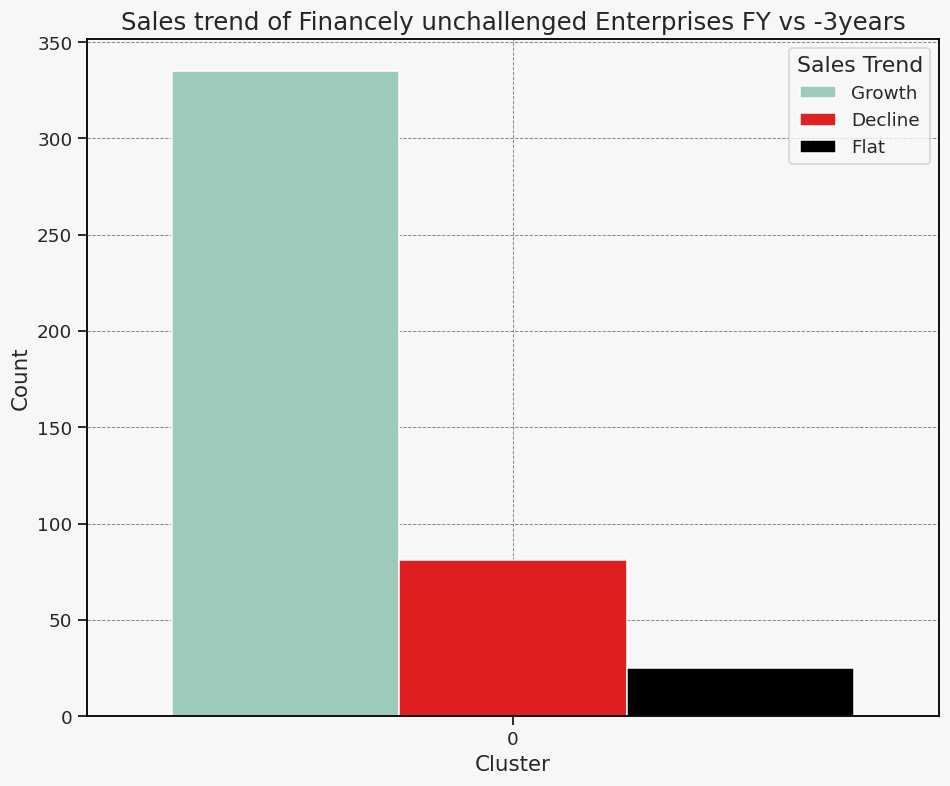

In [503]:

plt.figure(figsize=(10, 8))
sns.countplot(data=df1_kmodes_no_finacnce_challenge, x='cluster', hue= 'sales_trend',    palette={
        'Growth': '#94d2bd',
        'Flat': 'black',
        'Decline': 'red'
    })
plt.title('Sales trend of Financely unchallenged Enterprises FY vs -3years', fontsize=16)
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.grid(True)
plt.legend(title='Sales Trend', loc='upper right')
plt.show()

In [482]:
df1_kmodes = df1_kmodes[df1_kmodes['finance_obstacle'] ==1 ]
df1_kmodes.shape

(859, 250)

<h2 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Kmodes</h2>


### Feature selection

In [483]:
# Define your specific feature sets
feature_sets = {
    'Features 1': ['finance_obstcale_level', 'region', 'actual_size_category'],
    'Features 2': ['biggest_obstcale', 'finance_obstcale_level', 'region', 'industry', 'actual_size_category'],
    'Features 3': ['access_formal_financing', 'biggest_obstcale', 'finance_obstcale_level', 'region', 'industry', 'actual_size_category'],
    'Features 4': ['business_age_group', 'access_formal_financing', 'biggest_obstcale', 'finance_obstcale_level', 'region', 'industry', 'actual_size_category'],
    'Features 5': ['legal_status', 'business_age_group', 'access_formal_financing', 'biggest_obstcale', 'finance_obstcale_level', 'region', 'industry', 'actual_size_category'],
    'Features 16': ['top_mngr_female', 'largest_owner_top_mngr', 'legal_status', 'actual_size_category', 'multi_establishment', 'region', 'industry', 'sales_trend', 'access_formal_financing', 'business_age_group', 'has_account', 'finance_obstcale_level', 'rec_epayment', 'mak_epayment', 'size_shrink', 'finance_obstacle']
}



/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


   Feature Set   K    Cost  Previous Cost  Cost Drop %
0   Features 1   2   971.0            NaN          NaN
1   Features 1   3   833.0          971.0    14.212152
2   Features 1   4   727.0          833.0    12.725090
3   Features 1   5   647.0          727.0    11.004127
4   Features 1   6   568.0          647.0    12.210201
5   Features 1   7   497.0          568.0    12.500000
6   Features 1   8   489.0          497.0     1.609658
7   Features 1   9   453.0          489.0     7.361963
8   Features 1  10   436.0          453.0     3.752759
9   Features 2   2  2310.0            NaN          NaN
10  Features 2   3  2122.0         2310.0     8.138528
11  Features 2   4  2013.0         2122.0     5.136664
12  Features 2   5  1924.0         2013.0     4.421262
13  Features 2   6  1852.0         1924.0     3.742204
14  Features 2   7  1795.0         1852.0     3.077754


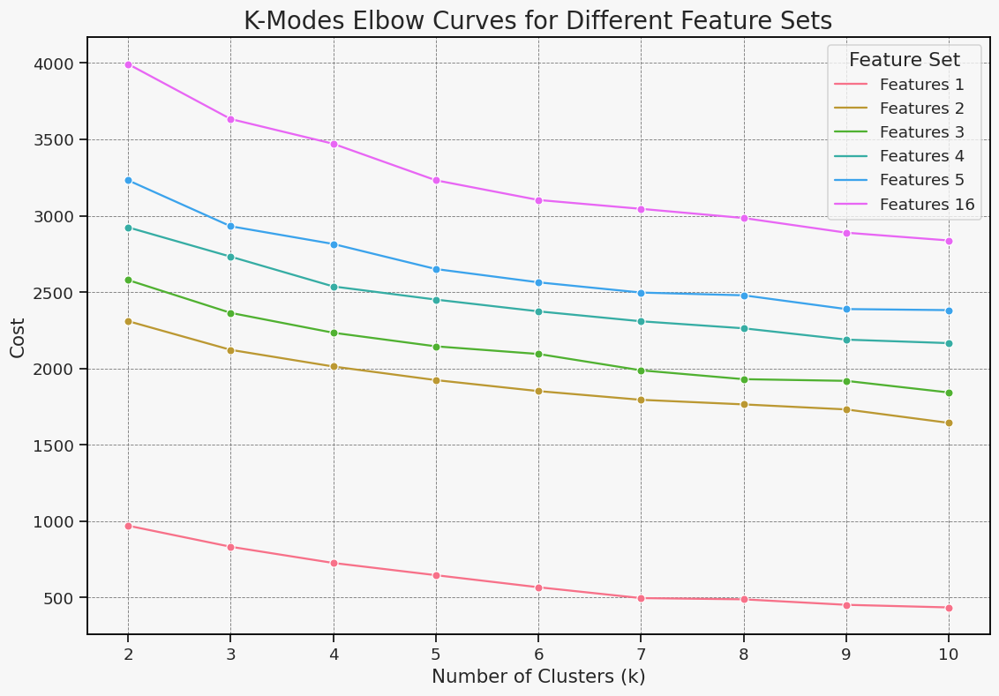

In [484]:


# Initialize results
results = []

# Loop over feature sets
for set_name, features in feature_sets.items():
    df_subset = df1_kmodes[features].dropna()

    cost_list = []
    k_values = range(2, 11)

    for k in k_values:
        km = KModes(n_clusters=k, init='Huang', n_init=10, verbose=0, random_state=42)
        km.fit(df_subset)
        cost_list.append(km.cost_)

    for i, k in enumerate(k_values):
        results.append({
            'Feature Set': set_name,
            'K': k,
            'Cost': cost_list[i]
        })

# Create a results dataframe
results_df = pd.DataFrame(results)

# Calculate cost drops
results_df['Previous Cost'] = results_df.groupby('Feature Set')['Cost'].shift(1)
results_df['Cost Drop %'] = ((results_df['Previous Cost'] - results_df['Cost']) / results_df['Previous Cost']) * 100

# Display full results
print(results_df.head(15))



plt.figure(figsize=(12, 8))
sns.lineplot(data=results_df, x='K', y='Cost', hue='Feature Set', marker='o')
plt.title('K-Modes Elbow Curves for Different Feature Sets')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Cost')
plt.grid(True)
plt.show()

### Model creation

In [485]:
selected_feature_set = feature_sets['Features 1']

In [486]:
df_kmodes_subset = df1_kmodes[selected_feature_set].dropna()

In [487]:
km = KModes(n_clusters=7, init='Huang',  n_init=10, verbose=0, random_state=42)
clusters = km.fit_predict(df_kmodes_subset)

### Enterprise Profiling

In [488]:
df1_kmodes['cluster'] = clusters

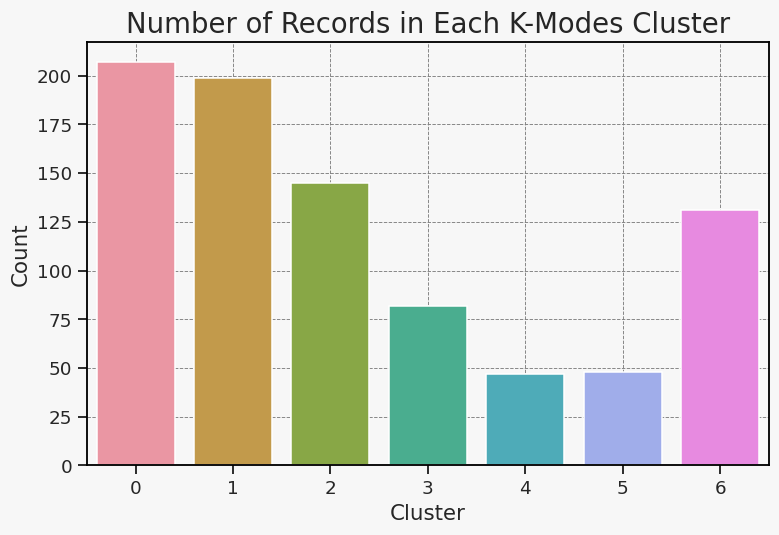

In [489]:

plt.figure(figsize=(8,5))
sns.countplot(x='cluster', data=df1_kmodes)
plt.title('Number of Records in Each K-Modes Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.grid(True)
plt.show()

In [490]:

# Create a summary dataframe
cluster_summary = pd.DataFrame()

# Loop over clusters
for cluster_num in sorted(df1_kmodes['cluster'].unique()):
    cluster_data = df1_kmodes[df1_kmodes['cluster'] == cluster_num]
    summary_row = {'cluster': cluster_num}
    
    for feature in feature_sets['Features 1']:
        # Find most frequent value (mode) for each feature in the cluster
        most_common = cluster_data[feature].mode()[0]
        summary_row[feature] = most_common
        
    cluster_summary = pd.concat([cluster_summary, pd.DataFrame([summary_row])], ignore_index=True)

# Reorder columns nicely
cluster_summary = cluster_summary[['cluster', 'region', 'actual_size_category', 'finance_obstcale_level']]




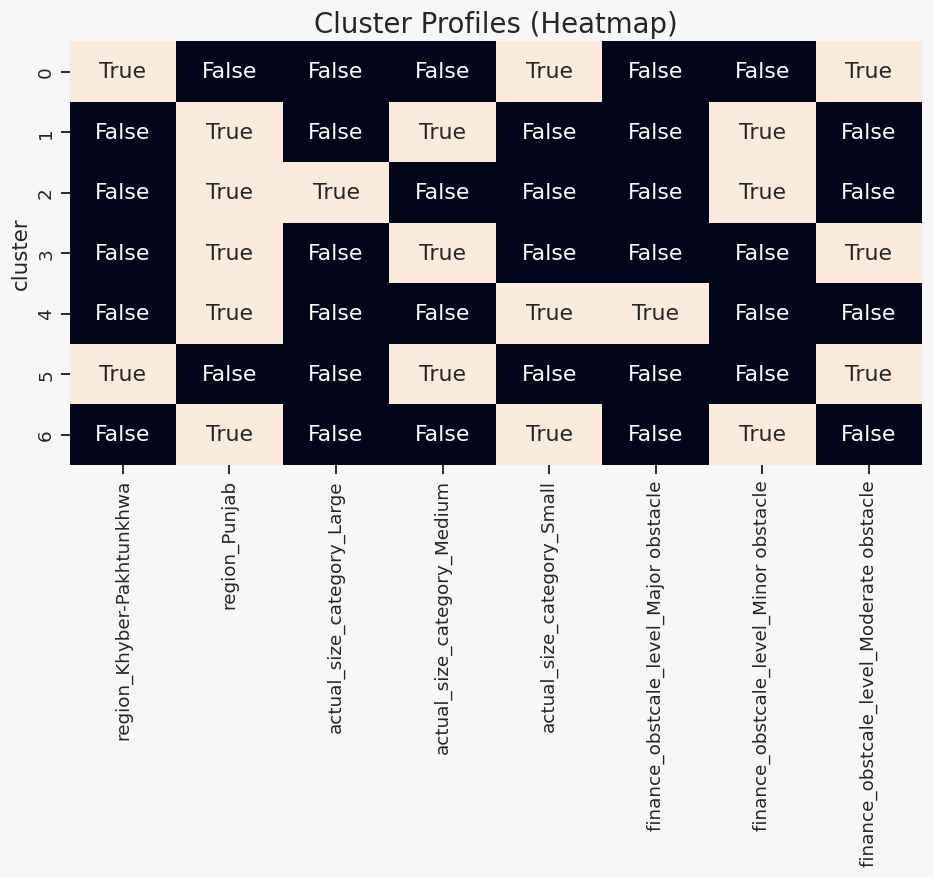

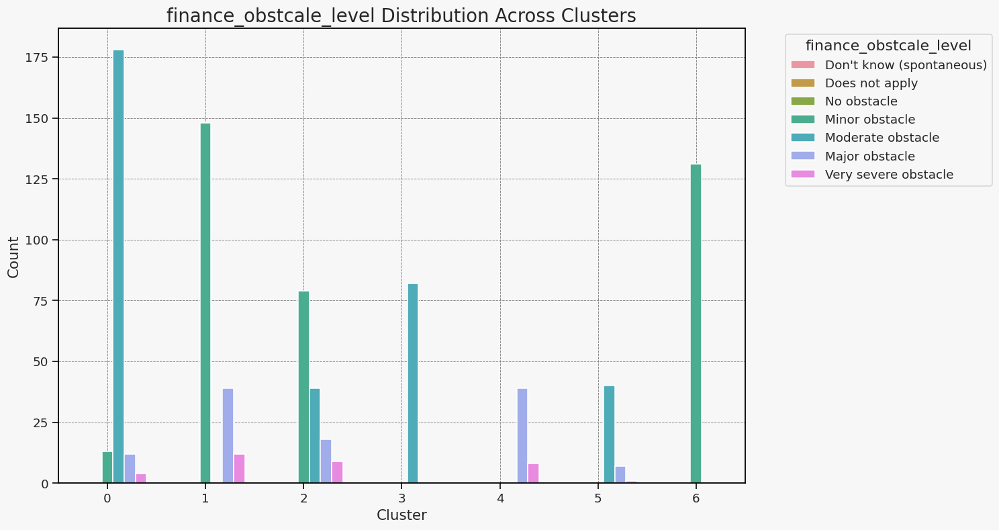

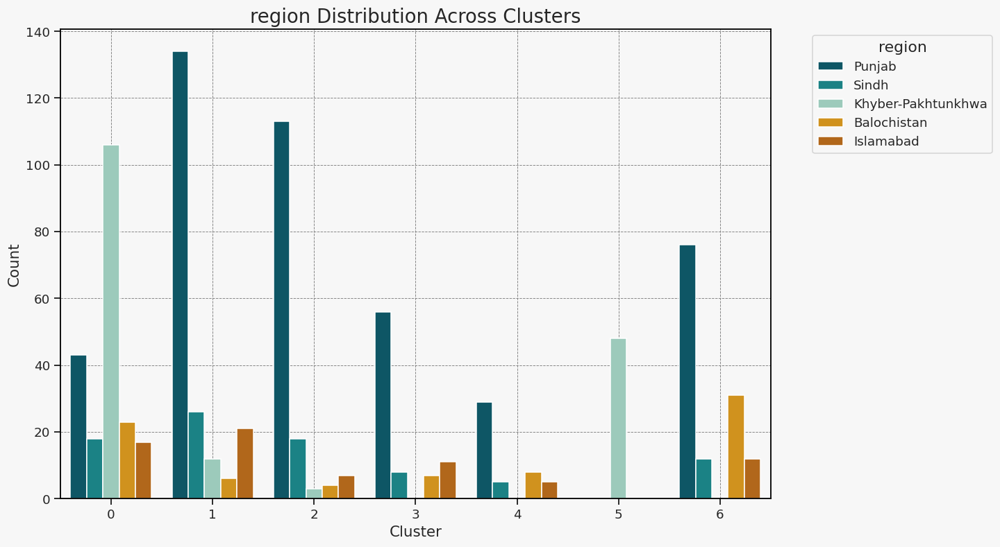

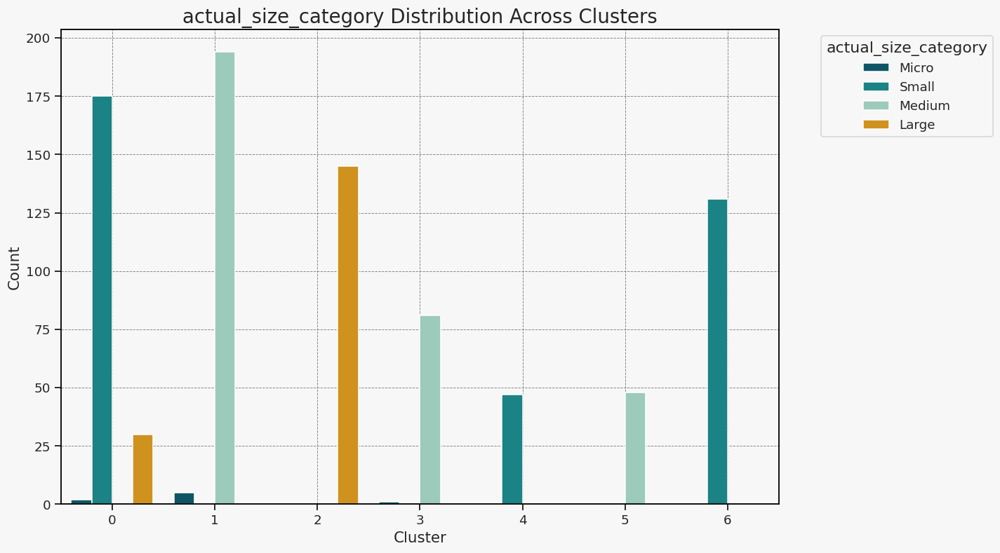


📝 Final Cluster Profiles:

🔵 Cluster 0:
• Region: Khyber-Pakhtunkhwa
• Size Category: Small
• Finance Obstacle Level: Moderate obstacle

🔵 Cluster 1:
• Region: Punjab
• Size Category: Medium
• Finance Obstacle Level: Minor obstacle

🔵 Cluster 2:
• Region: Punjab
• Size Category: Large
• Finance Obstacle Level: Minor obstacle

🔵 Cluster 3:
• Region: Punjab
• Size Category: Medium
• Finance Obstacle Level: Moderate obstacle

🔵 Cluster 4:
• Region: Punjab
• Size Category: Small
• Finance Obstacle Level: Major obstacle

🔵 Cluster 5:
• Region: Khyber-Pakhtunkhwa
• Size Category: Medium
• Finance Obstacle Level: Moderate obstacle

🔵 Cluster 6:
• Region: Punjab
• Size Category: Small
• Finance Obstacle Level: Minor obstacle


In [491]:

### 1. HEATMAP of Cluster Profiles
plt.figure(figsize=(10, 5))
sns.heatmap(pd.get_dummies(cluster_summary.set_index('cluster')), annot=True, fmt='', cbar=False)
plt.title('Cluster Profiles (Heatmap)')
plt.show()

### 2. BAR PLOTS for key features across clusters
features_to_plot = selected_feature_set

for feature in features_to_plot:
    plt.figure(figsize=(12, 8))
    sns.countplot(data=df1_kmodes, x='cluster', hue=feature)
    plt.title(f'{feature} Distribution Across Clusters')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    #plt.xticks(rotation=85)
    plt.legend(title=feature, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()

### 3. TEXT CARDS for each cluster
print("\n📝 Final Cluster Profiles:")

for idx, row in cluster_summary.iterrows():
    print(f"\n🔵 Cluster {row['cluster']}:")
    print(f"• Region: {row['region']}")
    print(f"• Size Category: {row['actual_size_category']}")
    print(f"• Finance Obstacle Level: {row['finance_obstcale_level']}")

**Head count profiling**

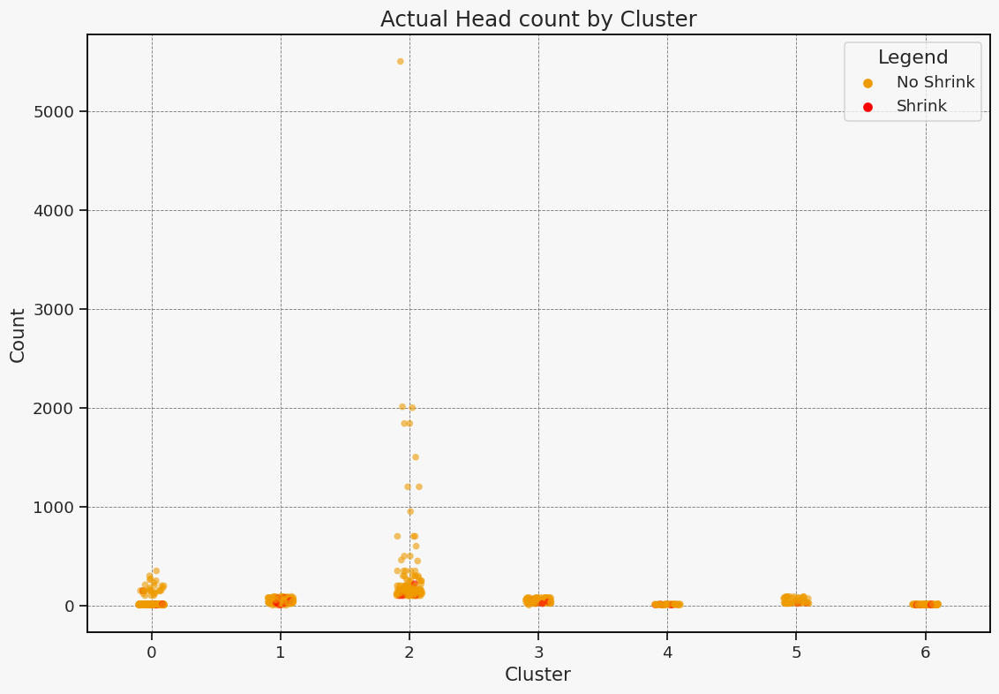

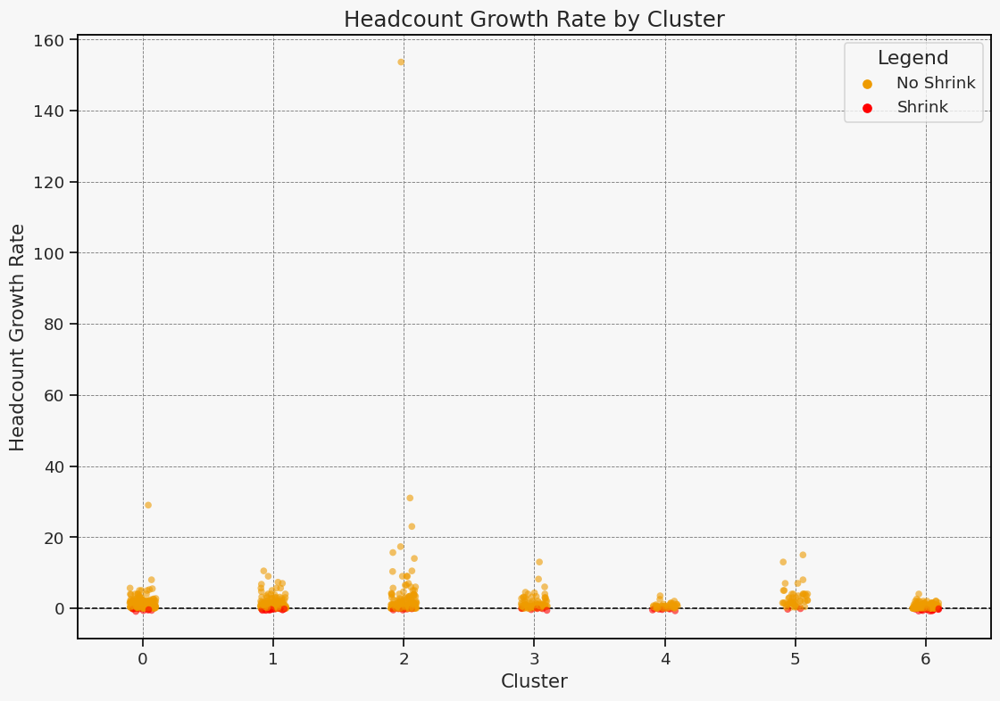

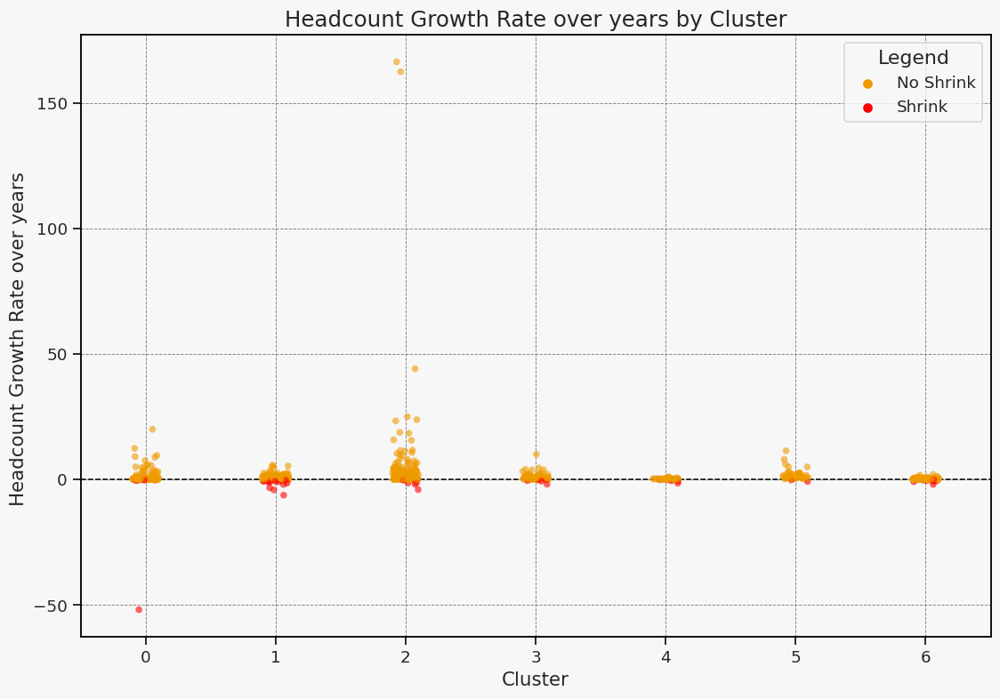

In [492]:
# Actual head count
plt.figure(figsize=(12, 8))
sns.stripplot(data=df1_kmodes,x='cluster', y='a6c',  hue= 'size_shrink',palette={1: 'red', 0: '#ee9b00'},dodge=False,alpha=0.6)
plt.title('Actual Head count by Cluster', fontsize=16)
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.grid(True)
handles, labels = plt.gca().get_legend_handles_labels()
new_labels = ['No Shrink', 'Shrink']
plt.legend(handles, new_labels, title='Legend', loc='upper right')
plt.show()

# Head count difference rate startup vs actual
plt.figure(figsize=(12, 8))

sns.stripplot(data=df1_kmodes, x='cluster', y='head_count_growth_rate', hue= 'size_shrink',palette={1: 'red', 0: '#ee9b00'},dodge=False,alpha=0.6)

plt.title('Headcount Growth Rate by Cluster', fontsize=16)
plt.xlabel('Cluster')
plt.ylabel('Headcount Growth Rate')
plt.grid(True)
plt.axhline(0, color='black', linestyle='--', linewidth=1)
handles, labels = plt.gca().get_legend_handles_labels()
new_labels = ['No Shrink', 'Shrink']
plt.legend(handles, new_labels, title='Legend', loc='upper right')
plt.show()

#Headcount Growth over years
plt.figure(figsize=(12, 8))
sns.stripplot(data=df1_kmodes, x='cluster', y='head_count_growth_over_years', hue= 'size_shrink',palette={1: 'red', 0: '#ee9b00'},dodge=False,alpha=0.6)
plt.title('Headcount Growth Rate over years by Cluster', fontsize=16)
plt.xlabel('Cluster')
plt.ylabel('Headcount Growth Rate over years ')
handles, labels = plt.gca().get_legend_handles_labels()
new_labels = ['No Shrink', 'Shrink']
plt.legend(handles, new_labels, title='Legend', loc='upper right')
plt.grid(True)
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.show()

**Business maturity profiling**

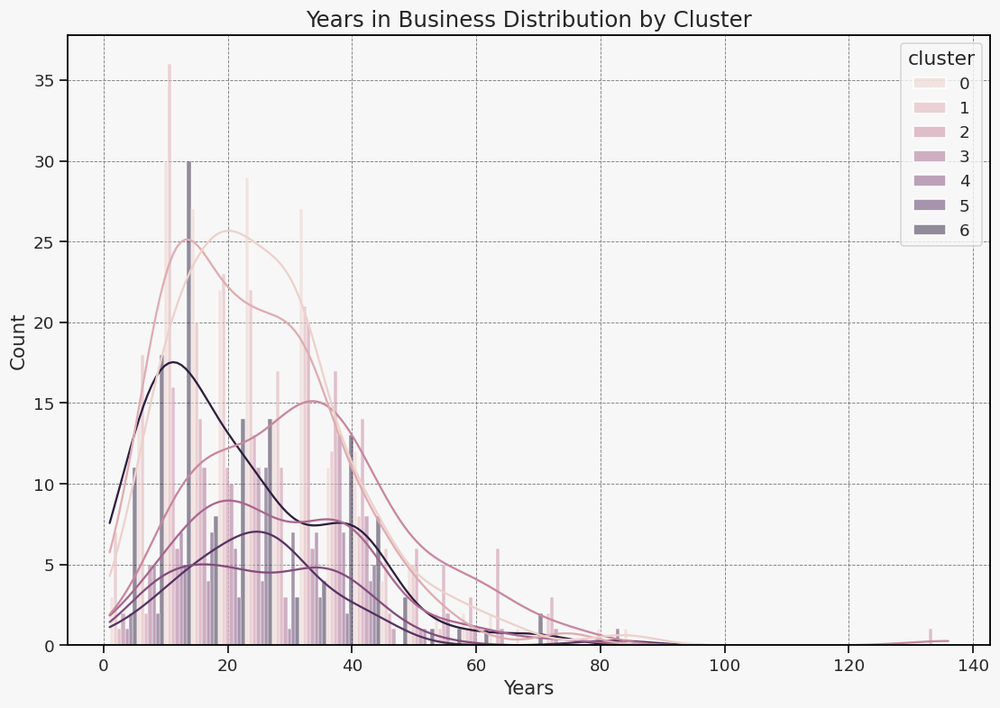

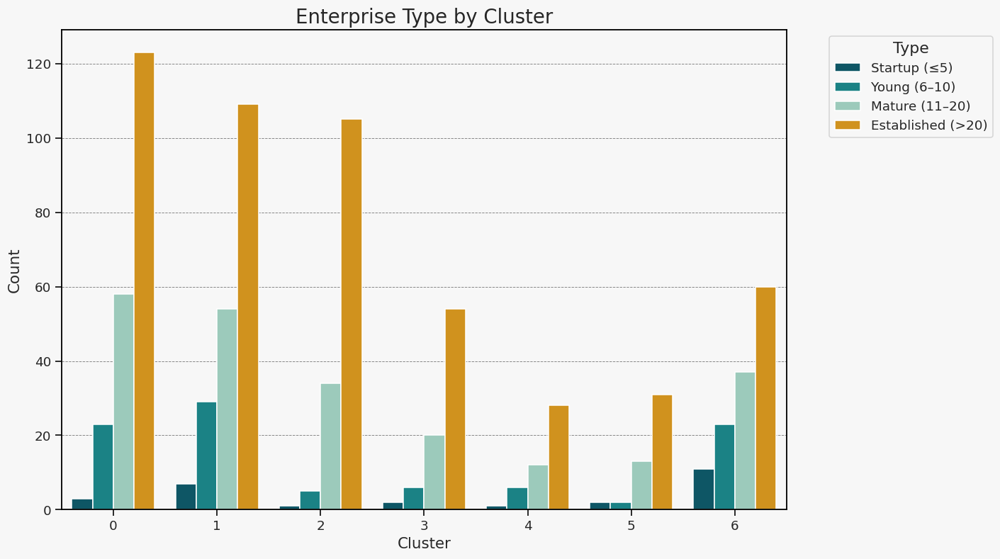

In [493]:
# Histogram of Years in Business by Cluster
plt.figure(figsize=(12, 8))
sns.histplot(data=df1_kmodes, x='years_in_business', hue='cluster', multiple='dodge', kde=True)
plt.title('Years in Business Distribution by Cluster', fontsize=16)
plt.xlabel('Years')
plt.grid(True)
plt.show()


plt.figure(figsize=(12,8))
sns.countplot(x='cluster', hue='business_age_group', data=df1_kmodes)
plt.title('Enterprise Type by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

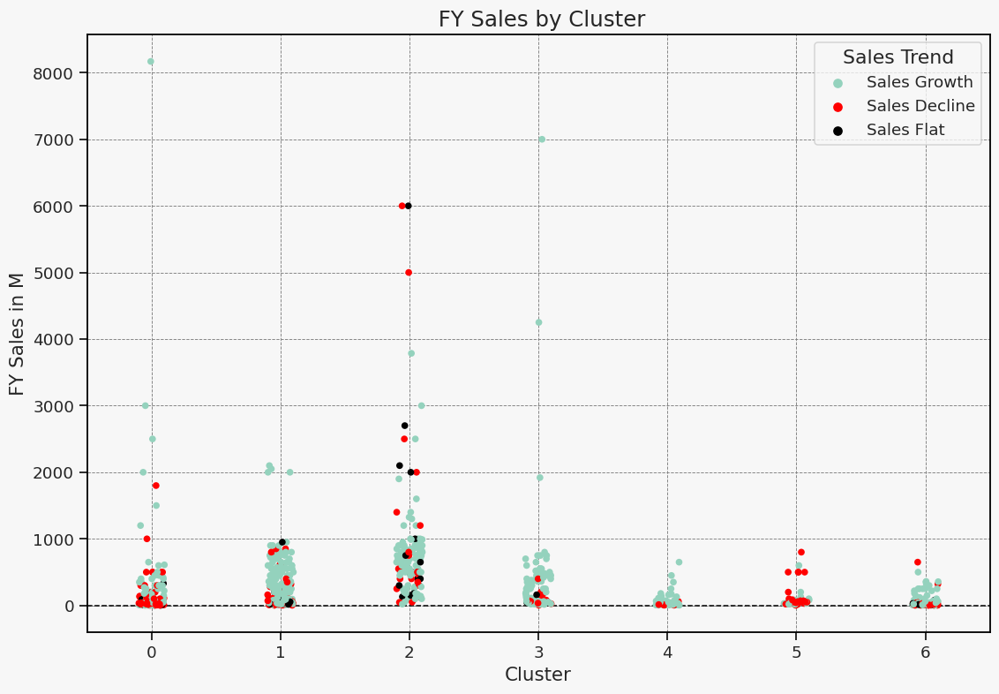

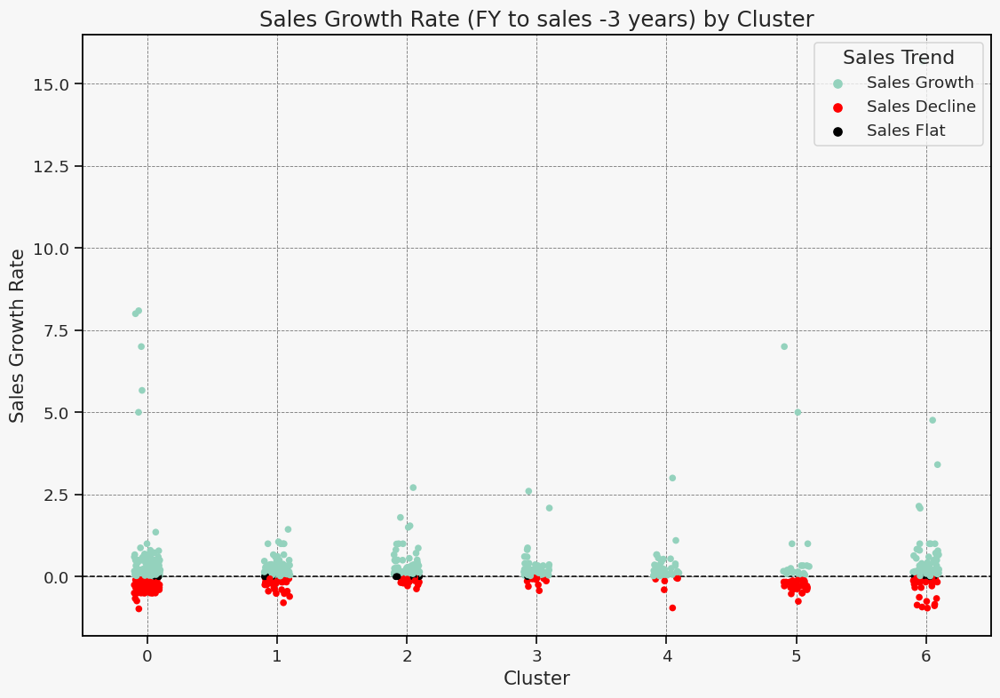

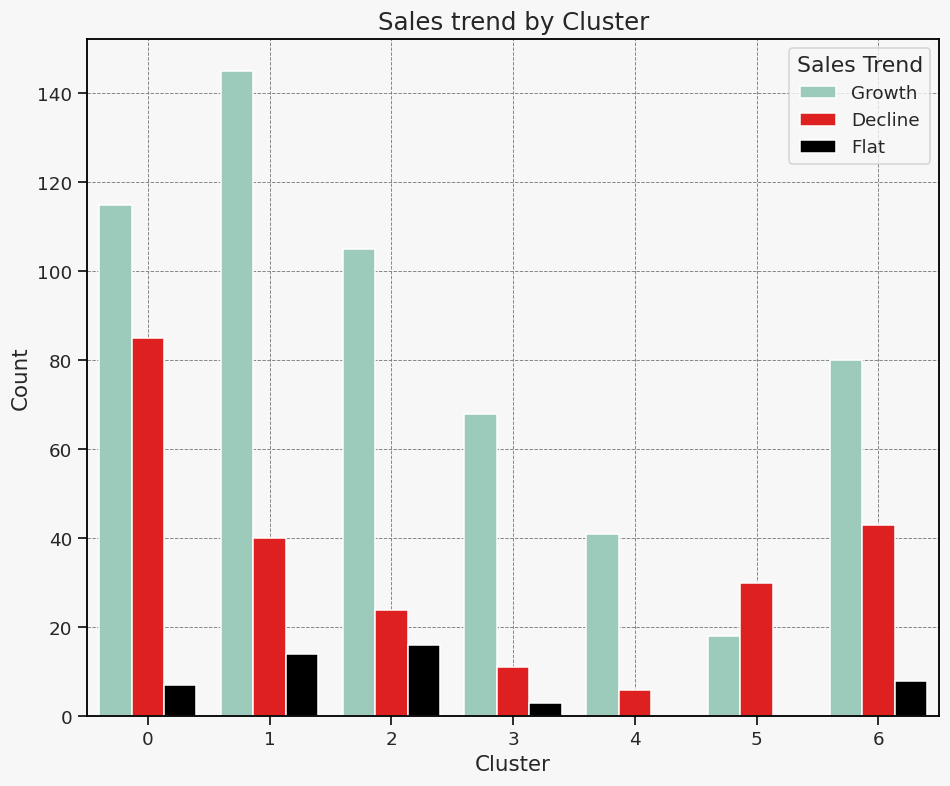

In [494]:


plt.figure(figsize=(12, 8))
sns.stripplot(data=df1_kmodes, x='cluster', y='FY_sales_M', hue='sales_trend',
    palette={
        'Growth': '#94d2bd',
        'Flat': 'black',
        'Decline': 'red'
    })
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.title(' FY Sales by Cluster', fontsize=16)
plt.grid(True)
plt.xlabel('Cluster')
plt.ylabel('FY Sales in M')
handles, labels = plt.gca().get_legend_handles_labels()

custom_labels = {
    'Growth': 'Sales Growth',
    'Flat': 'Sales Flat',
    'Decline': 'Sales Decline'
}
new_labels = [custom_labels.get(label, label) for label in labels]

plt.legend(handles, new_labels, title='Sales Trend', loc='upper right')
plt.show()



#Sales rate current FY vs 3 years ago sales
plt.figure(figsize=(12, 8))
sns.stripplot(data=df1_kmodes, x='cluster', y='sales_diff_rate', hue='sales_trend',
    palette={
        'Growth': '#94d2bd',
        'Flat': 'black',
        'Decline': 'red'
    })
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.title('Sales Growth Rate (FY to sales -3 years) by Cluster', fontsize=16)
plt.grid(True)
plt.xlabel('Cluster')
plt.ylabel('Sales Growth Rate')
handles, labels = plt.gca().get_legend_handles_labels()

custom_labels = {
    'Growth': 'Sales Growth',
    'Flat': 'Sales Flat',
    'Decline': 'Sales Decline'
}

 #custom_palette = ["#005f73", "#0a9396", "#94d2bd", "#ee9b00", "#ca6702"]
new_labels = [custom_labels.get(label, label) for label in labels]

plt.legend(handles, new_labels, title='Sales Trend', loc='upper right')
plt.show()

plt.figure(figsize=(10, 8))
sns.countplot(data=df1_kmodes, x='cluster', hue= 'sales_trend',    palette={
        'Growth': '#94d2bd',
        'Flat': 'black',
        'Decline': 'red'
    })
plt.title('Sales trend by Cluster', fontsize=16)
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.grid(True)
plt.legend(title='Sales Trend', loc='upper right')
plt.show()

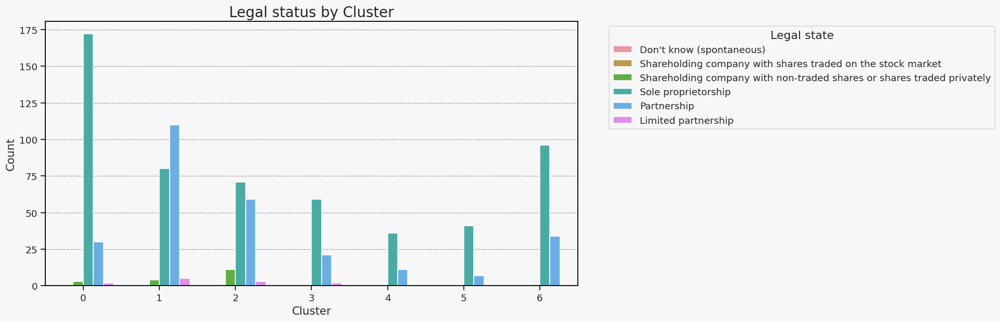

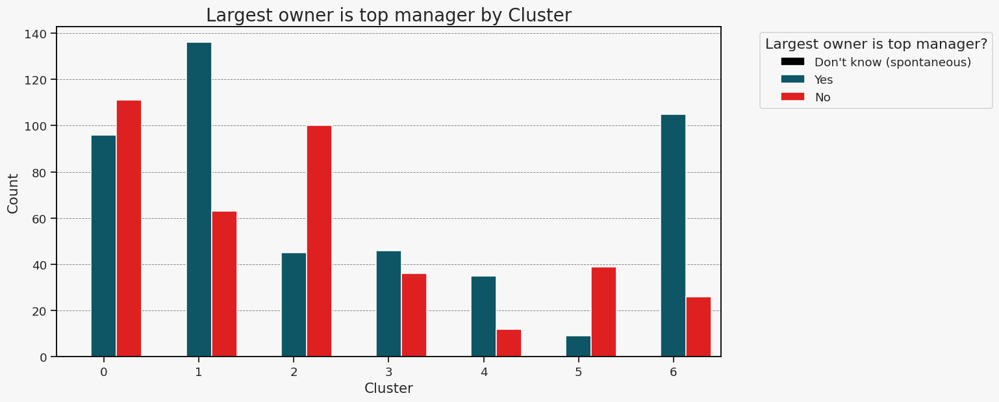

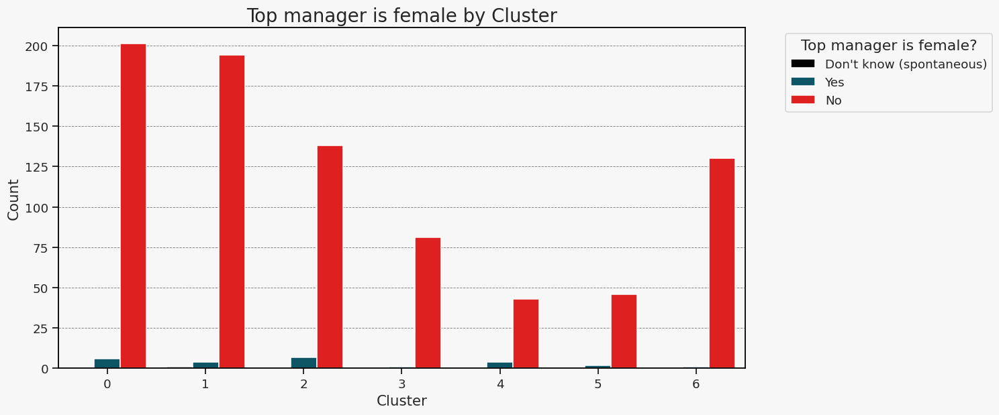

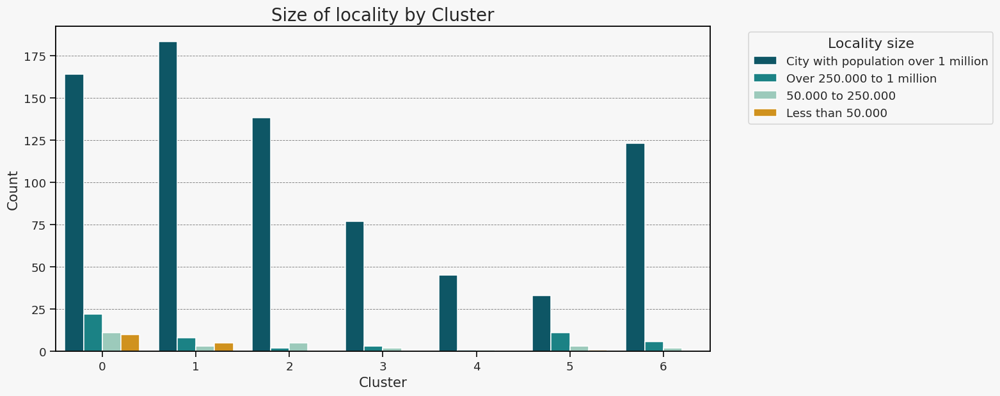

In [495]:
#  legal status
plt.figure(figsize=(12,6))
sns.countplot(x='cluster', hue='legal_status', data=df1_kmodes)
plt.title('Legal status by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Legal state', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# largest owner is top manager
plt.figure(figsize=(12,6))
sns.countplot(x='cluster', hue='largest_owner_top_mngr', data=df1_kmodes, palette = {'Yes':'#005f73','No':'Red',"Don't know (spontaneous)":'Black'})
plt.title('Largest owner is top manager by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Largest owner is top manager?', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#  top manager is female
plt.figure(figsize=(12,6))
sns.countplot(x='cluster', hue='top_mngr_female', data=df1_kmodes, palette = {'Yes':'#005f73','No':'Red',"Don't know (spontaneous)":'Black'})
plt.title('Top manager is female by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Top manager is female?', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# size of locality
plt.figure(figsize=(12,6))
sns.countplot(x='cluster', hue='size_of_locality', data=df1_kmodes)
plt.title('Size of locality by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Locality size', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

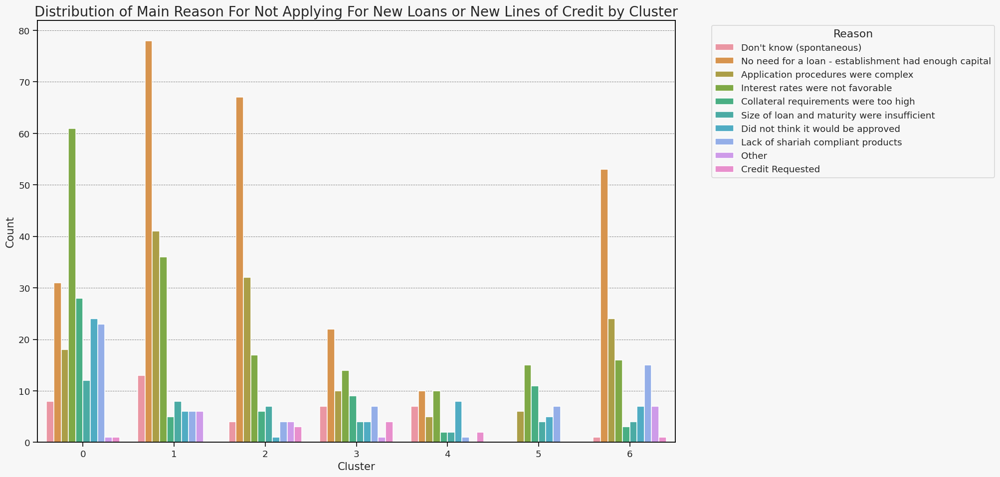

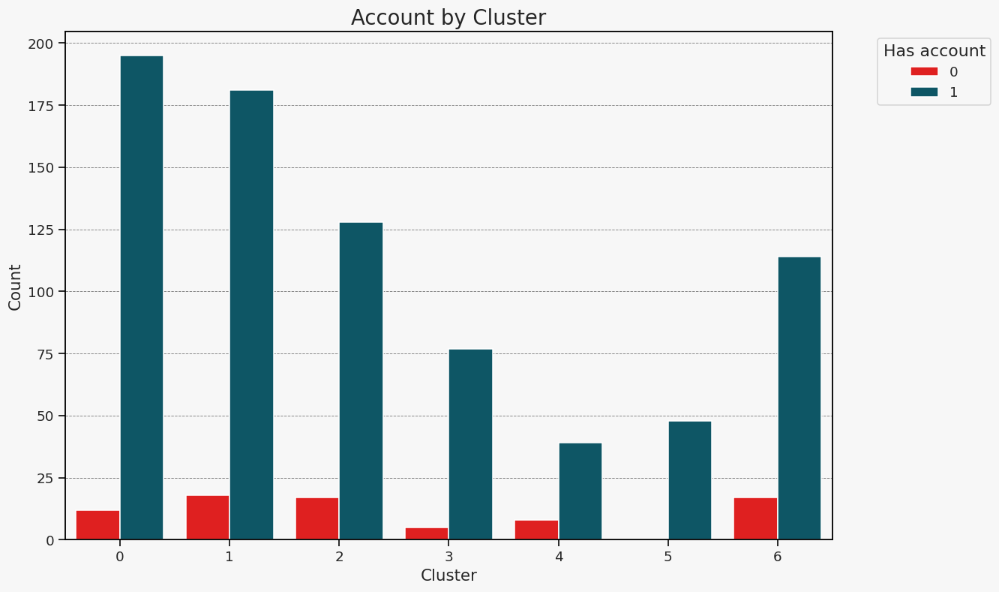

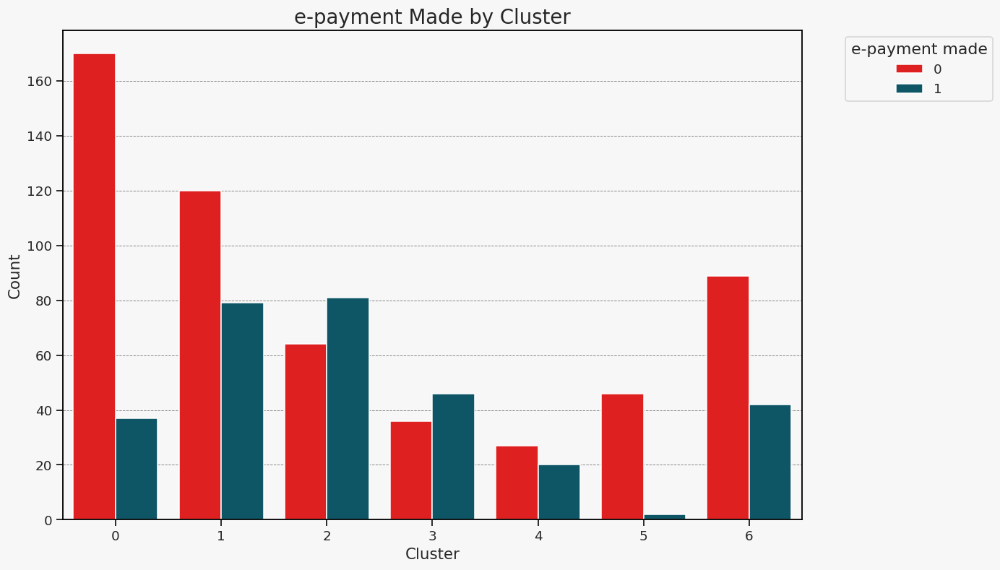

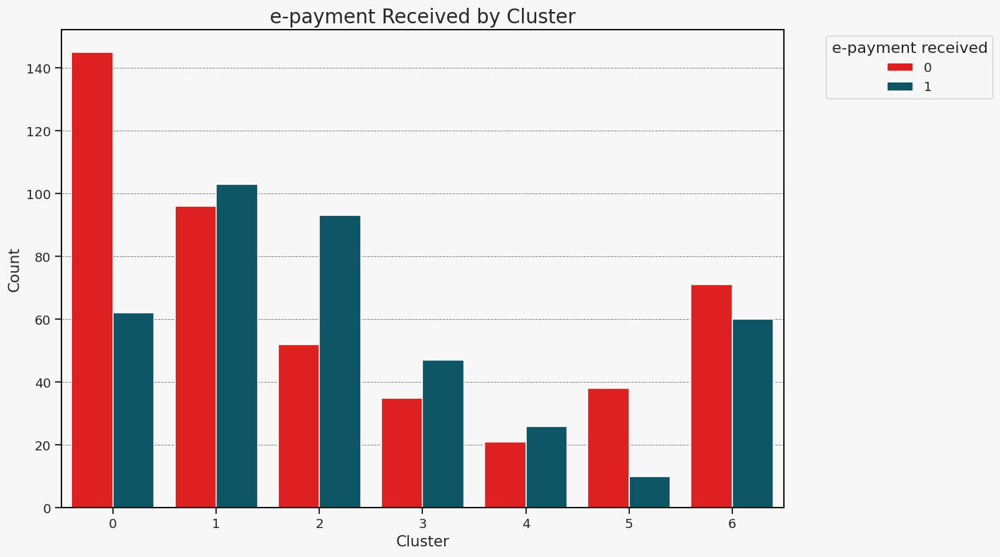

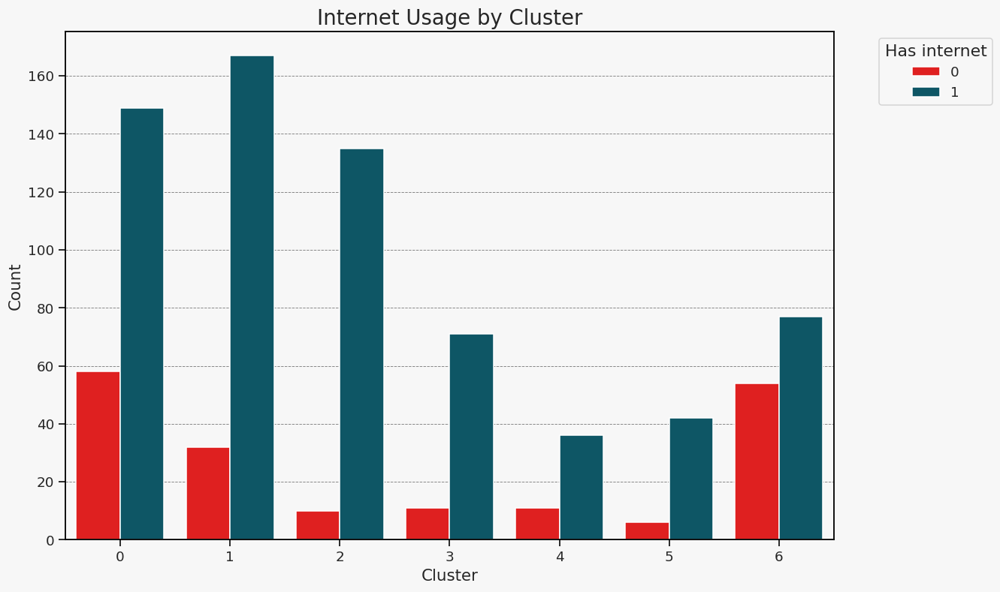

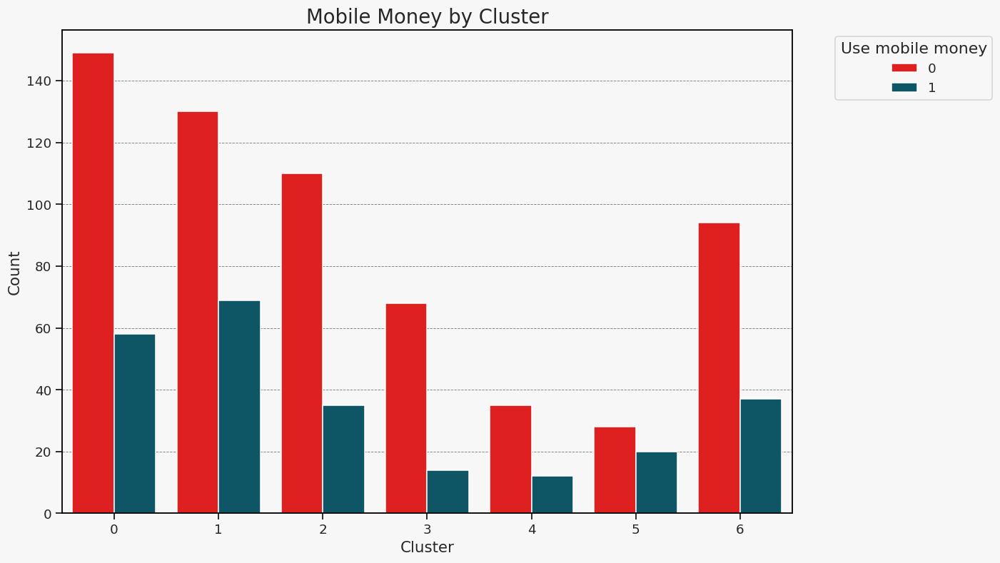

In [496]:
plt.figure(figsize=(15,10))
sns.countplot(x='cluster', hue='main_reason_no_loan_application', data=df1_kmodes)
plt.title('Distribution of Main Reason For Not Applying For New Loans or New Lines of Credit by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Reason', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


plt.figure(figsize=(12,8))
sns.countplot(x='cluster', hue='has_account', data=df1_kmodes, palette = {1:'#005f73',0:'Red'})
plt.title('Account by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Has account', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


plt.figure(figsize=(12,8))
sns.countplot(x='cluster', hue='mak_epayment', data=df1_kmodes, palette = {1:'#005f73',0:'Red'})
plt.title('e-payment Made by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='e-payment made', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


plt.figure(figsize=(12,8))
sns.countplot(x='cluster', hue='rec_epayment', data=df1_kmodes, palette = {1:'#005f73',0:'Red'})
plt.title('e-payment Received by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='e-payment received', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

plt.figure(figsize=(12,8))
sns.countplot(x='cluster', hue='internet_usage', data=df1_kmodes, palette = {1:'#005f73',0:'Red'})
plt.title('Internet Usage by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Has internet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

plt.figure(figsize=(12,8))
sns.countplot(x='cluster', hue='mobile_money_usage', data=df1_kmodes, palette = {1:'#005f73',0:'Red'})
plt.title('Mobile Money by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Use mobile money', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#missing access to finance

<Figure size 1650x1100 with 0 Axes>

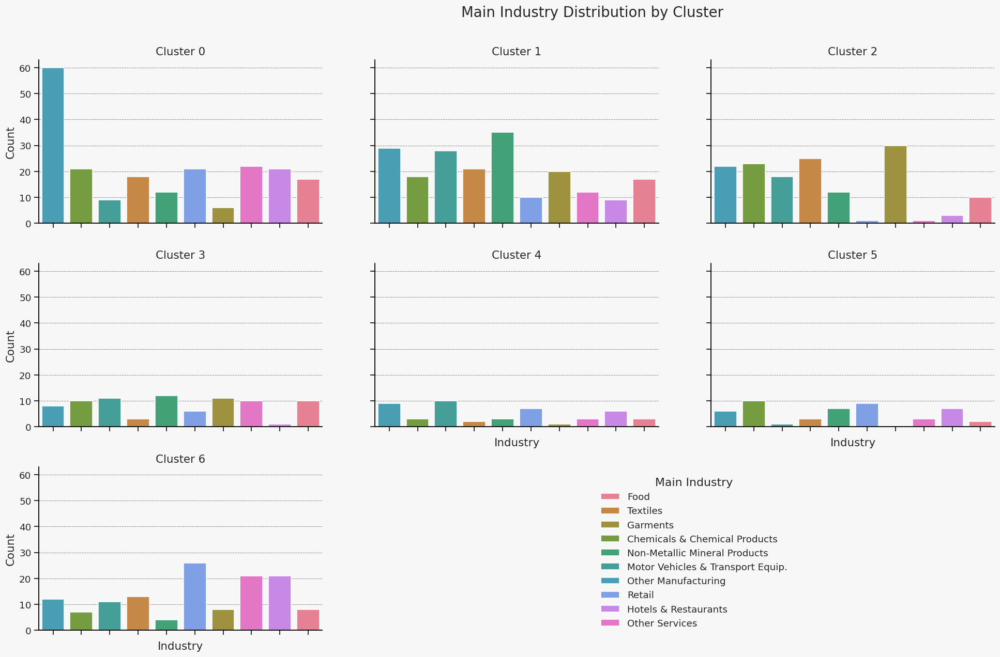

/tmp/ipykernel_31/1561968279.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
/tmp/ipykernel_31/1561968279.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['industry']= subset['industry'].cat.remove_unused_categories()


<Figure size 1650x1100 with 0 Axes>

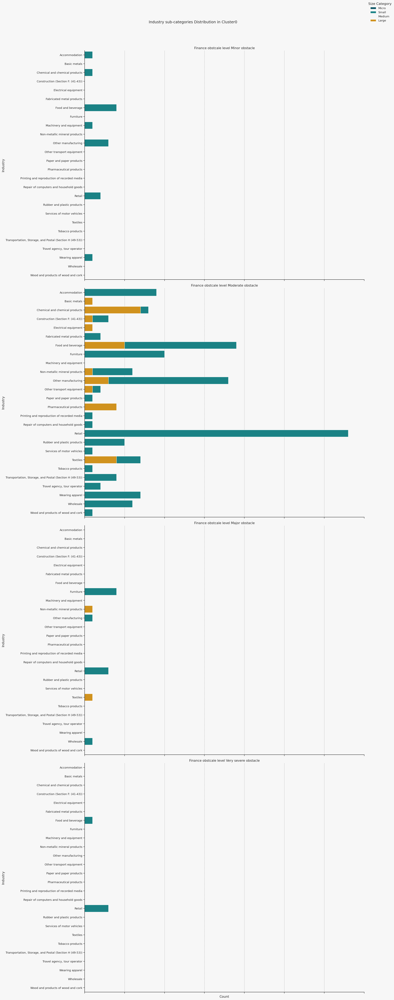

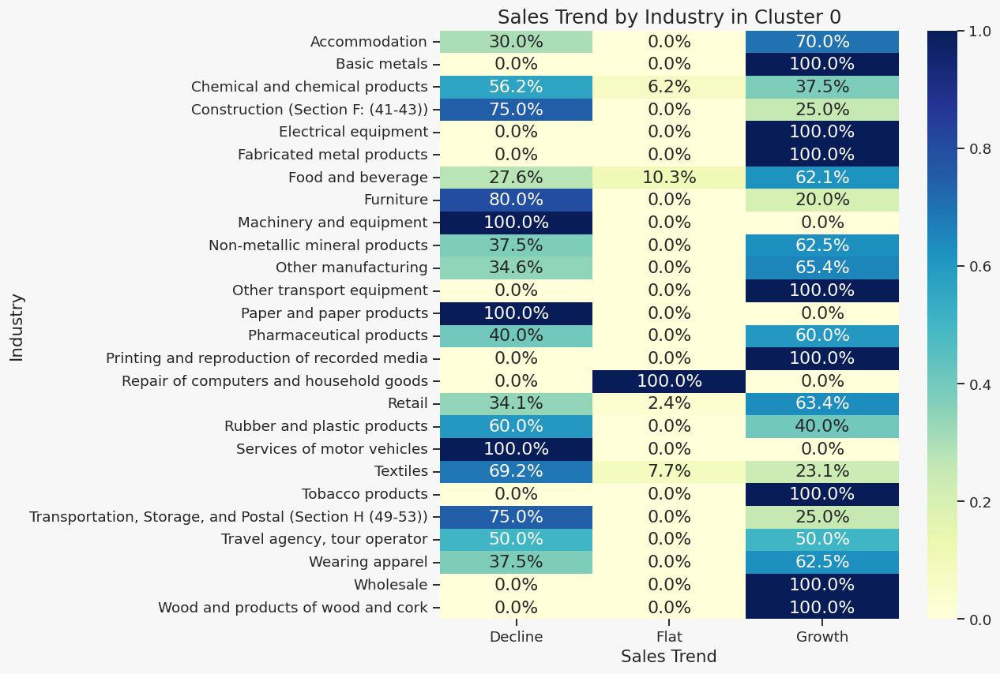

/tmp/ipykernel_31/1561968279.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
/tmp/ipykernel_31/1561968279.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['industry']= subset['industry'].cat.remove_unused_categories()


<Figure size 1650x1100 with 0 Axes>

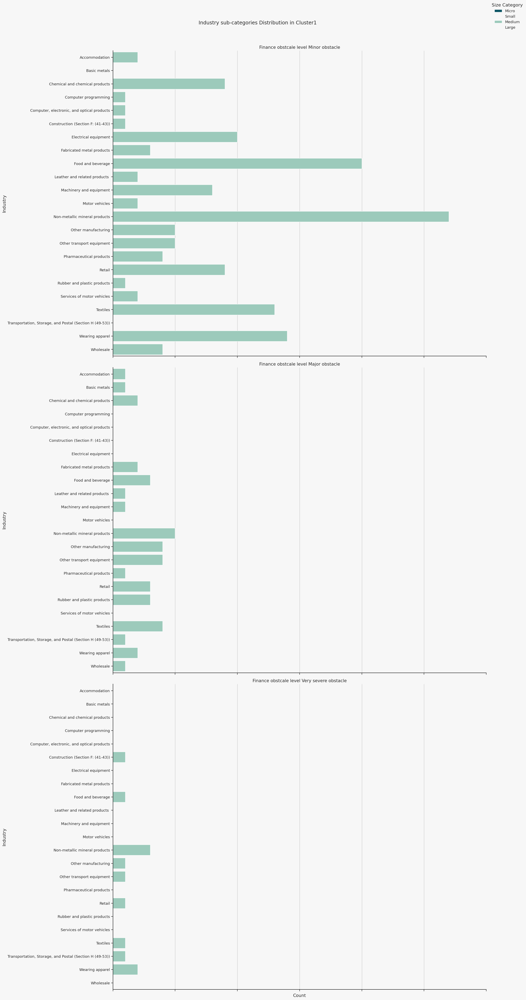

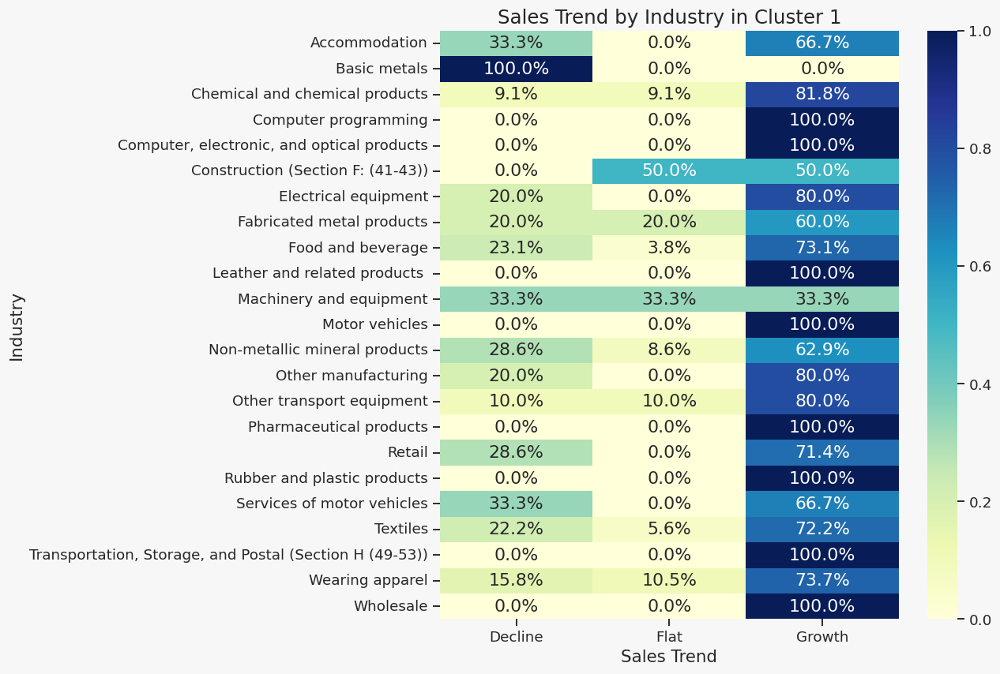

/tmp/ipykernel_31/1561968279.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
/tmp/ipykernel_31/1561968279.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['industry']= subset['industry'].cat.remove_unused_categories()


<Figure size 1650x1100 with 0 Axes>

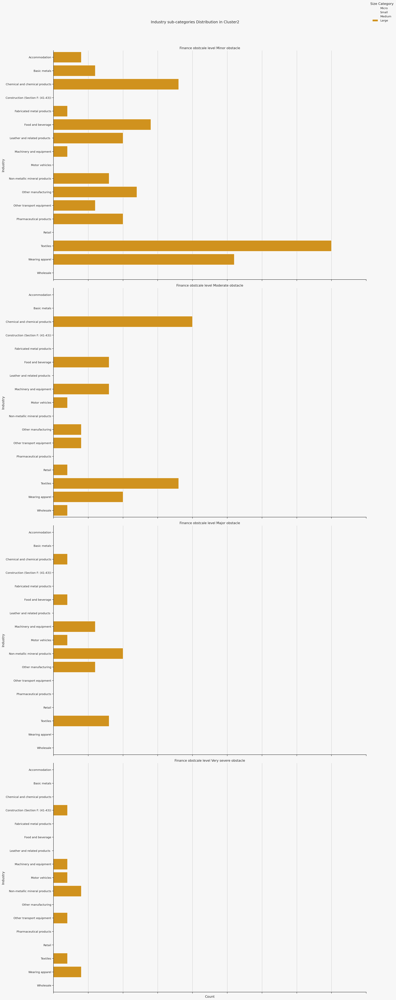

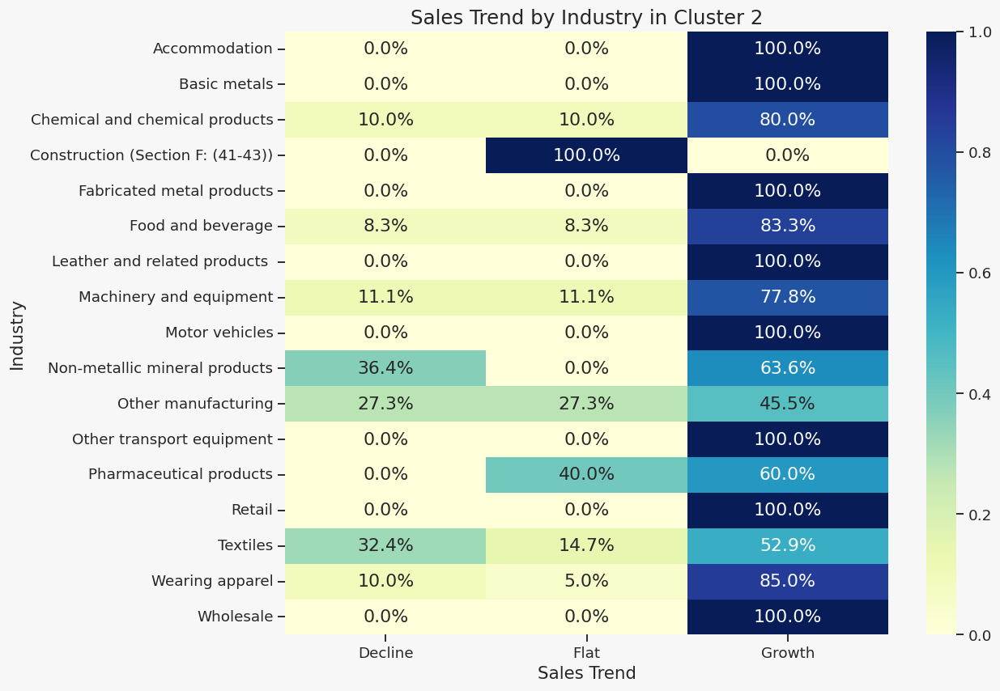

/tmp/ipykernel_31/1561968279.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
/tmp/ipykernel_31/1561968279.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['industry']= subset['industry'].cat.remove_unused_categories()


<Figure size 1650x1100 with 0 Axes>

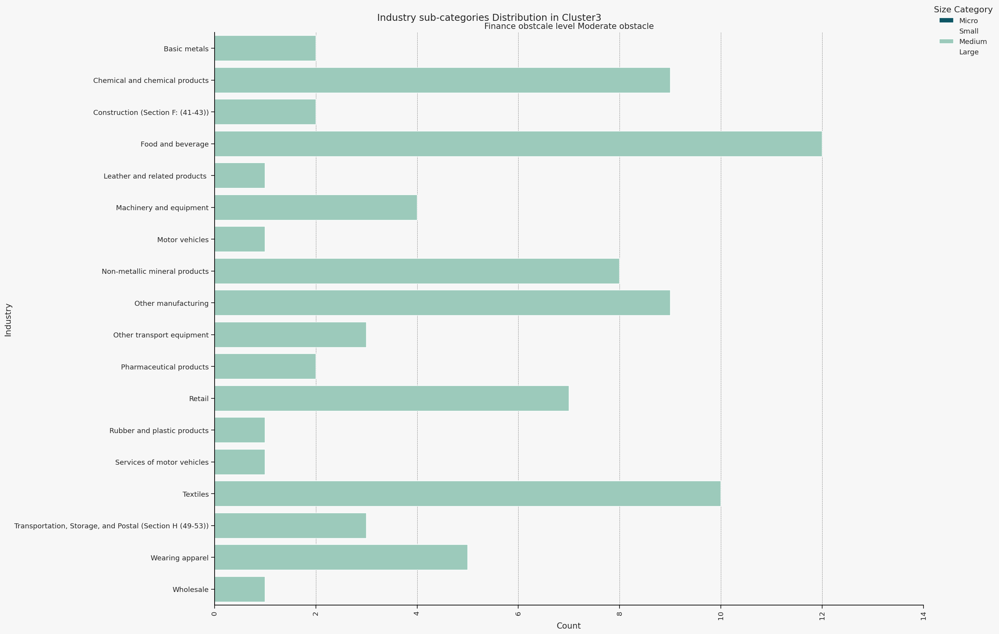

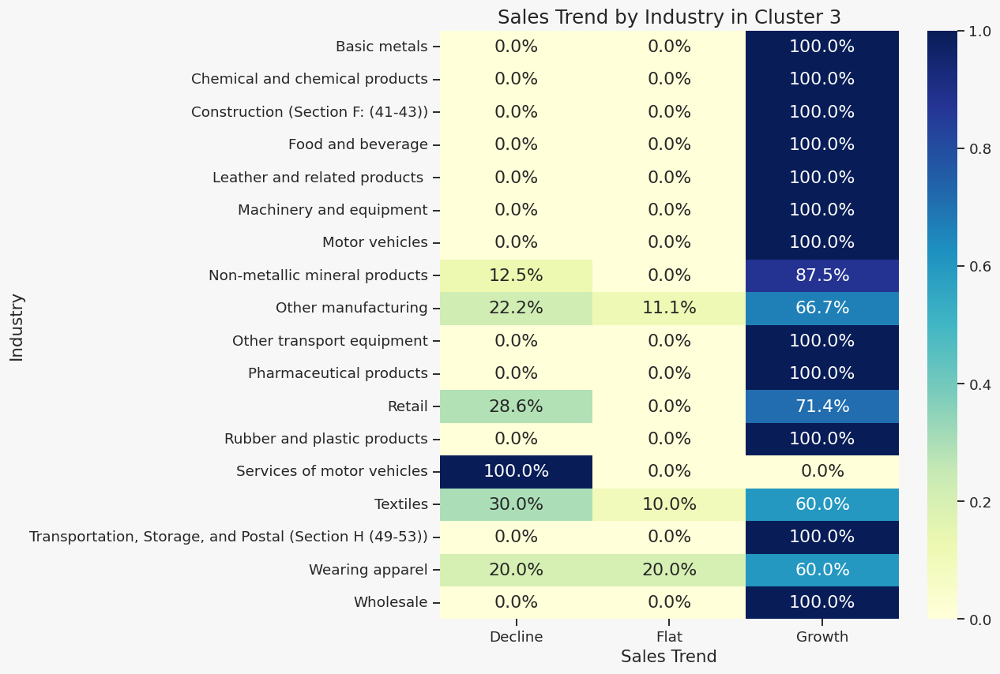

/tmp/ipykernel_31/1561968279.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
/tmp/ipykernel_31/1561968279.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['industry']= subset['industry'].cat.remove_unused_categories()


<Figure size 1650x1100 with 0 Axes>

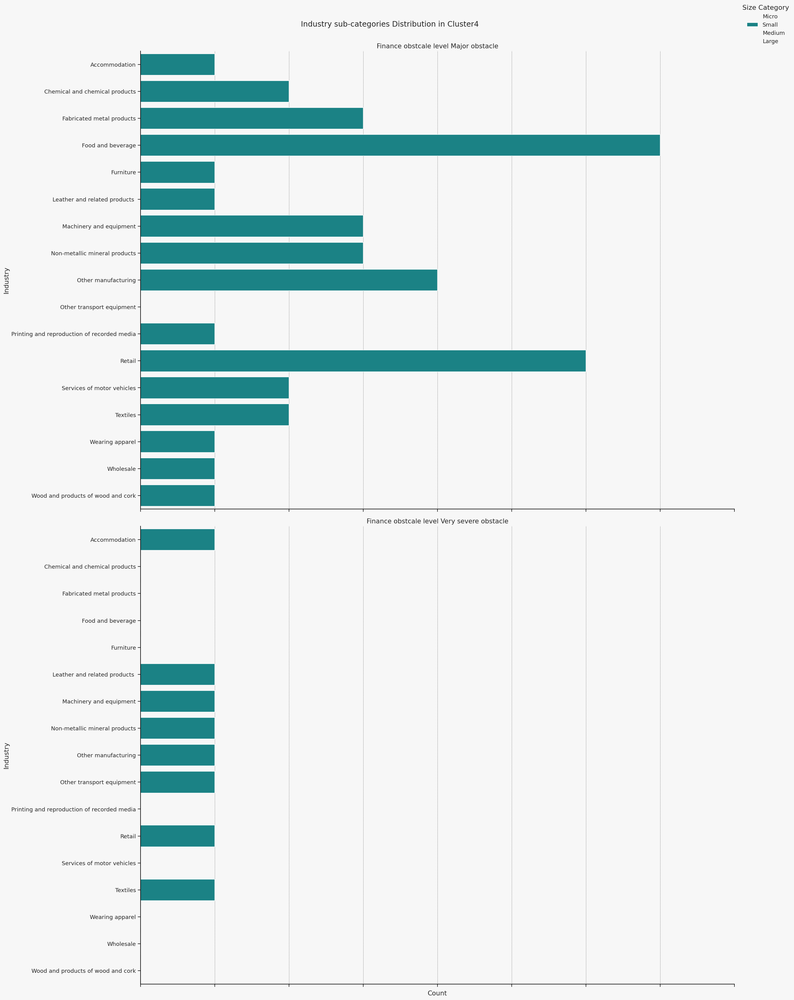

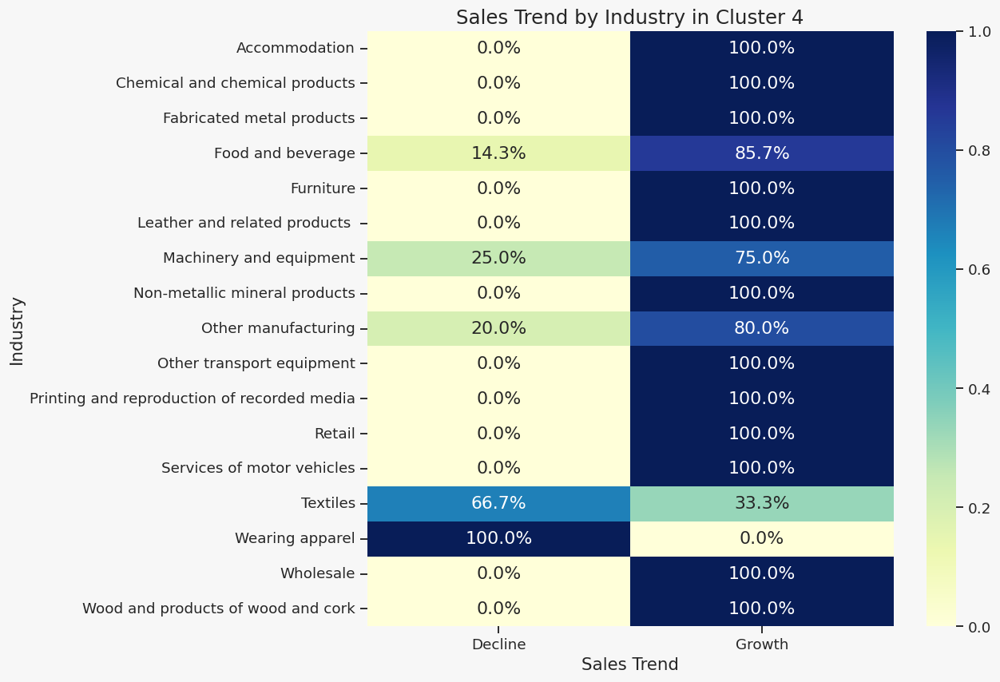

/tmp/ipykernel_31/1561968279.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
/tmp/ipykernel_31/1561968279.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['industry']= subset['industry'].cat.remove_unused_categories()


<Figure size 1650x1100 with 0 Axes>

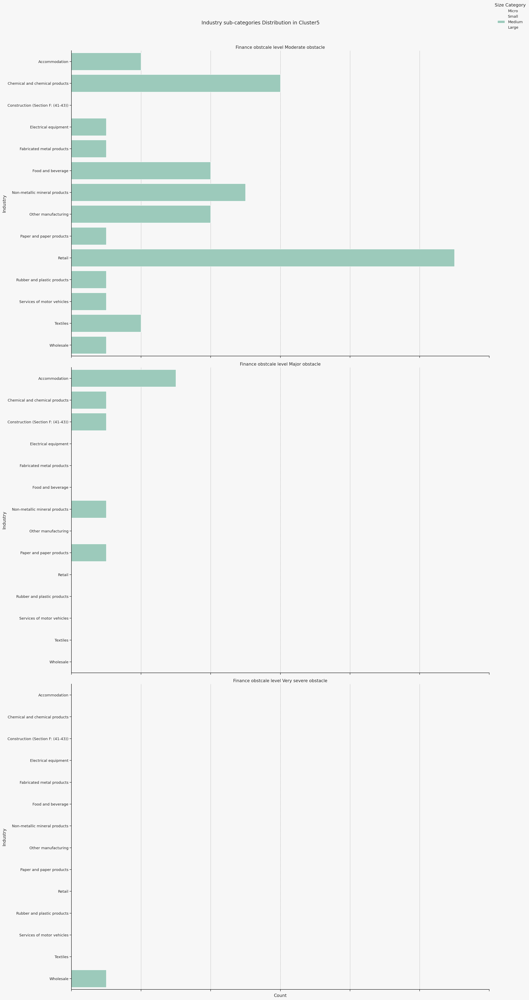

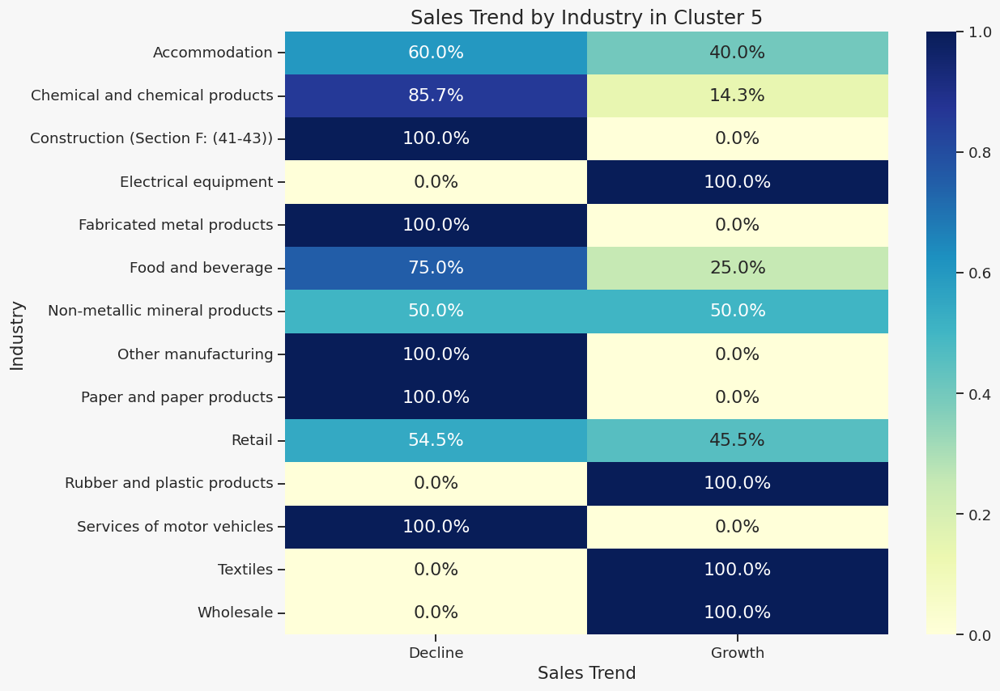

/tmp/ipykernel_31/1561968279.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
/tmp/ipykernel_31/1561968279.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['industry']= subset['industry'].cat.remove_unused_categories()


<Figure size 1650x1100 with 0 Axes>

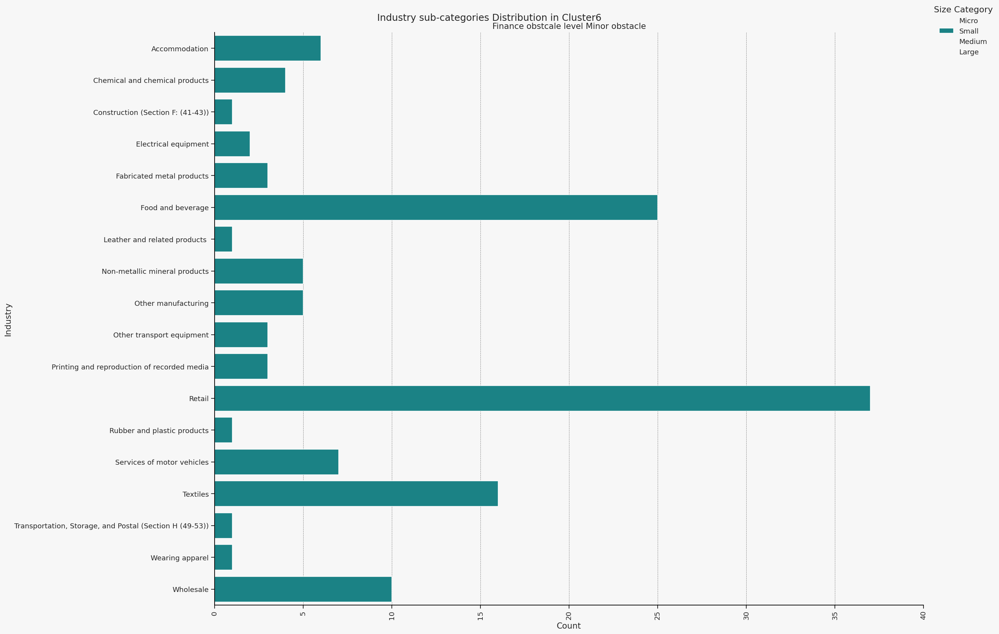

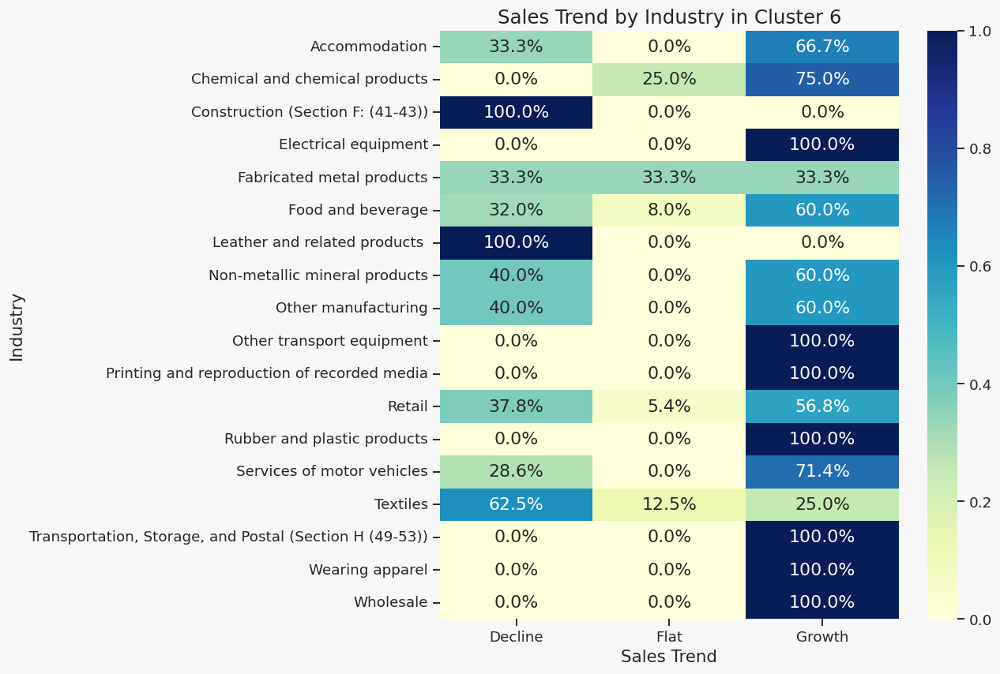

In [499]:


warnings.filterwarnings("ignore", category=FutureWarning)

plt.figure(figsize=(15,10))

    
g = sns.FacetGrid(
    df1_kmodes,
    col="cluster",
    col_wrap=3,
    height=4,
    aspect=1.5,
    hue="global_industry"
)


g.map_dataframe(
    sns.countplot,
    x="global_industry",
    order=df1_kmodes['global_industry'].value_counts().index
)

# Style
g.set_titles("Cluster {col_name}")
g.set_axis_labels("Industry", "Count")
g.set_xticklabels(rotation=90)

# Legend
g.add_legend(title="Main Industry", bbox_to_anchor=(0.5, 0.3), loc='upper left')
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Main Industry Distribution by Cluster', fontsize=18)

plt.show()



clusters = sorted(df1_kmodes['cluster'].unique())
for cluster in clusters:
    subset = df1_kmodes[df1_kmodes['cluster']== cluster]
    subset['finance_obstcale_level']= subset['finance_obstcale_level'].cat.remove_unused_categories()
    subset['industry']= subset['industry'].cat.remove_unused_categories()


    plt.figure(figsize=(15,10))
    g = sns.FacetGrid(subset,
    col="finance_obstcale_level",
    col_wrap=1,
    height=15,
    aspect=1.5,
    hue="actual_size_category"                  )


    g.map_dataframe(
    sns.countplot,
    y="industry"
    )

    # Style
    g.set_titles("Finance obstcale level {col_name}")
    g.set_axis_labels("Count", "Industry")
    g.set_xticklabels(rotation=90)

    # Legend
    g.add_legend(title="Size Category", loc='upper right')
    g.fig.subplots_adjust(top=0.95)
    g.fig.suptitle('Industry sub-categories Distribution in Cluster'+ str(cluster), fontsize=16)

    plt.show()

    # Cross-tab: count of companies per (industry, sales_trend)
    heatmap_data = pd.crosstab(subset['industry'], subset['sales_trend'])
    # Normalize each row to sum to 1 (percent distribution by industry)
    heatmap_data_normalized = heatmap_data.div(heatmap_data.sum(axis=1), axis=0)
    plt.figure(figsize=(12, 8))
    sns.heatmap(heatmap_data_normalized, annot=True, fmt=".1%", cmap="YlGnBu")

    plt.title("Sales Trend by Industry in Cluster "+ str(cluster), fontsize=16)
    plt.xlabel("Sales Trend")
    plt.ylabel("Industry")
    plt.tight_layout()
    plt.show()

In [498]:
# Group by Cluster
financial_profile = df1_kmodes.groupby('cluster').agg({
    'access_formal_financing': lambda x: (x == 1).mean() * 100,
    'main_reason_no_loan_application': lambda x: x.mode().iloc[0],
    'finance_obstcale_level' : lambda x: x.mode().iloc[0],
    'has_account': lambda x: (x == 1).mean() * 100,
    'mak_epayment': lambda x: (x == 1).mean() * 100,
    'rec_epayment': lambda x: (x == 1).mean() * 100,
    'internet_usage': lambda x: (x == 1).mean() * 100,
    'mobile_money_usage': lambda x: (x == 1).mean() * 100,
    'sales_diff_rate': 'median',
    'FY_sales_M': 'median',
    'sales_trend': lambda x: x.mode().iloc[0],
    'head_count_growth_rate': 'median',
    'years_in_business': 'median',
    'legal_status': lambda x: x.mode().iloc[0],
    'largest_owner_top_mngr': lambda x: (x == 'Yes').mean() * 100,
    'size_of_locality': lambda x: x.mode().iloc[0],
    'global_industry': lambda x: x.mode().iloc[0],
    'industry': lambda x: x.mode().iloc[0]

}).reset_index()

# Show the summarized table
print("\n📋 Financial & Growth Profile Table by Cluster:")
print(financial_profile)



📋 Financial & Growth Profile Table by Cluster:
   cluster  access_formal_financing  \
0        0                46.376812   
1        1                47.738693   
2        2                50.344828   
3        3                60.975610   
4        4                42.553191   
5        5                77.083333   
6        6                12.977099   

                     main_reason_no_loan_application finance_obstcale_level  \
0                  Interest rates were not favorable      Moderate obstacle   
1  No need for a loan - establishment had enough ...         Minor obstacle   
2  No need for a loan - establishment had enough ...         Minor obstacle   
3  No need for a loan - establishment had enough ...      Moderate obstacle   
4  No need for a loan - establishment had enough ...         Major obstacle   
5                  Interest rates were not favorable      Moderate obstacle   
6  No need for a loan - establishment had enough ...         Minor obstacle   

   has

###

<h1 style="background-color:#F5FBEF; color:#6AA84F; padding:10px; border-radius:8px; font-family:'Georgia', serif;">
Results</h1>


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 1:</b> Finance is a major issue for enterprises:
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 66% of the enterprises reported that finance represents to a certain extend an obstacle
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 14% of the enterprises report that finance is their biggest obstacle and Access to Finance come third place in term of biggest obstacles
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 Despite that around 91% of enterprise has checking or saving account ONLY arround 42% have access to formal financing
</div>
<div style="background-color:#FDEBD0;
            border-left:6px solid #D35400;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
⚠️ <b>Note:</b> 44.5% of the enterprises who answered that they  <code>have enough capital</code>  also reported that they <code>perceive finance as an obstacle</code> to a certain degree. </div>


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 2:</b> There are enterprises which dont have any account in all size categories :
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 Arround 9% of enterprises dont have any account; Medium and large enterprises represent 46.5% of them
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
           

<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 3:</b> Enterprises DON't apply to loans :
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 In the last FY, 95% of enterprises didnt apply to a loan

* Reasons:
    * No need for a loan - establishment had enough capital => 45% ;
    * Interest rates were not favorable => 15.4%;
    * Application procedures were complex => 11.5%;
    * Lack of shariah compliant products => 5.8%,
    * Collateral requirements were too high => 5.6%;
    * Did not think it would be approved => 4.7%,
    * Size of loan and maturity were insufficient => 4%;


</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;

<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 4:</b> E-payments and mobile money are not widely adopted by enterprises:
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 54.0% of enterprises receive e-payments
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 66.5% of enterprises make e-payments
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 25.7% of enterprises uses Mobile payments
</div>


 <div style="background-color:white;
            border-left:6px solid #f7f7f7;
            padding:10px 15px;
            font-size:100%;
            border-radius:6px;
            font-family:'Georgia', serif;">
ℹ️ Popularity of payment methods:
  <div>1. Internet and mobile banking, including direct debit transfer</div>
  <div>2. Other</div>
  <div>3. Debit cards</div>
  <div>4. Credit cards</div>
  <div>5. Mobile money</div>
  <div>6. E-money and e-wallet, excluding mobile money</div>
</div>


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 5:</b> The majority of Enterprises are long-standing companies in business :
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 Years in bussiness: 
    
* Established (>20 years)    55.9%
* Mature (11–20 years)       30.2%
* Young (6–10 years)         10.5%
* Startup (≤5 years)          3.4%
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 6:</b> Food & Beverage and Retail are the dominiant industries in all regions:
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 Industry ranking per region:
    
* Punjab
    1.  Textiles => 18%
    2.  Food and beverage => 10%
    3.  Chemical and chemical products => 9%
    4.  Retail => 9%
* Sindh
    1.  Retail => 18%
    2.  Food and beverage => 17%
    3.  Textiles => 10%
* Khyber-Pakhtunkhwa
    1.  Retail => 16%
    2.  Chemical and chemical products => 13%
    3.  Other manufacturing => 13%
    4.  Food and beverage => 13%
* Balochistan
    1. Food and beverage => 24%
    2. Retail => 24%
    3. Non-metallic mineral products => 10%
* Islamabad
    1. Food and beverage => 35%
    2. Retail => 20%
    3. Non-metallic mineral products => 9%
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 7:</b> Punjab is the region with the most Enterprises:
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 
    
* Punjab               43%
* Sindh                20%
* Khyber-Pakhtunkhwa   14%
* Balochistan          12%
* Islamabad            11%
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 8:</b> Ratio of Enterprises accessing to formal finance in Islamabad and Khyber-Pakhtunkhwa is higher than the other regions:
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 Enterprises access to formal finance : Enterprises with NO access to formal finance is 2:1
    
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 9:</b> Small and Medium size Enterprises Punjab and Khyber-Pakhtunkhwa suffer the most to access formal finance:
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 By Clustering Enterprises which reported difficulty to access formal finance. The clusters with the most difficulties are:
    
    * 🎯 Cluster 0:
        * Region: Khyber-Pakhtunkhwa
        * Size Category: Small
        * Finance Obstacle Level: Moderate obstacle

    * 🎯 Cluster 3:
        * Region: Punjab
        * Size Category: Medium
        * Finance Obstacle Level: Moderate obstacle

    * 🎯 Cluster 4:
        * Region: Punjab
        * Size Category: Small
        * Finance Obstacle Level: Major obstacle

    * 🎯 Cluster 5:
        * Region: Khyber-Pakhtunkhwa
        * Size Category: Medium
        * Finance Obstacle Level: Moderate obstacle
 
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;


<div style="background-color:#F5F0E1;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:120%;
            border-radius:6px;
            font-family:'Georgia', serif;">
💡 <b>Insight 10:</b> Interest rates is the main obstacle to access finance for Cluster 0 and Cluster 5:
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;
            padding:10px 15px;
            font-size:110%;
            border-radius:6px;
            font-family:'Segoe UI', sans-serif;">
📈 Interest rate was not favorable is the most frequent answer in both clusters.
    
</div>
<div style="background-color:#FAF9F6;
            border-left:6px solid #6AA84F;

<div style="
    margin-top: 30px;
    padding: 12px 20px;
    background-color: #F0F4F8;
    border-top: 2px solid #6AA84F;
    border-radius: 0 0 8px 8px;
    font-family: 'Segoe UI', sans-serif;
    font-size: 13px;
    color: #555;
    display: flex;
    justify-content: space-between;
    align-items: center;
    flex-wrap: wrap;
">
    <div>
    🖊️ <b>Author:</b> MELSHAMA  
    🔗 <a href="https://github.com/MELSHAMA/DataKit---Financial-Inclusion-" target="_blank" style="color: #2A7AB9;">
      View on GitHub
    </a>
    <br>
    🗓 <b>Last Updated:</b> May 2025 | v1.0
    </div>

</div>